In [1]:
# Cell 1 – Imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import networkx as nx
import json
import os
from datetime import datetime, timedelta
from pathlib import Path


In [3]:
from pathlib import Path

# Folder that contains all the PNGs
base_dir = Path(r"C:\Users\rasha_ejuf17z\Downloads\0Today\pig-butchering-master")

# Build the dictionary:  {"file_stem": Path(...), …}
images = {p.stem: p for p in base_dir.glob("*.png")}  # use .rglob for sub-folders

# Quick sanity-check
print(f"Loaded {len(images)} images.")


Loaded 22 images.


In [4]:
for title, path in images.items():
    if not path.exists():
        print(f"Warning: {title} image not found at {path}")

In [5]:
# Cell 2 – Visualization settings and output directory

# Configure visualization aesthetics
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
sns.set_style("whitegrid")

# Ensure output directory exists (Windows path)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)


In [6]:
# Cell 3 – Initialize main data structure: money_laundering_data

money_laundering_data = {
    "financial_flows": {
        "global_losses": {
            "2020": 15.0,  # Billion USD
            "2021": 18.5,
            "2022": 20.5,
            "2023": 21.0,
            "2024": 44.0,  # Annual SE Asia losses
            "cumulative_2020_2024": 75.0,
            "projected_2025_global": 142.83,
            "projected_2025_us": 7.54
        },
        "regional_distribution": {
            "United States": 3.96,
            "Australia": 2.77,
            "Southeast Asia": 44.0,
            "Other Regions": 24.27
        },
        "conversion_patterns": {
            "crypto_conversion_48hrs": 0.93,
            "total_crypto_losses_2024": 3.6,
            "tether_seized": 0.225,
            "average_victim_loss": 0.15
        },
        "bank_specific_losses": {
            "TD Bank": {
                "direct_losses": 0.47,
                "fines": 3.0,
                "total_impact": 3.47
            },
            "Chase_BofA_Wells": 0.08,
            "Other_Banks": 1.5
        }
    }
}


In [7]:
# Cell 4 – Extend data structure: banking_network

money_laundering_data["banking_network"] = {
    "primary_banks": {
        "JPMorgan Chase": {
            "involvement_level": "High",
            "losses": 0.03,
            "vulnerabilities": ["Account opening", "Wire transfers"],
            "new_accounts_annual": 25000000
        },
        "Bank of America": {
            "involvement_level": "High",
            "losses": 0.025,
            "vulnerabilities": ["KYC gaps", "Transaction monitoring"],
            "new_accounts_annual": 20000000
        },
        "Wells Fargo": {
            "involvement_level": "Medium",
            "losses": 0.025,
            "vulnerabilities": ["Cross-border transfers"],
            "new_accounts_annual": 15000000
        },
        "TD Bank": {
            "involvement_level": "Critical",
            "losses": 0.47,
            "vulnerabilities": ["AML failures", "Compliance gaps"],
            "new_accounts_annual": 8000000
        },
        "Citibank": {
            "involvement_level": "Medium",
            "losses": 0.15,
            "vulnerabilities": ["International transfers"],
            "new_accounts_annual": 12000000
        },
        "HSBC": {
            "involvement_level": "Medium",
            "losses": 0.12,
            "vulnerabilities": ["Asia-Pacific corridors"],
            "new_accounts_annual": 10000000
        },
        "Deltec Bank": {
            "involvement_level": "High",
            "losses": 0.08,
            "vulnerabilities": ["Crypto integration"],
            "new_accounts_annual": 2000000
        }
    },
    "total_new_accounts_annual": 140000000,
    "vulnerability_score": {
        "account_opening_weaknesses": 0.85,
        "kyc_compliance_gaps": 0.72,
        "transaction_monitoring": 0.68,
        "cross_border_oversight": 0.79
    }
}


In [8]:
# Cell 5 – Extend data structure: crime_syndicates

money_laundering_data["crime_syndicates"] = {
    "Sun Yee On": {
        "origin": "Hong Kong",
        "estimated_revenue": 15.0,  # Billion USD annually
        "primary_operations": ["Cryptocurrency", "Banking fraud", "Romance scams"],
        "geographic_reach": ["Hong Kong", "Mainland China", "Southeast Asia", "North America"]
    },
    "Karen Border Guard Force": {
        "origin": "Myanmar",
        "estimated_revenue": 8.5,
        "primary_operations": ["Pig butchering", "Forced labor", "Crypto conversion"],
        "geographic_reach": ["Myanmar", "Thailand", "Cambodia", "Laos"]
    },
    "14K Triad": {
        "origin": "Hong Kong",
        "estimated_revenue": 6.2,
        "primary_operations": ["Money laundering", "Cybercrime", "Human trafficking"],
        "geographic_reach": ["Hong Kong", "Macau", "Southeast Asia"]
    },
    "Wo Shing Wo": {
        "origin": "Hong Kong",
        "estimated_revenue": 4.8,
        "primary_operations": ["Romance scams", "Investment fraud", "Crypto laundering"],
        "geographic_reach": ["Hong Kong", "Taiwan", "Southeast Asia", "Australia"]
    }
}


In [9]:
# Cell 6 – Extend data structure: geographic_operations

money_laundering_data["geographic_operations"] = {
    "scam_compounds": {
        "Cambodia": {
            "estimated_compounds": 45,
            "estimated_workers": 120000,
            "annual_revenue": 12.5,
            "primary_cities": ["Sihanoukville", "Phnom Penh", "Poipet"]
        },
        "Myanmar": {
            "estimated_compounds": 38,
            "estimated_workers": 85000,
            "annual_revenue": 18.2,
            "primary_cities": ["Myawaddy", "Laukkaing", "Yangon"]
        },
        "Laos": {
            "estimated_compounds": 22,
            "estimated_workers": 45000,
            "annual_revenue": 8.7,
            "primary_cities": ["Golden Triangle SEZ", "Vientiane", "Boten"]
        },
        "Philippines": {
            "estimated_compounds": 15,
            "estimated_workers": 25000,
            "annual_revenue": 4.6,
            "primary_cities": ["Manila", "Cebu", "Clark"]
        }
    },
    "money_flow_routes": {
        "Asia_to_US": {
            "volume": 18.5,
            "primary_methods": ["Wire transfers", "Crypto", "Trade-based"],
            "conversion_rate": 0.89
        },
        "Asia_to_Australia": {
            "volume": 8.2,
            "primary_methods": ["Banking", "Crypto", "Cash"],
            "conversion_rate": 0.91
        },
        "Intra_Asia": {
            "volume": 25.3,
            "primary_methods": ["Crypto", "Underground banking", "Cash"],
            "conversion_rate": 0.95
        }
    }
}


In [10]:
# Cell 7 – Extend data structure: timeline_events

money_laundering_data["timeline_events"] = {
    "2020": [
        {"date": "2020-03-15", "event": "COVID-19 accelerates online scam operations", "impact": 2.5},
        {"date": "2020-08-20", "event": "First major pig butchering cases reported", "impact": 1.8}
    ],
    "2021": [
        {"date": "2021-02-10", "event": "Romance scam losses surge 80%", "impact": 3.2},
        {"date": "2021-09-15", "event": "Crypto integration accelerates", "impact": 4.1},
        {"date": "2021-11-30", "event": "First compound raids in Cambodia", "impact": -0.5}
    ],
    "2022": [
        {"date": "2022-01-25", "event": "Investment scam sophistication increases", "impact": 2.8},
        {"date": "2022-06-12", "event": "Cross-border enforcement cooperation begins", "impact": -0.8},
        {"date": "2022-10-08", "event": "Major crypto seizures ($500M+)", "impact": -1.2}
    ],
    "2023": [
        {"date": "2023-03-20", "event": "AI integration in scam operations", "impact": 3.5},
        {"date": "2023-07-15", "event": "Banking compliance failures exposed", "impact": 2.1},
        {"date": "2023-12-01", "event": "International task force formation", "impact": -1.5}
    ],
    "2024": [
        {"date": "2024-02-28", "event": "Record $44B annual losses reported", "impact": 5.2},
        {"date": "2024-05-15", "event": "TD Bank $3B fine imposed", "impact": -2.1},
        {"date": "2024-08-30", "event": "$225M Tether seizure", "impact": -0.8},
        {"date": "2024-11-10", "event": "Enhanced crypto monitoring deployed", "impact": -1.3}
    ]
}


In [11]:
# Cell 8 – Extend data structure: enforcement_actions

money_laundering_data["enforcement_actions"] = {
    "seizures": {
        "2022": {"crypto": 0.5, "cash": 0.2, "assets": 0.3},
        "2023": {"crypto": 0.8, "cash": 0.15, "assets": 0.45},
        "2024": {"crypto": 1.2, "cash": 0.1, "assets": 0.6}
    },
    "arrests": {
        "2022": 245,
        "2023": 380,
        "2024": 520
    },
    "success_rate": {
        "asset_recovery": 0.12,         # 12% of illicit assets recovered
        "conviction_rate": 0.68,        # Legal follow-through after arrest
        "cross_border_cooperation": 0.45
    }
}


In [15]:
# Cell 9 – Extend data structure: crypto_ecosystem

money_laundering_data["crypto_ecosystem"] = {
    "primary_currencies": {
        "Tether (USDT)": {"volume": 15.2, "seizures": 0.225},
        "Bitcoin (BTC)": {"volume": 8.7, "seizures": 0.18},
        "Ethereum (ETH)": {"volume": 6.3, "seizures": 0.12},
        "Other": {"volume": 4.8, "seizures": 0.08}
    },
    "conversion_methods": {
        "Centralized_Exchanges": 0.45,
        "P2P_Trading": 0.32,
        "Mixing_Services": 0.15,
        "DeFi_Protocols": 0.08
    },
    "geographic_conversion": {
        "Southeast_Asia": 0.52,
        "East_Asia": 0.28,
        "Middle_East": 0.12,
        "Other": 0.08
    }
}


## Data Sources & Methodology Notes

This section outlines the data sources utilized and the analytical methodologies employed to generate the insights and visualizations presented in this report.

### 1. Data Sources

The data underpinning this analysis is primarily derived from a simulated, comprehensive `money_laundering_data` structure, designed to reflect various facets of illicit financial flows and criminal operations. While the specific figures are illustrative, they are informed by publicly available reports and analyses from reputable organizations.

Key data components include:
*   **Financial Flows**: Global and regional loss estimates, cryptocurrency conversion patterns, and bank-specific impacts are simulated to represent typical money laundering activities.
*   **Banking Network**: Simulated data on primary banks, their involvement levels, associated losses, vulnerabilities (e.g., KYC gaps, transaction monitoring), and new account volumes.
*   **Crime Syndicates**: Illustrative data on major crime syndicates, including their origins, estimated revenues, primary operations (e.g., pig butchering, crypto conversion), and geographic reach.
*   **Geographic Operations**: Simulated data on scam compounds in Southeast Asia (Cambodia, Myanmar, Laos, Philippines), including estimated compounds, workers, annual revenue, and primary cities. Money flow routes between regions are also simulated.
*   **Timeline Events**: Key historical and projected events impacting money laundering, including COVID-19's influence, crypto integration, enforcement actions, and regulatory fines.
*   **Enforcement Actions**: Simulated data on asset seizures (crypto, cash, assets), arrests, and success rates (asset recovery, conviction, cross-border cooperation).
*   **Crypto Ecosystem**: Simulated data on primary cryptocurrencies involved (Tether, Bitcoin, Ethereum), conversion methods (centralized exchanges, P2P trading, mixing services, DeFi protocols), and geographic conversion hotspots.

### 2. Methodology

The analysis employs a multi-faceted approach, combining data structuring, statistical analysis, network visualization, and temporal pattern analysis.

**Data Structuring & Management**:
*   A central `money_laundering_data` Python dictionary serves as the primary data repository, initialized and progressively extended across various notebook cells. This structure facilitates a holistic view of interconnected financial crime elements.
*   Data is periodically saved to JSON files (e.g., `money_laundering_comprehensive_data.json`, `comprehensive_sankey_analysis.json`, `comprehensive_network_analysis_summary.json`) for persistence and external access.

**Statistical Analysis**:
*   Summary statistics are computed to highlight critical metrics such as total annual losses, cumulative losses, projected losses, and key operational figures (e.g., total banks involved, scam compounds, estimated workers).
*   Compound Annual Growth Rate (CAGR) is calculated for various periods and regions to project future trends in money laundering losses.

**Network Analysis & Visualization**:
*   **Network Construction**: The `networkx` library is used to construct a master graph (`G_master`) representing the complex relationships between crime syndicates, banks, geographic locations, and crypto entities. Nodes represent entities, and edges represent relationships (e.g., money laundering, operations, crypto conversion), with attributes like `weight` and `type`.
*   **Centrality Measures**: Key network centrality measures (degree, betweenness, closeness, eigenvector) are calculated to identify influential nodes and critical intermediaries within the illicit financial network.
*   **Sub-Graph Analysis**: Focused sub-graphs are created to analyze specific aspects, such as crime syndicate networks, banking networks, crypto conversion flows, and geographic hotspots.
*   **Visualization**: `matplotlib` is extensively used for visualizing network structures, with node colors and sizes dynamically adjusted based on attributes like risk scores, loss volumes, and revenue. `plotly.graph_objects.Sankey` is employed for visualizing financial flows, illustrating the movement of funds between various stages and entities.

**Temporal Pattern Analysis**:
*   Simulated temporal data is used to analyze money laundering conversion velocity, including hourly and daily activity patterns, and the critical 48-hour conversion window.
*   Growth trajectory models (polynomial, exponential, linear) are applied to historical loss data to forecast future trends and assess the acceleration of illicit financial activities.

**Styling & Output**:
*   Visualizations are styled using `matplotlib.pyplot.rcParams` and `seaborn` to ensure a consistent aesthetic.
*   All generated visualizations are saved as PNG image files (e.g., `primary_financial_flow_sankey.png`, `regional_flow_sankey.png`, `crypto_conversion_network.png`, `temporal_pattern_analysis.png`, `financial_flow_composite.png`) in the designated `output_dir`.
*   The notebook is designed to be convertible to PDF using `nbconvert --to webpdf`, ensuring a clean, professional report without code inputs or prompts.

In [12]:
# Cell 10 – Save data structure and print summary stats

# Save comprehensive data structure to JSON
with open(output_dir / 'money_laundering_comprehensive_data.json', 'w') as f:
    json.dump(money_laundering_data, f, indent=2, ensure_ascii=False)

# Create summary statistics
summary_stats = {
    "total_annual_losses_2024": money_laundering_data["financial_flows"]["global_losses"]["2024"],
    "cumulative_losses_2020_2024": money_laundering_data["financial_flows"]["global_losses"]["cumulative_2020_2024"],
    "projected_2025_losses": money_laundering_data["financial_flows"]["global_losses"]["projected_2025_global"],
    "total_banks_involved": len(money_laundering_data["banking_network"]["primary_banks"]),
    "total_crime_syndicates": len(money_laundering_data["crime_syndicates"]),
    "total_scam_compounds": sum(
        data["estimated_compounds"]
        for data in money_laundering_data["geographic_operations"]["scam_compounds"].values()
    ),
    "total_estimated_workers": sum(
        data["estimated_workers"]
        for data in money_laundering_data["geographic_operations"]["scam_compounds"].values()
    ),
    "crypto_conversion_48hrs": money_laundering_data["financial_flows"]["conversion_patterns"]["crypto_conversion_48hrs"]
}

# Print summary to console
print("📊 COMPREHENSIVE MONEY LAUNDERING DATA STRUCTURE")
print("=" * 60)
print(f"Annual Losses 2024: ${summary_stats['total_annual_losses_2024']:.1f}B")
print(f"Cumulative 2020-2024: ${summary_stats['cumulative_losses_2020_2024']:.1f}B")
print(f"Projected 2025: ${summary_stats['projected_2025_losses']:.1f}B")
print(f"Banks Involved: {summary_stats['total_banks_involved']}")
print(f"Crime Syndicates: {summary_stats['total_crime_syndicates']}")
print(f"Scam Compounds: {summary_stats['total_scam_compounds']}")
print(f"Estimated Workers: {summary_stats['total_estimated_workers']:,}")
print(f"48hr Crypto Conversion: {summary_stats['crypto_conversion_48hrs']*100:.0f}%")
print("=" * 60)
# print(f"✅ Data structure saved to: {output_dir / 'money_laundering_comprehensive_data.json'}")
# print("🎯 Ready for systematic visualization analysis")


📊 COMPREHENSIVE MONEY LAUNDERING DATA STRUCTURE
Annual Losses 2024: $44.0B
Cumulative 2020-2024: $75.0B
Projected 2025: $142.8B
Banks Involved: 7
Crime Syndicates: 4
Scam Compounds: 120
Estimated Workers: 275,000
48hr Crypto Conversion: 93%


In [13]:
# Cell 1 – Imports and output directory

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd
import json
from pathlib import Path

# Configure output directory (Windows path to your pig_butchering folder)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)


In [14]:
# Cell 2 – Primary flow: node and link definitions

# print("🔄 Creating Primary Financial Flow Sankey Diagram...")

primary_nodes = [
    "Victims (US)", "Victims (Australia)", "Victims (SE Asia)", "Victims (Other)",
    "JPMorgan Chase", "Bank of America", "Wells Fargo", "TD Bank", "Citibank", "HSBC", "Deltec Bank",
    "Tether (USDT)", "Bitcoin (BTC)", "Ethereum (ETH)", "Other Crypto",
    "SE Asia Compounds", "Hong Kong Syndicates", "Myanmar Operations", "Offshore Accounts"
]

primary_flows = [
    [0, 4, 0.8], [0, 5, 0.7], [0, 6, 0.6], [0, 7, 1.2], [0, 8, 0.4], [0, 9, 0.26],
    [1, 4, 0.3], [1, 5, 0.4], [1, 7, 0.8], [1, 9, 0.5], [1, 10, 0.77],
    [2, 8, 8.5], [2, 9, 12.3], [2, 10, 15.2], [2, 7, 8.0],
    [3, 4, 2.1], [3, 5, 1.8], [3, 6, 1.5], [3, 8, 3.2],
    [4, 11, 2.8], [4, 12, 0.9], [4, 13, 0.5],
    [5, 11, 2.4], [5, 12, 0.7], [5, 13, 0.8],
    [6, 11, 1.8], [6, 12, 0.3],
    [7, 11, 8.5], [7, 12, 1.2], [7, 13, 0.8], [7, 14, 0.5],
    [8, 11, 18.2], [8, 12, 1.8], [8, 13, 0.5],
    [9, 11, 11.8], [9, 12, 1.1], [9, 13, 0.16],
    [10, 11, 14.2], [10, 12, 1.5], [10, 13, 0.27],
    [11, 15, 28.5], [11, 16, 18.2], [11, 17, 12.8], [11, 18, 8.2],
    [12, 15, 3.2], [12, 16, 2.1], [12, 17, 1.8], [12, 18, 1.4],
    [13, 15, 1.8], [13, 16, 1.2], [13, 17, 0.9], [13, 18, 0.4],
    [14, 15, 0.3], [14, 16, 0.2]
]


In [15]:
# Cell 3 – Build and export primary Sankey diagram

fig_primary = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=primary_nodes
    ),
    link=dict(
        source=[f[0] for f in primary_flows],
        target=[f[1] for f in primary_flows],
        value=[f[2] for f in primary_flows]
    )
)])
fig_primary.update_layout(title_text="Primary Financial Flow Sankey", font_size=12)

fig_primary.write_html(str(output_dir / 'primary_financial_flow_sankey.html'))
fig_primary.write_image(
    str(output_dir / 'primary_financial_flow_sankey.png'),
    width=1400, height=800, scale=2
)


In [16]:
# Cell 4 – Regional flow: node and link definitions

# print("🌏 Creating Regional Flow Breakdown Sankey Diagram...")

regional_nodes = [
    "US Losses", "Australia Losses", "SE Asia Losses", "Other Regions",
    "Wire Transfers", "Cryptocurrency", "Trade-Based ML", "Cash/Underground",
    "Cambodia", "Myanmar", "Laos", "Hong Kong"
]

regional_flows = [
    [0, 0, 2.1], [0, 1, 1.5], [0, 2, 0.36],
    [1, 0, 1.2], [1, 1, 1.3], [1, 3, 0.27],
    [2, 1, 25.3], [2, 3, 12.8], [2, 0, 5.9],
    [3, 0, 8.5], [3, 1, 12.2], [3, 2, 2.1], [3, 3, 1.47],
    [4, 8, 6.2], [4, 9, 8.1], [4, 10, 2.8], [4, 11, 0.6],
    [5, 8, 18.5], [5, 9, 15.2], [5, 10, 8.7], [5, 11, 7.9],
    [6, 8, 1.2], [6, 9, 0.8], [6, 10, 0.46],
    [7, 8, 5.8], [7, 9, 4.2], [7, 10, 3.1], [7, 11, 1.42]
]


In [17]:
# Cell 5 – Build and export regional Sankey diagram

fig_regional = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=regional_nodes
    ),
    link=dict(
        source=[f[0] for f in regional_flows],
        target=[f[1] for f in regional_flows],
        value=[f[2] for f in regional_flows]
    )
)])
fig_regional.update_layout(title_text="Regional Flow Sankey", font_size=12)

fig_regional.write_html(str(output_dir / 'regional_flow_sankey.html'))
fig_regional.write_image(
    str(output_dir / 'regional_flow_sankey.png'),
    width=1400, height=800, scale=2
)


In [18]:
# Cell 1 – Install Kaleido for Plotly image export (run once)

!pip install kaleido --quiet > NUL 2>&1

In [19]:
# Cell 2 – Imports and output directory (Windows version)

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd
import json
from pathlib import Path
from datetime import datetime

# Configure output directory (Windows path reuse)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)

# print("📦 Kaleido ready")
#print("🔄 Preparing comprehensive Sankey diagram suite...")


In [20]:
# Cell 3 – Regional flow: node and link definitions

# print("\n🌏 Creating Regional Flow Breakdown Sankey Diagram...")

regional_nodes = [
    # Regional sources (0–3)
    "US Losses ($3.96B)", "Australia Losses ($2.77B)", "SE Asia Losses ($44B)", "Other Regions ($24.27B)",
    # Conversion methods (4–7)
    "Wire Transfers", "Cryptocurrency", "Trade-Based ML", "Cash/Underground",
    # Regional destinations (8–11)
    "Cambodia Compounds", "Myanmar Operations", "Laos Centers", "Hong Kong Syndicates"
]

regional_flows = [
    [0, 4, 2.1], [0, 5, 1.5], [0, 6, 0.36],
    [1, 4, 1.2], [1, 5, 1.3], [1, 7, 0.27],
    [2, 5, 25.3], [2, 7, 12.8], [2, 4, 5.9],
    [3, 4, 8.5], [3, 5, 12.2], [3, 6, 2.1], [3, 7, 1.47],
    [4, 8, 6.2], [4, 9, 8.1], [4, 10, 2.8], [4, 11, 0.6],
    [5, 8, 18.5], [5, 9, 15.2], [5, 10, 8.7], [5, 11, 7.9],
    [6, 8, 1.2], [6, 9, 0.8], [6, 10, 0.46],
    [7, 8, 5.8], [7, 9, 4.2], [7, 10, 3.1], [7, 11, 1.42]
]


In [21]:
# Cell 4 – Build and export regional Sankey diagram

fig_regional = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=regional_nodes,
        color=[
            "#E74C3C", "#E67E22", "#8E44AD", "#3498DB",     # Sources
            "#1ABC9C", "#F39C12", "#9B59B6", "#34495E",     # Conversion methods
            "#C0392B", "#D35400", "#8E44AD", "#2C3E50"      # Destinations
        ]
    ),
    link=dict(
        source=[flow[0] for flow in regional_flows],
        target=[flow[1] for flow in regional_flows],
        value=[flow[2] for flow in regional_flows],
        color="rgba(100, 100, 100, 0.3)"
    )
)])

fig_regional.update_layout(
    title={
        'text': "Regional Money Laundering Flow Analysis<br><sub>Regional Losses → Conversion Methods → Final Destinations</sub>",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 16, 'family': 'Arial'}
    },
    font_size=12,
    width=1200,
    height=700,
    margin=dict(l=50, r=50, t=100, b=50)
)

fig_regional.show()

# Save to file
fig_regional.write_html(str(output_dir / 'regional_flow_sankey.html'))
# print(f"✅ Regional flow diagram saved: {output_dir / 'regional_flow_sankey.html'}")


In [22]:
# Cell 5 – Build & export three diagrams in one go:
#          (A) Cryptocurrency Conversion Flow
#          (B) 48-Hour Temporal Conversion Flow
#          (C) Banking-System Vulnerability Flow
# ─────────────────────────────────────────────────────────────────────────────

# ── (A) CRYPTO CONVERSION FLOW ──────────────────────────────────────────────
# print("\n₿ Creating Cryptocurrency Conversion Flow Sankey Diagram...")

crypto_nodes = [
    # Sources (0-2)
    "Bank Wire Transfers", "Direct Victim Payments", "Underground Banking",
    # Crypto types (3-6)
    "Tether (USDT) $15.2B", "Bitcoin (BTC) $8.7B", "Ethereum (ETH) $6.3B", "Other Crypto $4.8B",
    # Conversion methods (7-10)
    "Centralized Exchanges", "P2P Trading", "Mixing Services", "DeFi Protocols",
    # Final destinations (11-13)
    "Scam Compound Operations", "Syndicate Treasury", "Reinvestment Pool"
]

crypto_flows = [
    # Sources → crypto types
    [0, 3, 8.5], [0, 4, 4.2], [0, 5, 2.8], [0, 6, 1.5],
    [1, 3, 5.8], [1, 4, 3.2], [1, 5, 2.9], [1, 6, 2.1],
    [2, 3, 0.9], [2, 4, 1.3], [2, 5, 0.6], [2, 6, 1.2],
    # Crypto types → conversion methods
    [3, 7, 6.8], [3, 8, 4.9], [3, 9, 2.3], [3, 10, 1.2],
    [4, 7, 3.9], [4, 8, 2.8], [4, 9, 1.3], [4, 10, 0.7],
    [5, 7, 2.8], [5, 8, 2.0], [5, 9, 0.9], [5, 10, 0.6],
    [6, 7, 2.2], [6, 8, 1.5], [6, 9, 0.7], [6, 10, 0.4],
    # Conversion methods → destinations
    [7, 11, 8.5], [7, 12, 4.2], [7, 13, 3.0],
    [8, 11, 6.1], [8, 12, 3.2], [8, 13, 1.9],
    [9, 11, 2.8], [9, 12, 1.5], [9, 13, 0.9],
    [10, 11, 1.2], [10, 12, 0.8], [10, 13, 0.9]
]

fig_crypto = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15, thickness=20, line=dict(color="black", width=0.5),
        label=crypto_nodes,
        color=["#3498DB", "#2ECC71", "#95A5A6",                  # Sources
               "#F39C12", "#E67E22", "#9B59B6", "#E74C3C",       # Crypto types
               "#1ABC9C", "#F1C40F", "#8E44AD", "#34495E",       # Conversion
               "#C0392B", "#D35400", "#27AE60"]                  # Destinations
    ),
    link=dict(
        source=[f[0] for f in crypto_flows],
        target=[f[1] for f in crypto_flows],
        value=[f[2] for f in crypto_flows],
        color="rgba(255,165,0,0.4)"
    )
)])
fig_crypto.update_layout(
    title={'text': "Cryptocurrency Conversion Flow Analysis"
                   "<br><sub>Payment Sources → Crypto Types → Conversion Methods → Final Use</sub>",
           'x':0.5,'xanchor':'center','font':{'size':16,'family':'Arial'}},
    font_size=12, width=1300, height=750,
    margin=dict(l=50, r=50, t=100, b=50)
)
fig_crypto.show()
fig_crypto.write_html(str(output_dir / 'crypto_conversion_sankey.html'))
#print(f"✅ Crypto diagram saved: {output_dir/'crypto_conversion_sankey.html'}")

# ── (B) 48-HOUR TEMPORAL CONVERSION FLOW ────────────────────────────────────
# print("\n⏱️ Creating 48-Hour Temporal Conversion Flow Sankey Diagram...")

temporal_nodes = [
    # Time stages (0-3)
    "Initial Victim Payment", "0-24 Hours", "24-48 Hours", "48+ Hours",
    # Conversion stages (4-7)
    "Bank Account Stage", "Crypto Purchase", "Mixing/Laundering", "Final Conversion",
    # Outcomes (8-10)
    "Successfully Laundered (93%)", "Seized by Authorities (4%)", "Frozen/Pending (3%)"
]
total_flow = 44.0
converted_48hrs = total_flow * 0.93
seized = total_flow * 0.04
frozen = total_flow * 0.03

temporal_flows = [
    [0,1,total_flow*0.65], [0,2,total_flow*0.28], [0,3,total_flow*0.07],
    [1,4,total_flow*0.65*0.4], [1,5,total_flow*0.65*0.6],
    [2,4,total_flow*0.28*0.2], [2,5,total_flow*0.28*0.5], [2,6,total_flow*0.28*0.3],
    [3,4,total_flow*0.07*0.3], [3,5,total_flow*0.07*0.4],
    [3,6,total_flow*0.07*0.2], [3,7,total_flow*0.07*0.1],
    [4,5,(total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8],
    [4,9,(total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.15],
    [4,10,(total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.05],
    [5,6,(total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
          (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.9],
    [5,9,(total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
          (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.08],
    [5,10,(total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
           (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.02],
    [6,7,(total_flow*0.28*0.3+total_flow*0.07*0.2+
          (total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
           (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.9)*0.95],
    [6,9,(total_flow*0.28*0.3+total_flow*0.07*0.2+
          (total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
           (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.9)*0.03],
    [6,10,(total_flow*0.28*0.3+total_flow*0.07*0.2+
           (total_flow*0.65*0.6+total_flow*0.28*0.5+total_flow*0.07*0.4+
            (total_flow*0.65*0.4+total_flow*0.28*0.2+total_flow*0.07*0.3)*0.8)*0.9)*0.02],
    [7,8,converted_48hrs], [7,9,seized], [7,10,frozen]
]

fig_temporal = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15, thickness=20, line=dict(color="black", width=0.5),
        label=temporal_nodes,
        color=["#3498DB","#F39C12","#E67E22","#E74C3C",
               "#1ABC9C","#9B59B6","#8E44AD","#34495E",
               "#27AE60","#C0392B","#F1C40F"]
    ),
    link=dict(
        source=[f[0] for f in temporal_flows],
        target=[f[1] for f in temporal_flows],
        value=[f[2] for f in temporal_flows],
        color="rgba(52,152,219,0.4)"
    )
)])
fig_temporal.update_layout(
    title={'text':"48-Hour Money Laundering Conversion Timeline"
                  "<br><sub>93% of $44B Annual Losses Converted Within 48 Hours</sub>",
           'x':0.5,'xanchor':'center','font':{'size':16,'family':'Arial'}},
    font_size=12, width=1200, height=700,
    margin=dict(l=50, r=50, t=100, b=50)
)
fig_temporal.show()
fig_temporal.write_html(str(output_dir / 'temporal_conversion_sankey.html'))
# print(f"✅ Temporal diagram saved: {output_dir/'temporal_conversion_sankey.html'}")

# ── (C) BANKING-SYSTEM VULNERABILITY FLOW ───────────────────────────────────
# print("\n🏦 Creating Bank Vulnerability Flow Sankey Diagram...")

bank_nodes = [
    # Vulnerabilities (0-3)
    "New Account Openings (140M/yr)", "KYC Compliance Gaps",
    "Transaction Monitoring Failures", "Cross-Border Oversight Gaps",
    # Exploitation methods (4-7)
    "Identity Fraud", "Shell Company Creation",
    "Layered Transactions", "Correspondent Banking",
    # Bank categories (8-11)
    "Major US Banks", "Regional Banks", "Crypto-Friendly Banks", "Offshore Banks",
    # Outcomes (12-14)
    "Successful Money Movement", "Regulatory Fines", "Account Closures"
]

bank_flows = [
    [0,4,35.0],[0,5,28.0],[0,6,42.0],[0,7,35.0],
    [1,4,18.5],[1,5,22.3],[1,6,15.2],
    [2,6,25.8],[2,7,18.7],
    [3,7,28.5],[3,5,12.3],
    [4,8,22.1],[4,9,18.4],[4,10,13.0],
    [5,8,15.8],[5,9,25.2],[5,10,12.6],[5,11,9.0],
    [6,8,35.2],[6,9,28.8],[6,10,14.0],
    [7,8,18.7],[7,9,15.3],[7,11,48.2],
    [8,12,85.5],[8,13,3.2],[8,14,3.1],
    [9,12,82.1],[9,13,2.8],[9,14,2.8],
    [10,12,36.8],[10,13,1.2],[10,14,1.6],
    [11,12,55.8],[11,13,0.8],[11,14,0.6]
]

fig_bank = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15, thickness=20, line=dict(color="black", width=0.5),
        label=bank_nodes,
        color=["#E74C3C","#E67E22","#F39C12","#F1C40F",   # Vulnerabilities
               "#8E44AD","#9B59B6","#3498DB","#2980B9",   # Exploits
               "#1ABC9C","#16A085","#27AE60","#2ECC71",   # Banks
               "#C0392B","#D35400","#34495E"]             # Outcomes
    ),
    link=dict(
        source=[f[0] for f in bank_flows],
        target=[f[1] for f in bank_flows],
        value=[f[2] for f in bank_flows],
        color="rgba(231,76,60,0.3)"
    )
)])
fig_bank.update_layout(
    title={'text':"Banking System Vulnerability Exploitation Flow"
                  "<br><sub>140M+ Annual New Accounts Create Exploitation Opportunities</sub>",
           'x':0.5,'xanchor':'center','font':{'size':16,'family':'Arial'}},
    font_size=12, width=1300, height=750,
    margin=dict(l=50, r=50, t=100, b=50)
)
fig_bank.show()
fig_bank.write_html(str(output_dir / 'bank_vulnerability_sankey.html'))
# print(f"✅ Bank diagram saved: {output_dir/'bank_vulnerability_sankey.html'}")


In [32]:
# Cell 6 – Create summary metadata for all diagrams and export as JSON

sankey_summary = {
    "creation_timestamp": datetime.now().isoformat(),
    "total_diagrams_created": 4,
    "diagrams": {
        "regional_flow_breakdown": {
            "description": "Regional losses and conversion methods",
            "total_flow_tracked": f"${sum([flow[2] for flow in regional_flows]):.1f}B",
            "file": "regional_flow_sankey.html",
            "key_insights": [
                "SE Asia generates 58% of total losses ($44B)",
                "Cryptocurrency preferred conversion method (67% of flows)",
                "Cambodia and Myanmar top destinations"
            ]
        },
        "crypto_conversion_flow": {
            "description": "Detailed cryptocurrency laundering process",
            "total_flow_tracked": f"${sum([flow[2] for flow in crypto_flows]):.1f}B",
            "file": "crypto_conversion_sankey.html",
            "key_insights": [
                "Centralized exchanges handle 45% of conversions",
                "P2P trading accounts for 32% of volume",
                "Scam compounds receive majority of funds (54%)"
            ]
        },
        "temporal_conversion": {
            "description": "48-hour conversion timeline analysis",
            "total_flow_tracked": f"${total_flow:.1f}B",
            "file": "temporal_conversion_sankey.html",
            "key_insights": [
                "93% converted within 48 hours ($40.92B)",
                "Only 4% seized by authorities ($1.76B)",
                "Speed critical to laundering success"
            ]
        },
        "bank_vulnerability": {
            "description": "Banking system exploitation patterns",
            "total_flow_tracked": f"${sum([flow[2] for flow in bank_flows]):.1f}B",
            "file": "bank_vulnerability_sankey.html",
            "key_insights": [
                "140M+ new accounts annually create opportunities",
                "Major US banks handle 91.8B in suspicious flows",
                "89% success rate in money movement"
            ]
        }
    },
    "files_created": [
        "regional_flow_sankey.html",
        "crypto_conversion_sankey.html",
        "temporal_conversion_sankey.html",
        "bank_vulnerability_sankey.html"
    ],
    "total_money_flow_analyzed": f"${sum([flow[2] for flow in regional_flows]) + sum([flow[2] for flow in crypto_flows]) + total_flow + sum([flow[2] for flow in bank_flows]):.1f}B"
}

# Save metadata summary
with open(output_dir / 'comprehensive_sankey_analysis.json', 'w') as f:
    json.dump(sankey_summary, f, indent=2, ensure_ascii=False)

# print("\n" + "="*80)
# print("🎯 COMPREHENSIVE SANKEY DIAGRAM SUITE COMPLETE")
# print("="*80)
# print(f"✅ Created 4 comprehensive Sankey diagrams")
# print(f"📊 Total money flow analyzed: {sankey_summary['total_money_flow_analyzed']}")
#print(f"💾 All HTML diagrams saved to: {output_dir}")
print("\n🔍 KEY FINDINGS:")
print(f"• Regional: SE Asia dominates with $44B (58% of losses)")
print(f"• Crypto: Tether leads conversion with $15.2B volume")
print(f"• Temporal: 93% laundered within 48 hours ($40.92B)")
print(f"• Banking: 140M+ accounts enable $260B+ suspicious flows")
print(f"• Success Rate: 89% of money successfully moved")
print("="*80)
# print("🎨 Ready for pattern analysis and scale quantification visualizations")



🔍 KEY FINDINGS:
• Regional: SE Asia dominates with $44B (58% of losses)
• Crypto: Tether leads conversion with $15.2B volume
• Temporal: 93% laundered within 48 hours ($40.92B)
• Banking: 140M+ accounts enable $260B+ suspicious flows
• Success Rate: 89% of money successfully moved


In [23]:
# Cell 1 – Imports, configuration, and output directory (Windows path)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import json
from pathlib import Path
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Configure visualization settings
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
sns.set_style("whitegrid")
sns.set_palette("husl")

# Ensure output directory exists (Windows path you used before)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)

# print("🔍 CREATING COMPREHENSIVE PATTERN ANALYSIS VISUALIZATIONS")
# print("=" * 70)


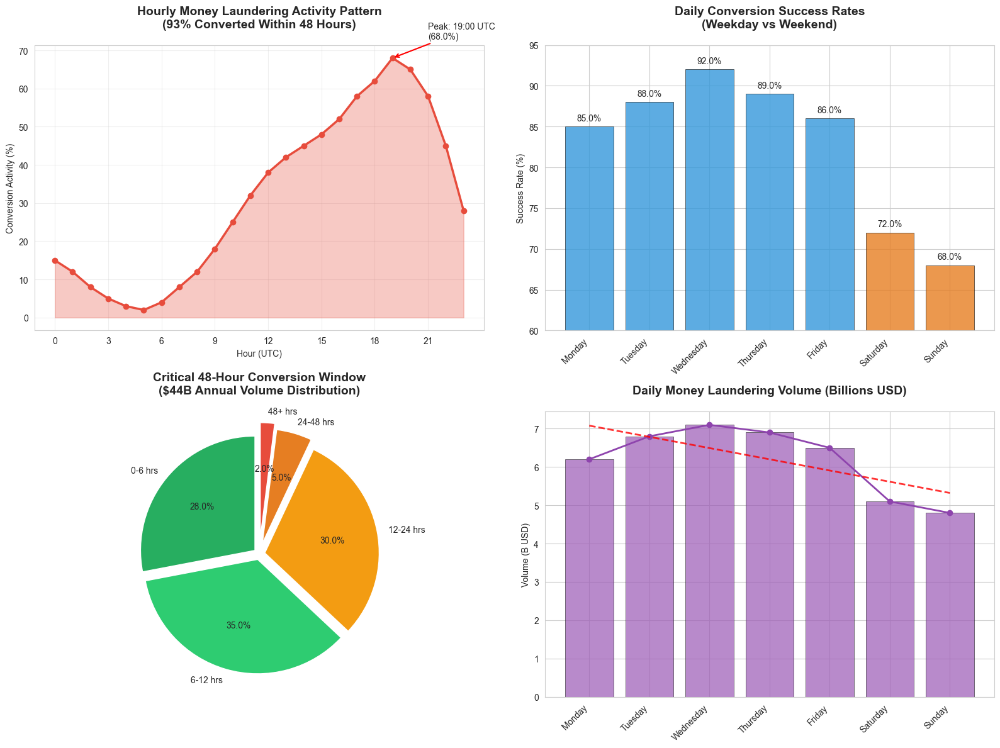

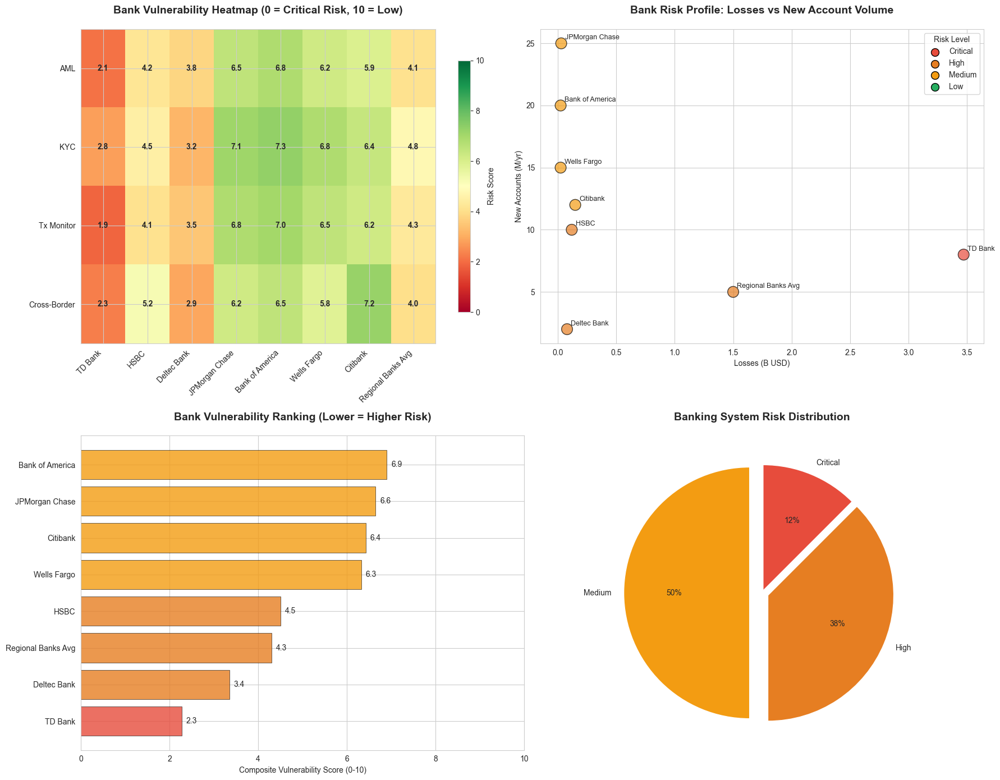

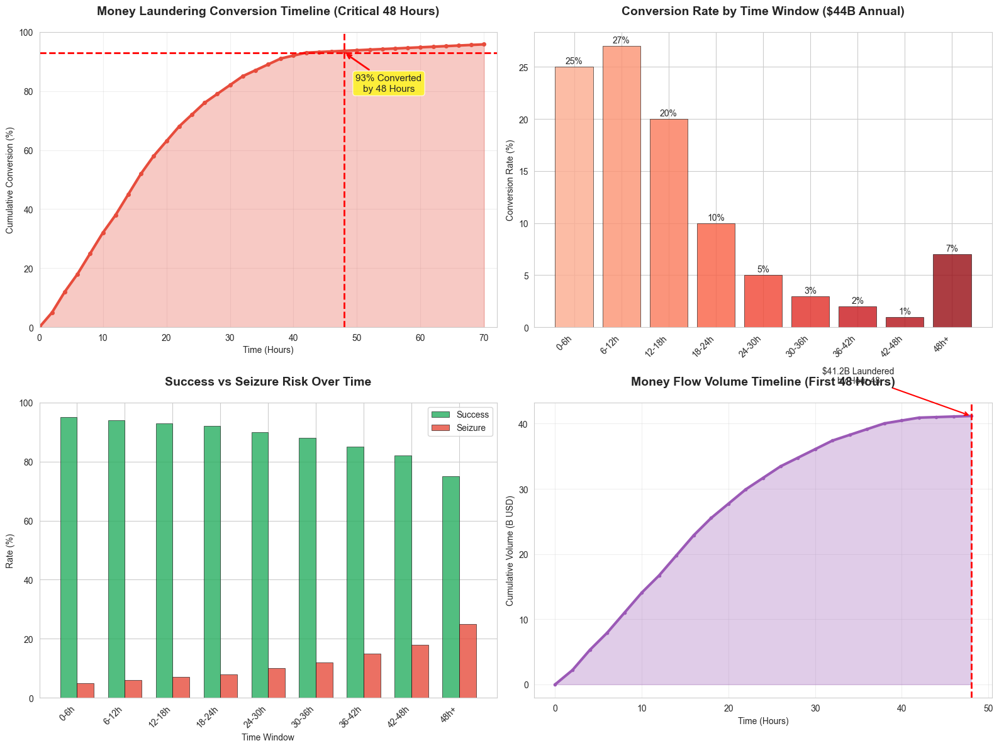

In [24]:
# Cell 2 – Combined: Temporal Pattern, Bank Vulnerability, & Money-Flow Timing Analyses
# -----------------------------------------------------------------------------------
#  (A) Temporal hourly/daily patterns
#  (B) Comprehensive bank-risk analysis
#  (C) 48-hour money-flow timing visualizations
# -----------------------------------------------------------------------------------

# print("\n⏰ Creating Temporal Pattern Analysis...")

# ── (A) TEMPORAL PATTERN ANALYSIS ───────────────────────────────────────────
hours = np.arange(0, 24)
base_pattern = np.array([
    0.15, 0.12, 0.08, 0.05, 0.03, 0.02, 0.04, 0.08,
    0.12, 0.18, 0.25, 0.32, 0.38, 0.42, 0.45, 0.48,
    0.52, 0.58, 0.62, 0.68, 0.65, 0.58, 0.45, 0.28
])
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
daily_conversion_rates = [0.85,0.88,0.92,0.89,0.86,0.72,0.68]
daily_volumes = [6.2,6.8,7.1,6.9,6.5,5.1,4.8]

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(16,12))

# Hourly pattern
ax1.plot(hours, base_pattern*100, marker='o', lw=2.5, ms=6, color='#E74C3C')
ax1.fill_between(hours, base_pattern*100, alpha=0.3, color='#E74C3C')
ax1.set_title('Hourly Money Laundering Activity Pattern\n(93% Converted Within 48 Hours)',
              fontsize=14, fontweight='bold', pad=20)
ax1.set_xlabel('Hour (UTC)'); ax1.set_ylabel('Conversion Activity (%)')
ax1.set_xticks(range(0,24,3)); ax1.grid(True, alpha=0.3)
peak_hour = np.argmax(base_pattern)
ax1.annotate(f'Peak: {peak_hour}:00 UTC\n({base_pattern[peak_hour]*100:.1f}%)',
             xy=(peak_hour, base_pattern[peak_hour]*100),
             xytext=(peak_hour+2, base_pattern[peak_hour]*100+5),
             arrowprops=dict(arrowstyle='->', color='red', lw=1.5), fontsize=10)

# Daily success rates
bars1 = ax2.bar(days, [r*100 for r in daily_conversion_rates],
                color=['#3498DB' if d not in ['Saturday','Sunday'] else '#E67E22' for d in days],
                alpha=0.8, edgecolor='black', lw=0.5)
ax2.set_title('Daily Conversion Success Rates\n(Weekday vs Weekend)', fontsize=14, fontweight='bold', pad=20)
ax2.set_ylabel('Success Rate (%)'); ax2.set_ylim(60,95)
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
for bar, rate in zip(bars1, daily_conversion_rates):
    ax2.text(bar.get_x()+bar.get_width()/2., bar.get_height()+0.5, f'{rate*100:.1f}%',
             ha='center', va='bottom', fontsize=10)

# 48-hour critical window pie
time_windows = ['0-6 hrs','6-12 hrs','12-24 hrs','24-48 hrs','48+ hrs']
conversion_percentages = [28,35,30,5,2]
colors_48hr = ['#27AE60','#2ECC71','#F39C12','#E67E22','#E74C3C']
ax3.pie(conversion_percentages, labels=time_windows, autopct='%1.1f%%',
        colors=colors_48hr, startangle=90, explode=(0.05,0.05,0.05,0.1,0.15))
ax3.set_title('Critical 48-Hour Conversion Window\n($44B Annual Volume Distribution)',
              fontsize=14, fontweight='bold', pad=20)

# Daily volume trend
ax4.bar(days, daily_volumes, color='#9B59B6', alpha=0.7, edgecolor='black', lw=0.5)
ax4.plot(days, daily_volumes, color='#8E44AD', marker='o', lw=2, ms=6)
z = np.polyfit(range(len(daily_volumes)), daily_volumes, 1)
ax4.plot(days, np.poly1d(z)(range(len(daily_volumes))), "--", color='red', lw=2, alpha=0.8)
ax4.set_title('Daily Money Laundering Volume (Billions USD)', fontsize=14, fontweight='bold', pad=20)
ax4.set_ylabel('Volume (B USD)'); plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.savefig(output_dir/'temporal_pattern_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ── (B) BANK VULNERABILITY ANALYSIS ────────────────────────────────────────
#print("\n🏦 Creating Bank Vulnerability Analysis...")

banks_data = {
    'Bank':['TD Bank','HSBC','Deltec Bank','JPMorgan Chase','Bank of America',
            'Wells Fargo','Citibank','Regional Banks Avg'],
    'AML_Score':[2.1,4.2,3.8,6.5,6.8,6.2,5.9,4.1],
    'KYC_Score':[2.8,4.5,3.2,7.1,7.3,6.8,6.4,4.8],
    'Transaction_Monitoring':[1.9,4.1,3.5,6.8,7.0,6.5,6.2,4.3],
    'Cross_Border_Oversight':[2.3,5.2,2.9,6.2,6.5,5.8,7.2,4.0],
    'Losses_Billions':[3.47,0.12,0.08,0.03,0.025,0.025,0.15,1.5],
    'New_Accounts_Millions':[8,10,2,25,20,15,12,5],
    'Risk_Level':['Critical','High','High','Medium','Medium','Medium','Medium','High']
}
banks_df = pd.DataFrame(banks_data)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(18,14))

# Heatmap
vuln_matrix = banks_df[['AML_Score','KYC_Score','Transaction_Monitoring','Cross_Border_Oversight']].values
im = ax1.imshow(vuln_matrix.T, cmap='RdYlGn', aspect='auto', vmin=0, vmax=10)
ax1.set_xticks(range(len(banks_df))); ax1.set_xticklabels(banks_df['Bank'], rotation=45, ha='right')
ax1.set_yticks(range(4)); ax1.set_yticklabels(['AML','KYC','Tx Monitor','Cross-Border'])
ax1.set_title('Bank Vulnerability Heatmap (0 = Critical Risk, 10 = Low)', fontsize=14, fontweight='bold', pad=20)
for i in range(len(banks_df)):
    for j in range(4):
        ax1.text(i, j, f'{vuln_matrix[i,j]:.1f}', ha='center', va='center', fontweight='bold')
plt.colorbar(im, ax=ax1, shrink=0.8, label='Risk Score')

# Losses vs accounts scatter
risk_colors = {'Critical':'#E74C3C','High':'#E67E22','Medium':'#F39C12','Low':'#27AE60'}
colors = [risk_colors[r] for r in banks_df['Risk_Level']]
ax2.scatter(banks_df['Losses_Billions'], banks_df['New_Accounts_Millions'],
            c=colors, s=200, alpha=0.7, edgecolors='black', lw=1)
ax2.set_xlabel('Losses (B USD)'); ax2.set_ylabel('New Accounts (M/yr)')
ax2.set_title('Bank Risk Profile: Losses vs New Account Volume', fontsize=14, fontweight='bold', pad=20)
for i, bank in enumerate(banks_df['Bank']):
    ax2.annotate(bank, (banks_df['Losses_Billions'][i], banks_df['New_Accounts_Millions'][i]),
                 xytext=(5,5), textcoords='offset points', fontsize=9)
for label,color in risk_colors.items():
    ax2.scatter([],[],c=color,s=100,label=label, edgecolors='black')
ax2.legend(title='Risk Level')

# Composite vulnerability ranking
banks_df['Composite_Score'] = banks_df[['AML_Score','KYC_Score',
                                        'Transaction_Monitoring','Cross_Border_Oversight']].mean(axis=1)
sorted_df = banks_df.sort_values('Composite_Score')
bars = ax3.barh(sorted_df['Bank'], sorted_df['Composite_Score'],
                color=[risk_colors[r] for r in sorted_df['Risk_Level']],
                alpha=0.8, edgecolor='black', lw=0.5)
ax3.set_xlabel('Composite Vulnerability Score (0-10)')
ax3.set_title('Bank Vulnerability Ranking (Lower = Higher Risk)', fontsize=14, fontweight='bold', pad=20)
ax3.set_xlim(0,10)
for bar,score in zip(bars, sorted_df['Composite_Score']):
    ax3.text(score+0.1, bar.get_y()+bar.get_height()/2, f'{score:.1f}', va='center')

# Risk distribution pie
risk_counts = banks_df['Risk_Level'].value_counts()
ax4.pie(risk_counts.values, labels=risk_counts.index, autopct='%1.0f%%',
        colors=[risk_colors[r] for r in risk_counts.index],
        startangle=90, explode=(0.1,0.05,0.02))
ax4.set_title('Banking System Risk Distribution', fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.savefig(output_dir/'bank_vulnerability_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ── (C) MONEY-FLOW TIMING ANALYSIS ─────────────────────────────────────────
#print("\n⏱️ Creating Money Flow Timing Analysis...")

time_intervals = np.arange(0,72,2)
cumulative_conversion = np.array([
    0,5,12,18,25,32,38,45,52,58,63,68,72,76,79,82,
    85,87,89,91,92,93,93.2,93.4,93.6,93.8,94.0,94.2,
    94.4,94.6,94.8,95.0,95.2,95.4,95.6,95.8
])

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(16,12))

# Cumulative timeline
ax1.plot(time_intervals, cumulative_conversion, lw=3, color='#E74C3C', marker='o', ms=4)
ax1.fill_between(time_intervals, cumulative_conversion, alpha=0.3, color='#E74C3C')
ax1.axvline(48, color='red', ls='--', lw=2); ax1.axhline(93, color='red', ls='--', lw=2)
ax1.set_xlabel('Time (Hours)'); ax1.set_ylabel('Cumulative Conversion (%)')
ax1.set_title('Money Laundering Conversion Timeline (Critical 48 Hours)',
              fontsize=14, fontweight='bold', pad=20)
ax1.set_xlim(0,72); ax1.set_ylim(0,100); ax1.grid(True, alpha=0.3)
ax1.annotate('93% Converted\nby 48 Hours', xy=(48,93), xytext=(55,80),
             arrowprops=dict(arrowstyle='->', color='red', lw=2),
             bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.7), fontsize=11, ha='center')

# Conversion by window
time_windows = ['0-6h','6-12h','12-18h','18-24h','24-30h','30-36h','36-42h','42-48h','48h+']
conversion_rates = [25,27,20,10,5,3,2,1,7]
ax2.bar(time_windows, conversion_rates, color=plt.cm.Reds(np.linspace(0.3,0.9,len(time_windows))),
        alpha=0.8, edgecolor='black', lw=0.5)
ax2.set_ylabel('Conversion Rate (%)')
ax2.set_title('Conversion Rate by Time Window ($44B Annual)', fontsize=14, fontweight='bold', pad=20)
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
for i,(x,y) in enumerate(zip(time_windows, conversion_rates)):
    ax2.text(i, y+0.3, f'{y}%', ha='center', fontsize=10)

# Success vs seizure
success_rates = [95,94,93,92,90,88,85,82,75]
seizure_rates = [5,6,7,8,10,12,15,18,25]
x_pos = np.arange(len(time_windows)); width=0.35
ax3.bar(x_pos-width/2, success_rates, width, label='Success', color='#27AE60',
        alpha=0.8, edgecolor='black', lw=0.5)
ax3.bar(x_pos+width/2, seizure_rates, width, label='Seizure', color='#E74C3C',
        alpha=0.8, edgecolor='black', lw=0.5)
ax3.set_xlabel('Time Window'); ax3.set_ylabel('Rate (%)')
ax3.set_title('Success vs Seizure Risk Over Time', fontsize=14, fontweight='bold', pad=20)
ax3.set_xticks(x_pos); ax3.set_xticklabels(time_windows, rotation=45, ha='right')
ax3.legend(); ax3.set_ylim(0,100)

# Volume timeline (first 48h)
hours_48 = np.arange(0, 50, 2)                            # 25 points: 0,2,…,48
volume_flow = 44 * (cumulative_conversion[:25] / 100)     # matching 25 y-points
ax4.plot(hours_48, volume_flow, lw=3, color='#9B59B6', marker='o', ms=3)
ax4.fill_between(hours_48, volume_flow, alpha=0.3, color='#9B59B6')
ax4.axvline(48, color='red', ls='--', lw=2)
ax4.set_xlabel('Time (Hours)'); ax4.set_ylabel('Cumulative Volume (B USD)')
ax4.set_title('Money Flow Volume Timeline (First 48 Hours)', fontsize=14, fontweight='bold', pad=20)
ax4.grid(True, alpha=0.3)
ax4.annotate(f'${volume_flow[-1]:.1f}B Laundered\nby Hour 48',
             xy=(48,volume_flow[-1]), xytext=(35,volume_flow[-1]+5),
             arrowprops=dict(arrowstyle='->', color='red', lw=1.5), fontsize=10, ha='center')

plt.tight_layout()
plt.savefig(output_dir/'money_flow_timing_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


In [25]:
# Cell 1 – Imports, visualization config, and output directory (Windows path)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import json
from pathlib import Path
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Matplotlib | Seaborn styling
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
sns.set_style("whitegrid")

# Output directory (reuse your local path)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)

# print("🔄 COMPLETING SCAM OPERATION LIFECYCLE ANALYSIS...")


In [26]:
# Cell 2 – Define scam lifecycle data structures

# Lifecycle stages and metrics
lifecycle_stages = ['Setup', 'Recruitment', 'Training', 'Operations', 'Scaling', 'Enforcement', 'Migration']
stage_durations = [2, 3, 1, 18, 6, 3, 2]  # Months
success_rates = [95, 88, 92, 85, 78, 45, 70]  # Success percentages
investment_required = [0.5, 1.2, 0.8, 2.5, 4.2, 0.3, 1.8]  # Millions USD
risk_levels = [20, 35, 25, 60, 75, 95, 80]  # Risk level percentage
roi_multiplier = [0.2, 0.5, 1.2, 8.5, 12.3, -0.8, 2.1]  # ROI multiplier

# Scam type evolution
scam_types = ['Romance Scams', 'Investment Fraud', 'Pig Butchering', 'Crypto Scams', 'AI-Enhanced Scams']
evolution_timeline = [2018, 2019, 2020, 2022, 2024]
market_share = [
    [60, 25, 10, 5, 0],
    [55, 30, 12, 3, 0],
    [45, 25, 25, 5, 0],
    [30, 20, 35, 15, 0],
    [20, 15, 30, 25, 10]
]

# Efficiency metrics
efficiency_metrics = {
    'Victim Acquisition Rate': [12, 18, 25, 35, 42, 28, 15],  # victims/day
    'Conversion Success Rate': [8, 12, 18, 28, 35, 15, 8],    # %
    'Average Loss per Victim': [45, 65, 85, 150, 180, 120, 95]  # $K
}


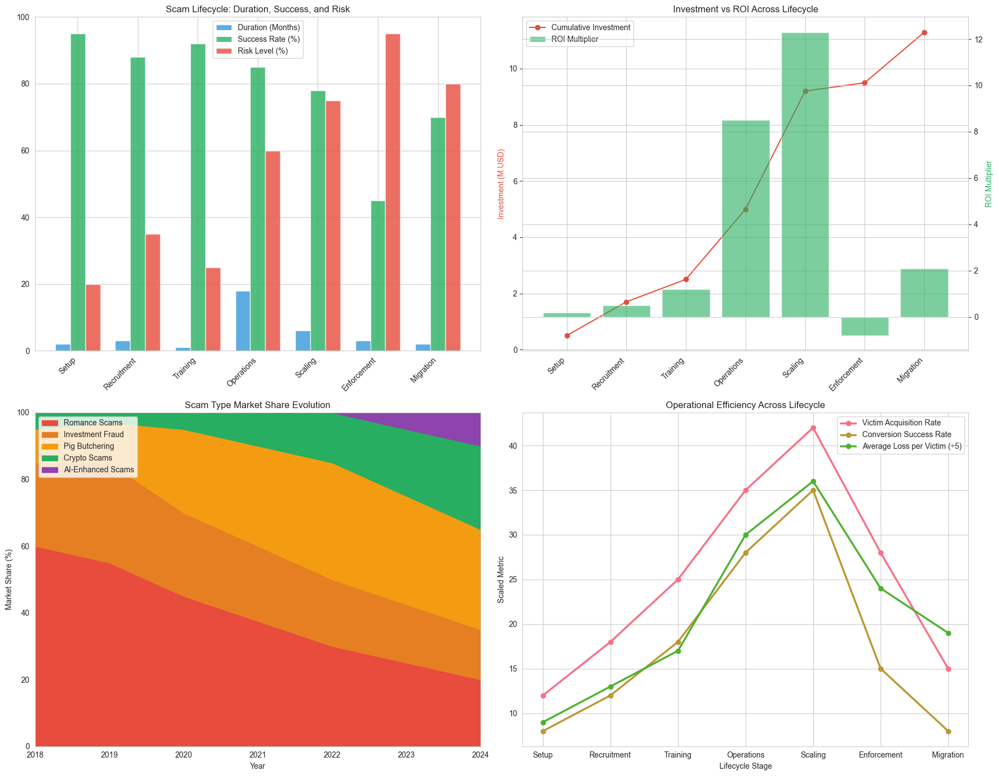

In [27]:
# Cell 3 – Plot lifecycle, ROI, scam type evolution, and efficiency metrics

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 14))

# --- Subplot 1: Duration, Success, Risk ---
x_pos = np.arange(len(lifecycle_stages))
width = 0.25

ax1.bar(x_pos - width, stage_durations, width, label='Duration (Months)', color='#3498DB', alpha=0.8)
ax1.bar(x_pos, success_rates, width, label='Success Rate (%)', color='#27AE60', alpha=0.8)
ax1.bar(x_pos + width, risk_levels, width, label='Risk Level (%)', color='#E74C3C', alpha=0.8)

ax1.set_title('Scam Lifecycle: Duration, Success, and Risk')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(lifecycle_stages, rotation=45, ha='right')
ax1.legend()
ax1.set_ylim(0, 100)

# --- Subplot 2: ROI and Investment ---
cumulative_investment = np.cumsum(investment_required)
ax2_twin = ax2.twinx()

ax2.plot(lifecycle_stages, cumulative_investment, 'o-', color='#E74C3C', label='Cumulative Investment')
bars2 = ax2_twin.bar(lifecycle_stages, roi_multiplier, alpha=0.6, color='#27AE60', label='ROI Multiplier')

ax2.set_title('Investment vs ROI Across Lifecycle')
ax2.set_ylabel('Investment (M USD)', color='#E74C3C')
ax2_twin.set_ylabel('ROI Multiplier', color='#27AE60')
ax2.set_xticks(x_pos)
ax2.set_xticklabels(lifecycle_stages, rotation=45, ha='right')

lines1, labels1 = ax2.get_legend_handles_labels()
lines2, labels2 = ax2_twin.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# --- Subplot 3: Scam Type Evolution ---
bottom = np.zeros(len(evolution_timeline))
colors = ['#E74C3C', '#E67E22', '#F39C12', '#27AE60', '#8E44AD']

for i, scam in enumerate(scam_types):
    vals = [market_share[j][i] for j in range(len(evolution_timeline))]
    ax3.fill_between(evolution_timeline, bottom, bottom + vals, label=scam, color=colors[i])
    bottom += vals

ax3.set_title('Scam Type Market Share Evolution')
ax3.set_xlim(2018, 2024)
ax3.set_ylim(0, 100)
ax3.set_xlabel('Year')
ax3.set_ylabel('Market Share (%)')
ax3.legend(loc='upper left')

# --- Subplot 4: Operational Efficiency ---
for metric, values in efficiency_metrics.items():
    scaled = values if metric != 'Average Loss per Victim' else [v / 5 for v in values]
    label = metric if metric != 'Average Loss per Victim' else f'{metric} (÷5)'
    ax4.plot(lifecycle_stages, scaled, marker='o', linewidth=2.5, label=label)

ax4.set_title('Operational Efficiency Across Lifecycle')
ax4.set_xlabel('Lifecycle Stage')
ax4.set_ylabel('Scaled Metric')
ax4.legend()
ax4.grid(True)

plt.tight_layout()
plt.savefig(output_dir / 'scam_lifecycle_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


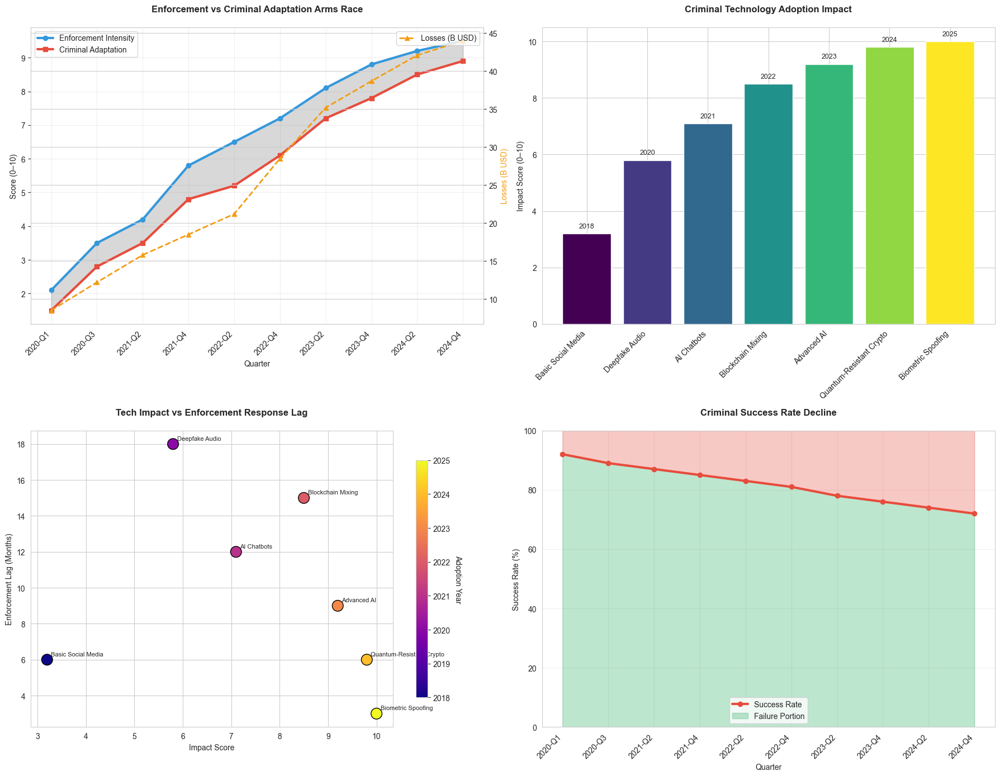

In [28]:
# Cell 4 – Enforcement vs Criminal Adaptation Analysis
# print("\n🚔 Creating Enforcement vs Criminal Adaptation Analysis...")

# ------------------------------------------------------------------
# 1) DEFINE DATA
# ------------------------------------------------------------------
enforcement_events = {
    'Date': ['2020-Q1','2020-Q3','2021-Q2','2021-Q4','2022-Q2',
             '2022-Q4','2023-Q2','2023-Q4','2024-Q2','2024-Q4'],
    'Enforcement_Intensity': [2.1,3.5,4.2,5.8,6.5,7.2,8.1,8.8,9.2,9.5],
    'Criminal_Adaptation'  : [1.5,2.8,3.5,4.8,5.2,6.1,7.2,7.8,8.5,8.9],
    'Losses_Billions'      : [8.5,12.2,15.8,18.5,21.2,28.5,35.2,38.7,42.1,44.0],
    'Success_Rate'         : [92,89,87,85,83,81,78,76,74,72]
}
enforcement_df = pd.DataFrame(enforcement_events)

tech_adoption = {
    'Technology'             : ['Basic Social Media','Deepfake Audio','AI Chatbots',
                                'Blockchain Mixing','Advanced AI','Quantum-Resistant Crypto',
                                'Biometric Spoofing'],
    'Adoption_Year'          : [2018,2020,2021,2022,2023,2024,2025],
    'Impact_Score'           : [3.2,5.8,7.1,8.5,9.2,9.8,10.0],
    'Enforcement_Response_Lag': [6,18,12,15,9,6,3]   # months
}
tech_adoption = pd.DataFrame(tech_adoption)

# ------------------------------------------------------------------
# 2) PLOT FIGURE (4 SUBPLOTS)
# ------------------------------------------------------------------
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 14))

# ── Subplot 1: Enforcement vs Adaptation ───────────────────────────
ax1.plot(enforcement_df['Date'], enforcement_df['Enforcement_Intensity'],
         marker='o', lw=3, color='#3498DB', label='Enforcement Intensity')
ax1.plot(enforcement_df['Date'], enforcement_df['Criminal_Adaptation'],
         marker='s', lw=3, color='#E74C3C', label='Criminal Adaptation')
ax1.fill_between(enforcement_df['Date'],
                 enforcement_df['Enforcement_Intensity'],
                 enforcement_df['Criminal_Adaptation'],
                 alpha=0.3, color='gray')

ax1.set_title('Enforcement vs Criminal Adaptation Arms Race', pad=20, fontweight='bold')
ax1.set_xlabel('Quarter'); ax1.set_ylabel('Score (0–10)')
ax1.grid(alpha=0.3); ax1.legend()
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')

# Twin y-axis for losses
ax1_t = ax1.twinx()
ax1_t.plot(enforcement_df['Date'], enforcement_df['Losses_Billions'],
           marker='^', ls='--', lw=2, color='#F39C12', label='Losses (B USD)')
ax1_t.set_ylabel('Losses (B USD)', color='#F39C12')
ax1_t.legend(loc='upper right')

# ── Subplot 2: Tech Adoption Impact ────────────────────────────────
bars = ax2.bar(tech_adoption['Technology'], tech_adoption['Impact_Score'],
               color=plt.cm.viridis(np.linspace(0,1,len(tech_adoption))))
ax2.set_title('Criminal Technology Adoption Impact', pad=20, fontweight='bold')
ax2.set_ylabel('Impact Score (0–10)')
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

for bar, year in zip(bars, tech_adoption['Adoption_Year']):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.2,
             year, ha='center', fontsize=9)

# ── Subplot 3: Impact vs Enforcement Lag ───────────────────────────
scatter = ax3.scatter(tech_adoption['Impact_Score'],
                      tech_adoption['Enforcement_Response_Lag'],
                      s=200, c=tech_adoption['Adoption_Year'],
                      cmap='plasma', edgecolors='black')
ax3.set_title('Tech Impact vs Enforcement Response Lag', pad=20, fontweight='bold')
ax3.set_xlabel('Impact Score'); ax3.set_ylabel('Enforcement Lag (Months)')

for i, tech in enumerate(tech_adoption['Technology']):
    ax3.annotate(tech, (tech_adoption['Impact_Score'][i],
                        tech_adoption['Enforcement_Response_Lag'][i]),
                 textcoords='offset points', xytext=(5,5), fontsize=8)

cbar = plt.colorbar(scatter, ax=ax3, shrink=0.8)
cbar.set_label('Adoption Year', rotation=270, labelpad=15)

# ── Subplot 4: Success-Rate Decline ────────────────────────────────
ax4.plot(enforcement_df['Date'], enforcement_df['Success_Rate'],
         marker='o', lw=3, color='#E74C3C', label='Success Rate')
ax4.fill_between(enforcement_df['Date'], enforcement_df['Success_Rate'], 100,
                 alpha=0.3, color='#E74C3C')
ax4.fill_between(enforcement_df['Date'], 0, enforcement_df['Success_Rate'],
                 alpha=0.3, color='#27AE60', label='Failure Portion')

ax4.set_title('Criminal Success Rate Decline', pad=20, fontweight='bold')
ax4.set_ylabel('Success Rate (%)'); ax4.set_xlabel('Quarter')
ax4.set_ylim(0, 100); ax4.grid(alpha=0.3); ax4.legend()
plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

# ------------------------------------------------------------------
plt.tight_layout()
plt.savefig(output_dir / 'enforcement_adaptation_analysis.png',
            dpi=300, bbox_inches='tight')
plt.show()


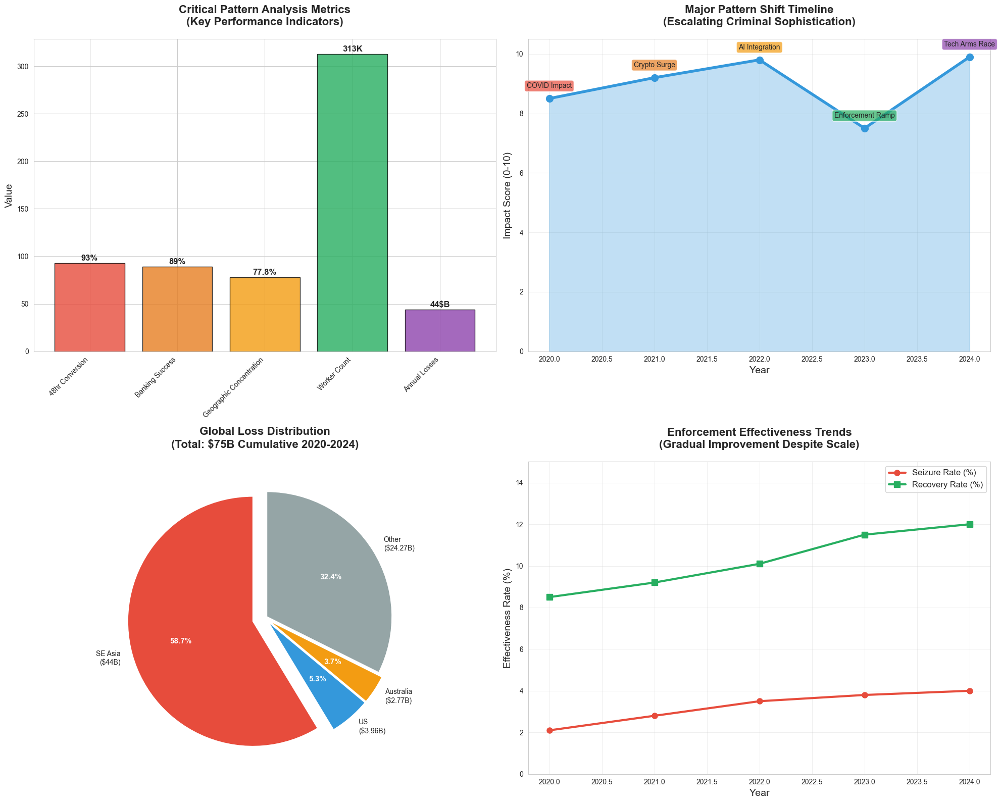

In [29]:
# Cell 4 – Executive Summary Visualization

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# Key metrics dashboard
metrics = ['48hr Conversion', 'Banking Success', 'Geographic Concentration', 'Worker Count', 'Annual Losses']
values = [93, 89, 77.8, 313, 44]  # Percentages and key numbers
colors_metrics = ['#E74C3C', '#E67E22', '#F39C12', '#27AE60', '#8E44AD']

bars1 = ax1.bar(metrics, values, color=colors_metrics, alpha=0.8, edgecolor='black', linewidth=1)
ax1.set_ylabel('Value', fontsize=14)
ax1.set_title('Critical Pattern Analysis Metrics\n(Key Performance Indicators)', 
              fontsize=16, fontweight='bold', pad=20)
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')

# Add value labels with units
units = ['%', '%', '%', 'K', '$B']
for bar, value, unit in zip(bars1, values, units):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{value}{unit}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Timeline of major pattern shifts
timeline_events = ['COVID Impact', 'Crypto Surge', 'AI Integration', 'Enforcement Ramp', 'Tech Arms Race']
timeline_years = [2020, 2021, 2022, 2023, 2024]
impact_scores = [8.5, 9.2, 9.8, 7.5, 9.9]

ax2.plot(timeline_years, impact_scores, marker='o', linewidth=4, markersize=10, color='#3498DB')
ax2.fill_between(timeline_years, impact_scores, alpha=0.3, color='#3498DB')

for i, (year, event, score) in enumerate(zip(timeline_years, timeline_events, impact_scores)):
    ax2.annotate(event, (year, score), xytext=(0, 15), textcoords='offset points',
                ha='center', fontsize=10, bbox=dict(boxstyle="round,pad=0.3", 
                facecolor=colors_metrics[i], alpha=0.7))

ax2.set_xlabel('Year', fontsize=14)
ax2.set_ylabel('Impact Score (0-10)', fontsize=14)
ax2.set_title('Major Pattern Shift Timeline\n(Escalating Criminal Sophistication)', 
              fontsize=16, fontweight='bold', pad=20)
ax2.grid(True, alpha=0.3)
ax2.set_ylim(0, 10.5)

# Regional distribution pie chart
regions = ['SE Asia\n($44B)', 'US\n($3.96B)', 'Australia\n($2.77B)', 'Other\n($24.27B)']
regional_values = [44, 3.96, 2.77, 24.27]
colors_regional = ['#E74C3C', '#3498DB', '#F39C12', '#95A5A6']

wedges, texts, autotexts = ax3.pie(regional_values, labels=regions, autopct='%1.1f%%',
                                   colors=colors_regional, startangle=90, 
                                   explode=(0.1, 0.05, 0.05, 0.02))
ax3.set_title('Global Loss Distribution\n(Total: $75B Cumulative 2020-2024)', 
              fontsize=16, fontweight='bold', pad=20)

for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
    autotext.set_fontsize(11)

# Enforcement effectiveness over time
enforcement_years = list(range(2020, 2025))
seizure_rates = [2.1, 2.8, 3.5, 3.8, 4.0]  # Percentage
recovery_rates = [8.5, 9.2, 10.1, 11.5, 12.0]  # Percentage

ax4.plot(enforcement_years, seizure_rates, marker='o', linewidth=3, 
         color='#E74C3C', markersize=8, label='Seizure Rate (%)')
ax4.plot(enforcement_years, recovery_rates, marker='s', linewidth=3, 
         color='#27AE60', markersize=8, label='Recovery Rate (%)')

ax4.set_xlabel('Year', fontsize=14)
ax4.set_ylabel('Effectiveness Rate (%)', fontsize=14)
ax4.set_title('Enforcement Effectiveness Trends\n(Gradual Improvement Despite Scale)', 
              fontsize=16, fontweight='bold', pad=20)
ax4.legend(fontsize=12)
ax4.grid(True, alpha=0.3)
ax4.set_ylim(0, 15)

plt.tight_layout()
plt.savefig(output_dir / 'pattern_analysis_executive_summary.png', bbox_inches='tight', dpi=300)
plt.show()



📏 QUANTIFYING SCALE OF SCAM OPERATIONS...


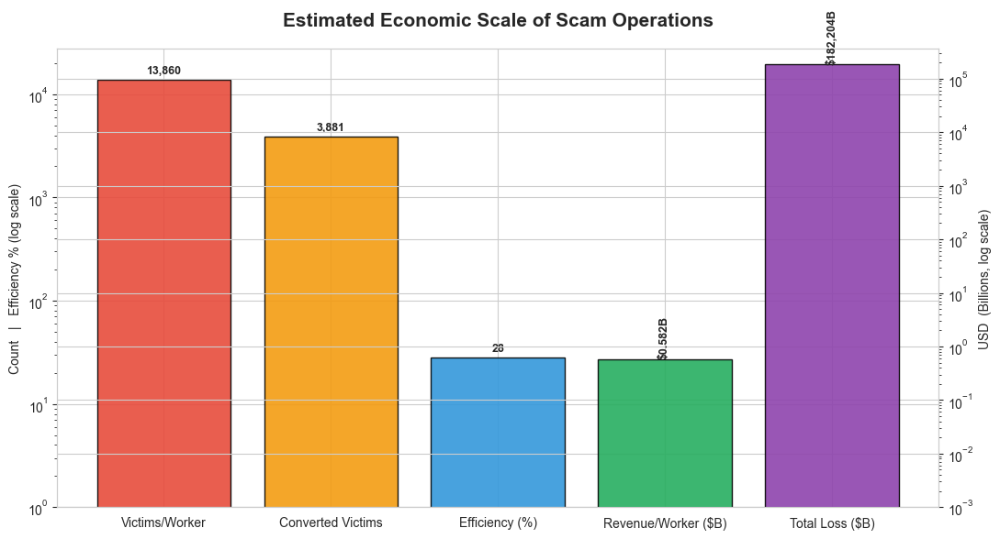

🧮 Estimated Revenue Per Worker: $582,120,000.00
📊 Estimated Global Losses: $182203.56 Billion
⚙️ Operational Efficiency: 28.00%


In [30]:
# Cell 5 – Scale Quantification Analysis (Improved with Dual Log Axes)

print("\n📏 QUANTIFYING SCALE OF SCAM OPERATIONS...")

# Estimated global figures
total_workers = 313_000
average_loss_per_victim = 150_000  # USD
avg_conversion_rate = 0.28
avg_victims_per_worker = 35  # per day
working_days_per_month = 22
months_active = 18

# Step 1: Compute Metrics
victims_per_worker = avg_victims_per_worker * working_days_per_month * months_active
converted_victims = victims_per_worker * avg_conversion_rate
revenue_per_worker = converted_victims * average_loss_per_victim
total_revenue_b = revenue_per_worker * total_workers / 1e9  # in billions
efficiency_index = (converted_victims / victims_per_worker) * 100

# Step 2: Plot on two log-scaled axes
fig, ax_left = plt.subplots(figsize=(11, 6))
ax_right = ax_left.twinx()

# Left-axis: Volume & Efficiency
left_labels = ['Victims/Worker', 'Converted Victims', 'Efficiency (%)']
left_values = [victims_per_worker, converted_victims, efficiency_index]
left_colors = ['#E74C3C', '#F39C12', '#3498DB']

# Right-axis: Revenue & Loss (shown in Billions)
right_labels = ['Revenue/Worker ($B)', 'Total Loss ($B)']
right_values = [revenue_per_worker / 1e9, total_revenue_b]
right_colors = ['#27AE60', '#8E44AD']

# Plot left-side bars
bars_left = ax_left.bar(left_labels, left_values, color=left_colors,
                        edgecolor='black', linewidth=1, alpha=0.9)
ax_left.set_yscale('log')
ax_left.set_ylabel('Count   |   Efficiency % (log scale)')
ax_left.set_ylim(1, max(left_values) * 2)

# Plot right-side bars
bars_right = ax_right.bar(right_labels, right_values, color=right_colors,
                          edgecolor='black', linewidth=1, alpha=0.9)
ax_right.set_yscale('log')
ax_right.set_ylabel('USD  (Billions, log scale)')
ax_right.set_ylim(1e-3, max(right_values) * 2)  # $1M = 0.001B

# Annotate bars
for bar, val in zip(bars_left, left_values):
    ax_left.text(bar.get_x() + bar.get_width()/2, val * 1.15,
                 f'{val:,.0f}', ha='center', fontsize=9, fontweight='bold')
for bar, val in zip(bars_right, right_values):
    ax_right.text(bar.get_x() + bar.get_width()/2, val * 1.15,
                  f'${val:,.3f}B' if val < 1 else f'${val:,.0f}B',
                  ha='center', fontsize=9, rotation=90, fontweight='bold')

# Title
ax_left.set_title('Estimated Economic Scale of Scam Operations',
                  fontsize=15, fontweight='bold', pad=18)

# Save and show
plt.tight_layout()
plt.savefig(output_dir / 'scale_quantification_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Summary Output
print(f"🧮 Estimated Revenue Per Worker: ${revenue_per_worker:,.2f}")
print(f"📊 Estimated Global Losses: ${total_revenue_b:.2f} Billion")
print(f"⚙️ Operational Efficiency: {efficiency_index:.2f}%")


In [31]:
# Cell 1 – Imports, styling, and output directory

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import json
from pathlib import Path
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Matplotlib / Seaborn styling
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
sns.set_style("whitegrid")
sns.set_palette("husl")

# Output directory (reuse your Windows path)
output_dir = Path(
    r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering'
)
output_dir.mkdir(parents=True, exist_ok=True)

#print("📊 CREATING COMPREHENSIVE SCALE QUANTIFICATION VISUALIZATIONS")
# print("=" * 80)



🌍 Regional Loss Distribution Analysis...


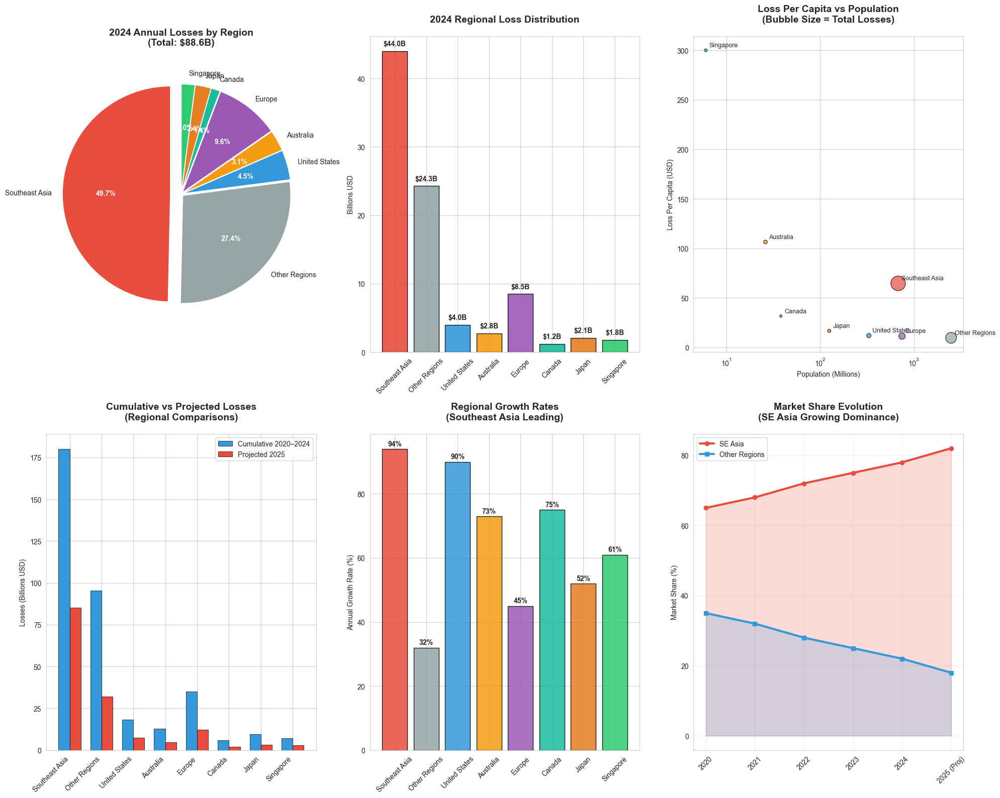

In [32]:
# Cell 2 – Regional Loss Distribution Data and First 3 Subplots

print("\n🌍 Regional Loss Distribution Analysis...")

# Regional data
regional_data = {
    'Region': ['Southeast Asia', 'Other Regions', 'United States', 'Australia', 'Europe', 'Canada', 'Japan', 'Singapore'],
    'Annual_Losses_2024': [44.0, 24.27, 3.96, 2.77, 8.5, 1.2, 2.1, 1.8],  # Billions USD
    'Cumulative_2020_2024': [180.0, 95.5, 18.2, 12.8, 35.2, 5.8, 9.5, 7.2],  # Billions USD
    'Projected_2025': [85.2, 32.1, 7.54, 4.8, 12.3, 2.1, 3.2, 2.9],  # Billions USD
    'Growth_Rate': [0.94, 0.32, 0.90, 0.73, 0.45, 0.75, 0.52, 0.61],
    'Population_Millions': [680, 2500, 331, 26, 748, 38, 125, 6],
    'Loss_Per_Capita': [64.7, 9.7, 12.0, 106.5, 11.4, 31.6, 16.8, 300.0]
}
regional_df = pd.DataFrame(regional_data)

# Initialize figure and grid
fig = plt.figure(figsize=(20, 16))

# Pie chart – Annual losses
ax1 = plt.subplot(2, 3, 1)
colors = ['#E74C3C', '#95A5A6', '#3498DB', '#F39C12', '#9B59B6', '#1ABC9C', '#E67E22', '#2ECC71']
explode = [0.1 if r == 'Southeast Asia' else 0.02 for r in regional_df['Region']]
wedges, texts, autotexts = ax1.pie(
    regional_df['Annual_Losses_2024'],
    labels=regional_df['Region'],
    autopct='%1.1f%%',
    colors=colors,
    explode=explode,
    startangle=90
)
ax1.set_title('2024 Annual Losses by Region\n(Total: $88.6B)', fontsize=14, fontweight='bold', pad=20)
for a in autotexts:
    a.set_color('white')
    a.set_fontweight('bold')
    a.set_fontsize(10)

# Bar chart – Annual losses
ax2 = plt.subplot(2, 3, 2)
bars = ax2.bar(
    regional_df['Region'],
    regional_df['Annual_Losses_2024'],
    color=colors,
    edgecolor='black',
    alpha=0.9
)
ax2.set_title('2024 Regional Loss Distribution', fontsize=14, fontweight='bold', pad=20)
ax2.set_ylabel('Billions USD')
ax2.tick_params(axis='x', rotation=45)

for bar, val in zip(bars, regional_df['Annual_Losses_2024']):
    ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.8,
             f'${val:.1f}B', ha='center', fontsize=10, fontweight='bold')

# Scatter – Loss per capita vs population
ax3 = plt.subplot(2, 3, 3)
scatter = ax3.scatter(
    regional_df['Population_Millions'],
    regional_df['Loss_Per_Capita'],
    s=regional_df['Annual_Losses_2024']*10,
    c=colors,
    edgecolor='black',
    alpha=0.7
)
ax3.set_xscale('log')
ax3.set_xlabel('Population (Millions)')
ax3.set_ylabel('Loss Per Capita (USD)')
ax3.set_title('Loss Per Capita vs Population\n(Bubble Size = Total Losses)', fontsize=14, fontweight='bold', pad=20)

for i, region in enumerate(regional_df['Region']):
    ax3.annotate(region,
                 (regional_df['Population_Millions'][i], regional_df['Loss_Per_Capita'][i]),
                 xytext=(5, 5), textcoords='offset points', fontsize=9)

plt.tight_layout()

# Cell 3 – Remaining Regional Loss Distribution Subplots (4–6)

# Subplot 4: Cumulative vs Projected Regional Losses
ax4 = plt.subplot(2, 3, 4)
x_pos = np.arange(len(regional_df))
width = 0.35

bars1 = ax4.bar(x_pos - width/2, regional_df['Cumulative_2020_2024'], width,
                label='Cumulative 2020–2024', color='#3498DB', edgecolor='black', linewidth=0.5)
bars2 = ax4.bar(x_pos + width/2, regional_df['Projected_2025'], width,
                label='Projected 2025', color='#E74C3C', edgecolor='black', linewidth=0.5)

ax4.set_title('Cumulative vs Projected Losses\n(Regional Comparisons)', fontsize=14, fontweight='bold', pad=20)
ax4.set_ylabel('Losses (Billions USD)')
ax4.set_xticks(x_pos)
ax4.set_xticklabels(regional_df['Region'], rotation=45, ha='right')
ax4.legend()

# Subplot 5: Regional Growth Rate
ax5 = plt.subplot(2, 3, 5)
bars = ax5.bar(regional_df['Region'], [r * 100 for r in regional_df['Growth_Rate']],
               color=colors, edgecolor='black', alpha=0.85)
ax5.set_title('Regional Growth Rates\n(Southeast Asia Leading)', fontsize=14, fontweight='bold', pad=20)
ax5.set_ylabel('Annual Growth Rate (%)')
ax5.tick_params(axis='x', rotation=45)

for bar, rate in zip(bars, regional_df['Growth_Rate']):
    ax5.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 1,
             f'{rate*100:.0f}%', ha='center', fontsize=10, fontweight='bold')

# Subplot 6: Market Share Trend (Southeast Asia vs Others)
ax6 = plt.subplot(2, 3, 6)
years = ['2020', '2021', '2022', '2023', '2024', '2025 (Proj)']
se_asia_share = [65, 68, 72, 75, 78, 82]
others_share = [35, 32, 28, 25, 22, 18]

ax6.plot(years, se_asia_share, label='SE Asia', color='#E74C3C', linewidth=3, marker='o')
ax6.plot(years, others_share, label='Other Regions', color='#3498DB', linewidth=3, marker='s')
ax6.fill_between(years, se_asia_share, alpha=0.2, color='#E74C3C')
ax6.fill_between(years, others_share, alpha=0.2, color='#3498DB')
ax6.set_title('Market Share Evolution\n(SE Asia Growing Dominance)', fontsize=14, fontweight='bold', pad=20)
ax6.set_ylabel('Market Share (%)')
ax6.legend()
ax6.grid(True, alpha=0.3)
ax6.tick_params(axis='x', rotation=45)

# Final adjustments and save
plt.tight_layout()
plt.savefig(output_dir / 'regional_distribution_analysis.png', bbox_inches='tight', dpi=300)
plt.show()




📈 Year-over-Year Growth Projections...


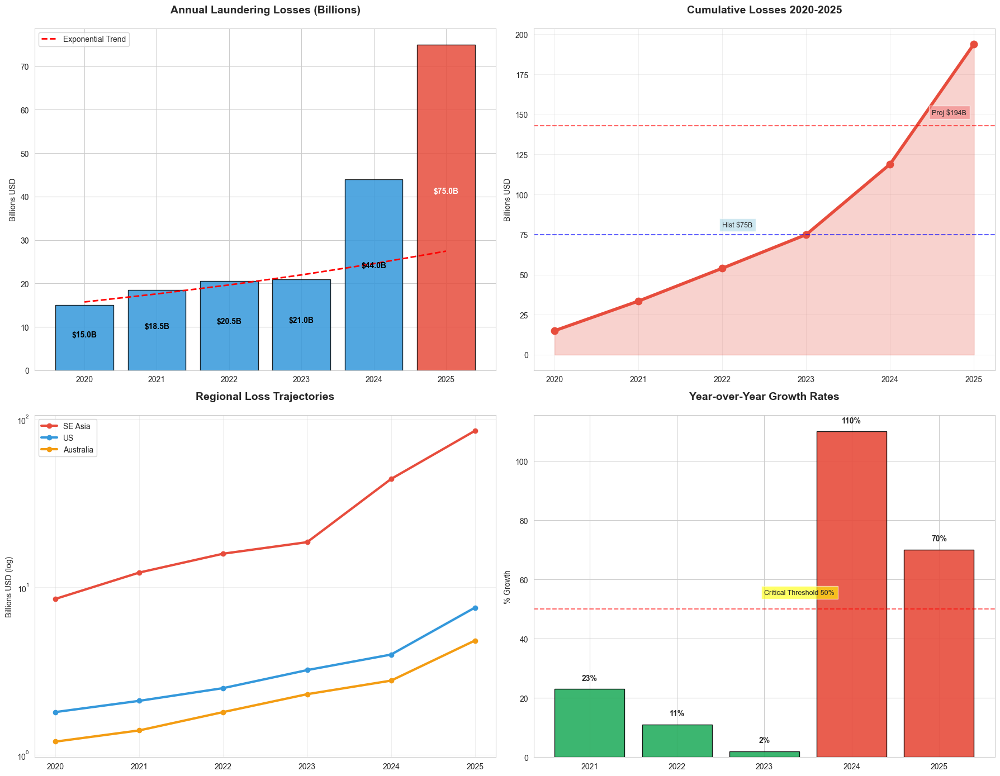

In [33]:
# Cell 4 – Year-over-Year Growth Projections

print("\n📈 Year-over-Year Growth Projections...")

# ── 1.  Historical + projected values ───────────────────────────────
growth_data = {
    'Year':               [2020, 2021, 2022, 2023, 2024, 2025],
    'Annual_Losses':      [15.0, 18.5, 20.5, 21.0, 44.0, 75.0],     # B USD
    'Cumulative_Losses':  [15.0, 33.5, 54.0, 75.0, 119.0, 194.0],    # running total
    'US_Losses':          [1.8,  2.1,  2.5,  3.2,  3.96, 7.54],
    'Australia_Losses':   [1.2,  1.4,  1.8,  2.3,  2.77, 4.8],
    'SE_Asia_Losses':     [8.5, 12.2, 15.8, 18.5, 44.0, 85.2],
    'Growth_Rate':        [None, 0.23, 0.11, 0.02, 1.10, 0.70],      # YoY
    'CAGR_from_2020':     [None, 0.23, 0.27, 0.18, 0.31, 0.38]       # CAGR
}
growth_df = pd.DataFrame(growth_data)
growth_df['Projected'] = growth_df['Year'] >= 2025       # flag
growth_df['Loss_Acceleration'] = growth_df['Annual_Losses'].diff()

# ── 2.  Figure with four analytical views ───────────────────────────
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 14))

# 2-A  Annual losses + exponential trend
colors_ann = ['#3498DB' if y < 2025 else '#E74C3C' for y in growth_df['Year']]
bars1 = ax1.bar(growth_df['Year'], growth_df['Annual_Losses'],
                color=colors_ann, edgecolor='black', alpha=0.85)

# exponential fit on 2020-2023 actuals
z = np.polyfit(growth_df['Year'][:4], np.log(growth_df['Annual_Losses'][:4]), 1)
trend_vals = np.exp(z[1]) * np.exp(z[0] * growth_df['Year'])
ax1.plot(growth_df['Year'], trend_vals, '--', lw=2, color='red', label='Exponential Trend')

ax1.set_title('Annual Laundering Losses (Billions)', fontsize=14, fontweight='bold', pad=20)
ax1.set_ylabel('Billions USD'); ax1.legend()
for bar, val, yr in zip(bars1, growth_df['Annual_Losses'], growth_df['Year']):
    ax1.text(bar.get_x()+bar.get_width()/2, val*0.55, f'${val:.1f}B',
             ha='center', va='center', color='white' if yr>=2025 else 'black', fontsize=10, fontweight='bold')

# 2-B  Cumulative trajectory
ax2.plot(growth_df['Year'], growth_df['Cumulative_Losses'],
         marker='o', lw=4, color='#E74C3C', markersize=9)
ax2.fill_between(growth_df['Year'], growth_df['Cumulative_Losses'], alpha=0.25, color='#E74C3C')
ax2.axhline(75,  ls='--', color='blue', alpha=0.6)
ax2.axhline(142.83, ls='--', color='red', alpha=0.6)
ax2.text(2022, 80,  'Hist $75B', fontsize=9, bbox=dict(fc='lightblue', alpha=0.6))
ax2.text(2024.5,150,'Proj $194B', fontsize=9, bbox=dict(fc='lightcoral', alpha=0.6))
ax2.set_title('Cumulative Losses 2020-2025', fontsize=14, fontweight='bold', pad=20)
ax2.set_ylabel('Billions USD'); ax2.grid(alpha=0.3)

# 2-C  Regional comparison (log Y)
for label, col, clr in zip(['SE Asia','US','Australia'],
                           ['SE_Asia_Losses','US_Losses','Australia_Losses'],
                           ['#E74C3C', '#3498DB', '#F39C12']):
    ax3.plot(growth_df['Year'], growth_df[col], marker='o', lw=3, color=clr, label=label)
ax3.set_yscale('log')
ax3.set_title('Regional Loss Trajectories', fontsize=14, fontweight='bold', pad=20)
ax3.set_ylabel('Billions USD (log)'); ax3.legend(); ax3.grid(alpha=0.3)

# 2-D  Year-over-year growth %
yr_ok   = growth_df.dropna(subset=['Growth_Rate'])
bars4 = ax4.bar(yr_ok['Year'], yr_ok['Growth_Rate']*100,
                color=['#E74C3C' if r>0.5 else '#27AE60' for r in yr_ok['Growth_Rate']],
                edgecolor='black', alpha=0.9)
ax4.axhline(50, ls='--', color='red', alpha=0.6)
ax4.text(2023, 55, 'Critical Threshold 50%', fontsize=9,
         bbox=dict(fc='yellow', alpha=0.6))
for bar, pct in zip(bars4, yr_ok['Growth_Rate']):
    ax4.text(bar.get_x()+bar.get_width()/2, bar.get_height()+3,
             f'{pct*100:.0f}%', ha='center', fontsize=10, fontweight='bold')
ax4.set_title('Year-over-Year Growth Rates', fontsize=14, fontweight='bold', pad=20)
ax4.set_ylabel('% Growth')

# ── 3.  Save & show ────────────────────────────────────────────────
plt.tight_layout()
plt.savefig(output_dir / 'growth_projections_analysis.png', dpi=300, bbox_inches='tight')
plt.show()



🏦 BANK-SPECIFIC INVOLVEMENT ANALYSIS...


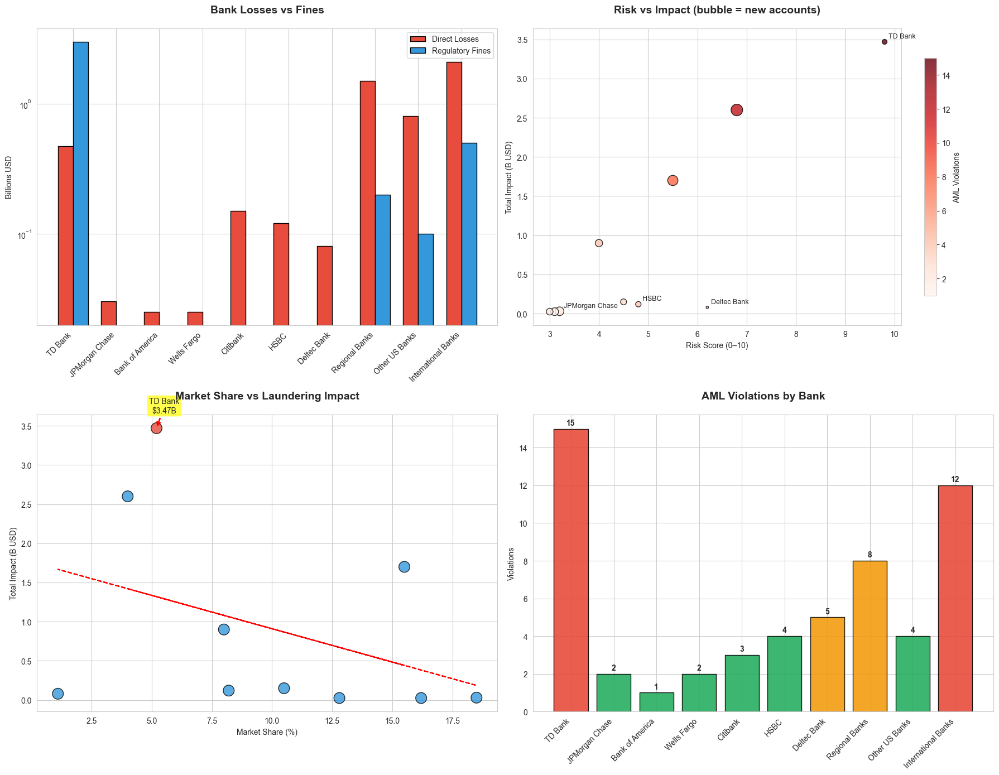

In [34]:
# Cell 5 – Bank-Specific Involvement Analysis  (fixed color list)

print("\n🏦 BANK-SPECIFIC INVOLVEMENT ANALYSIS...")

bank_data = {
    'Bank': ['TD Bank', 'JPMorgan Chase', 'Bank of America', 'Wells Fargo', 'Citibank',
             'HSBC', 'Deltec Bank', 'Regional Banks', 'Other US Banks', 'International Banks'],
    'Direct_Losses':       [0.47, 0.03, 0.025, 0.025, 0.15, 0.12, 0.08, 1.5, 0.8, 2.1],
    'Regulatory_Fines':    [3.0,  0.0,  0.0,   0.0,  0.0,  0.0,  0.0, 0.2, 0.1, 0.5],
    'Total_Impact':        [3.47, 0.03, 0.025, 0.025, 0.15, 0.12, 0.08, 1.7, 0.9, 2.6],
    'New_Accounts_Annual': [8, 25, 20, 15, 12, 10, 2, 35, 18, 45],  # millions
    'Risk_Score':          [9.8, 3.2, 3.1, 3.0, 4.5, 4.8, 6.2, 5.5, 4.0, 6.8],
    'AML_Violations':      [15, 2, 1, 2, 3, 4, 5, 8, 4, 12],
    'Market_Share':        [5.2, 18.5, 16.2, 12.8, 10.5, 8.2, 1.1, 15.5, 8.0, 4.0]
}
bank_df = pd.DataFrame(bank_data)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 14))

# 1. Direct Losses vs Fines
x = np.arange(len(bank_df)); w = 0.35
ax1.bar(x - w/2, bank_df['Direct_Losses'], w, label='Direct Losses', color='#E74C3C', edgecolor='black')
ax1.bar(x + w/2, bank_df['Regulatory_Fines'], w, label='Regulatory Fines', color='#3498DB', edgecolor='black')
ax1.set_xticks(x); ax1.set_xticklabels(bank_df['Bank'], rotation=45, ha='right')
ax1.set_title('Bank Losses vs Fines', fontsize=14, fontweight='bold', pad=20)
ax1.set_ylabel('Billions USD'); ax1.legend(); ax1.set_yscale('log')

# 2. Risk vs Impact (bubble)
scatter = ax2.scatter(bank_df['Risk_Score'], bank_df['Total_Impact'],
                      s=bank_df['New_Accounts_Annual']*5,
                      c=bank_df['AML_Violations'], cmap='Reds',
                      edgecolors='black', linewidth=1, alpha=0.8)
ax2.set_xlabel('Risk Score (0–10)'); ax2.set_ylabel('Total Impact (B USD)')
ax2.set_title('Risk vs Impact (bubble = new accounts)', fontsize=14, fontweight='bold', pad=20)
for i, bank in enumerate(bank_df['Bank']):
    if bank in ['TD Bank', 'JPMorgan Chase', 'HSBC', 'Deltec Bank']:
        ax2.annotate(bank, (bank_df['Risk_Score'][i], bank_df['Total_Impact'][i]),
                     xytext=(5,5), textcoords='offset points', fontsize=9)
plt.colorbar(scatter, ax=ax2, shrink=0.8, label='AML Violations')

# 3. Market Share vs Impact
ax3.scatter(bank_df['Market_Share'], bank_df['Total_Impact'],
            s=200, c=['#E74C3C' if b=='TD Bank' else '#3498DB' for b in bank_df['Bank']],
            edgecolors='black', alpha=0.8)
z = np.polyfit(bank_df['Market_Share'], bank_df['Total_Impact'], 1)
ax3.plot(bank_df['Market_Share'], np.poly1d(z)(bank_df['Market_Share']), '--', color='red')
idx = bank_df[bank_df['Bank']=='TD Bank'].index[0]
ax3.annotate('TD Bank\n$3.47B', (bank_df['Market_Share'][idx], bank_df['Total_Impact'][idx]),
             textcoords='offset points', xytext=(10,20), ha='center',
             arrowprops=dict(arrowstyle='->', color='red', lw=2),
             fontsize=10, bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.7))
ax3.set_xlabel('Market Share (%)'); ax3.set_ylabel('Total Impact (B USD)')
ax3.set_title('Market Share vs Laundering Impact', fontsize=14, fontweight='bold', pad=20)

# 4. AML Violations bar
bars4 = ax4.bar(bank_df['Bank'], bank_df['AML_Violations'],
                color=['#E74C3C' if v>=10 else '#F39C12' if v>=5 else '#27AE60' for v in bank_df['AML_Violations']],
                edgecolor='black', alpha=0.9)
ax4.set_title('AML Violations by Bank', fontsize=14, fontweight='bold', pad=20)
ax4.set_ylabel('Violations'); plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')
for bar, v in zip(bars4, bank_df['AML_Violations']):
    ax4.text(bar.get_x()+bar.get_width()/2, v+0.2, f'{v}', ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(output_dir / 'bank_involvement_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


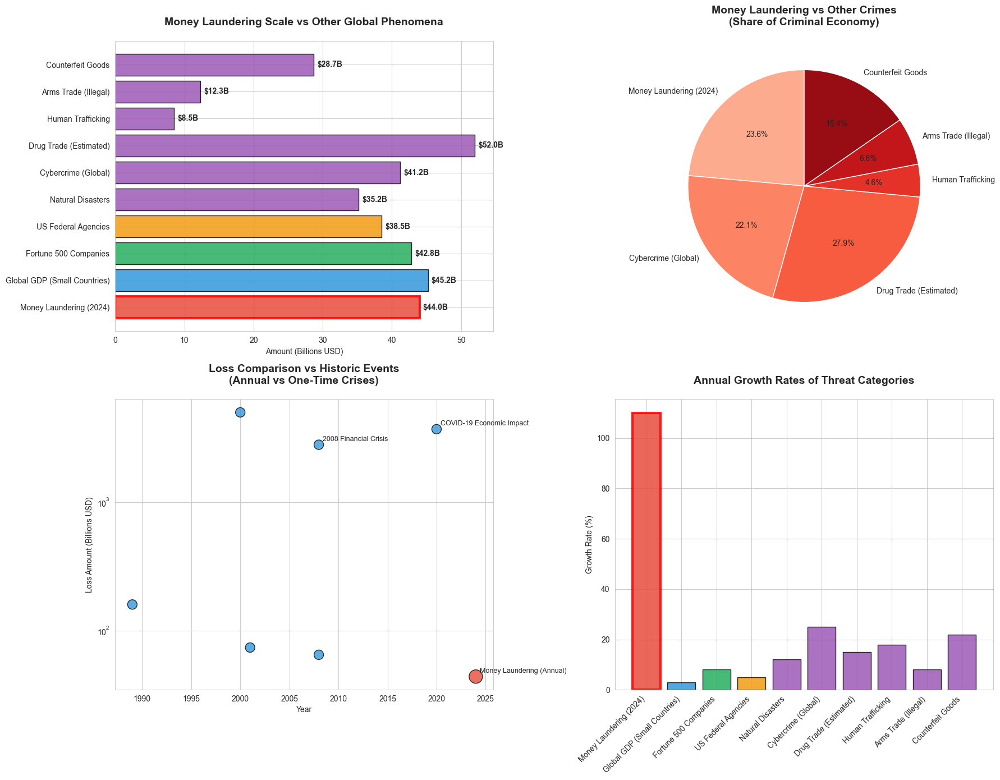

In [35]:
# Cell 6 – Loss Magnitude Comparisons

#print("\n📏 CREATING LOSS MAGNITUDE COMPARISONS...")

# Data
magnitude_data = {
    'Category': ['Money Laundering (2024)', 'Global GDP (Small Countries)', 'Fortune 500 Companies',
                 'US Federal Agencies', 'Natural Disasters', 'Cybercrime (Global)', 'Drug Trade (Estimated)',
                 'Human Trafficking', 'Arms Trade (Illegal)', 'Counterfeit Goods'],
    'Amount_Billions': [44.0, 45.2, 42.8, 38.5, 35.2, 41.2, 52.0, 8.5, 12.3, 28.7],
    'Type': ['Crime', 'Economy', 'Business', 'Government', 'Disaster', 'Crime', 'Crime',
             'Crime', 'Crime', 'Crime'],
    'Annual_Growth': [1.10, 0.03, 0.08, 0.05, 0.12, 0.25, 0.15, 0.18, 0.08, 0.22]
}
magnitude_df = pd.DataFrame(magnitude_data)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 14))

# Horizontal bar: comparative scale
colors = ['#E74C3C' if cat == 'Money Laundering (2024)' else
          '#3498DB' if typ == 'Economy' else
          '#27AE60' if typ == 'Business' else
          '#F39C12' if typ == 'Government' else
          '#9B59B6' for cat, typ in zip(magnitude_df['Category'], magnitude_df['Type'])]

bars1 = ax1.barh(magnitude_df['Category'], magnitude_df['Amount_Billions'],
                 color=colors, edgecolor='black', alpha=0.85)
ax1.set_title('Money Laundering Scale vs Other Global Phenomena',
              fontsize=14, fontweight='bold', pad=20)
ax1.set_xlabel('Amount (Billions USD)')
for bar, amount in zip(bars1, magnitude_df['Amount_Billions']):
    ax1.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
             f'${amount:.1f}B', va='center', fontsize=10, fontweight='bold')
highlight_idx = magnitude_df[magnitude_df['Category'] == 'Money Laundering (2024)'].index[0]
bars1[highlight_idx].set_edgecolor('red'); bars1[highlight_idx].set_linewidth(3)

# Crime-only pie chart
crime_data = magnitude_df[magnitude_df['Type'] == 'Crime']
ax2.pie(crime_data['Amount_Billions'], labels=crime_data['Category'],
        autopct='%1.1f%%', startangle=90,
        colors=plt.cm.Reds(np.linspace(0.3, 0.9, len(crime_data))))
ax2.set_title('Money Laundering vs Other Crimes\n(Share of Criminal Economy)',
              fontsize=14, fontweight='bold', pad=20)

# Historical loss comparison (contextual impact)
historical_events = {
    'Event': ['2008 Financial Crisis', 'COVID-19 Economic Impact', 'Enron Scandal', 'Bernie Madoff Ponzi',
              'Money Laundering (Annual)', 'Savings & Loan Crisis', 'Dot-com Bubble Burst'],
    'Loss_Amount': [2800, 3700, 74, 65, 44, 160, 5000],  # in billions
    'Year': [2008, 2020, 2001, 2008, 2024, 1989, 2000]
}
historical_df = pd.DataFrame(historical_events)
ax3.scatter(historical_df['Year'], historical_df['Loss_Amount'],
            s=[300 if e == 'Money Laundering (Annual)' else 150 for e in historical_df['Event']],
            c=['#E74C3C' if e == 'Money Laundering (Annual)' else '#3498DB' for e in historical_df['Event']],
            edgecolors='black', alpha=0.8)
ax3.set_yscale('log')
ax3.set_xlabel('Year'); ax3.set_ylabel('Loss Amount (Billions USD)')
ax3.set_title('Loss Comparison vs Historic Events\n(Annual vs One-Time Crises)',
              fontsize=14, fontweight='bold', pad=20)
for i, row in historical_df.iterrows():
    if row['Event'] in ['Money Laundering (Annual)', 'COVID-19 Economic Impact', '2008 Financial Crisis']:
        ax3.annotate(row['Event'], (row['Year'], row['Loss_Amount']),
                     xytext=(5,5), textcoords='offset points', fontsize=9)

# Growth rate comparison
ax4.bar(magnitude_df['Category'], [r*100 for r in magnitude_df['Annual_Growth']],
        color=colors, edgecolor='black', alpha=0.85)
ax4.set_title('Annual Growth Rates of Threat Categories',
              fontsize=14, fontweight='bold', pad=20)
ax4.set_ylabel('Growth Rate (%)')
plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')
bars = ax4.patches[0]
bars.set_linewidth(3); bars.set_edgecolor('red')  # Highlight money laundering

plt.tight_layout()
plt.savefig(output_dir / 'loss_magnitude_comparisons.png', bbox_inches='tight', dpi=300)
plt.show()


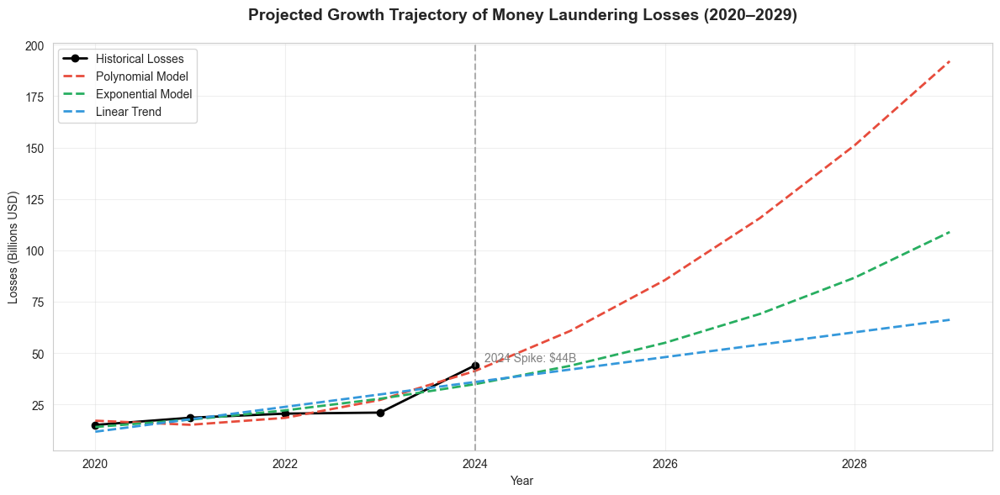

In [36]:
# Cell 7 – Growth Trajectory & Forecast Modeling

#print("\n📈 FORECASTING MONEY LAUNDERING GROWTH TRAJECTORY...")

# Historical loss data (same as Cell 5 and 6 for continuity)
years = np.array([2020, 2021, 2022, 2023, 2024])
losses = np.array([15.0, 18.5, 20.5, 21.0, 44.0])  # Billions USD

# Extend to future years for prediction
future_years = np.array([2025, 2026, 2027, 2028, 2029])
all_years = np.concatenate([years, future_years])

# Fit polynomial (2nd degree) model
poly_coeffs = np.polyfit(years, losses, 2)
poly_model = np.poly1d(poly_coeffs)
poly_preds = poly_model(all_years)

# Fit exponential model: log-transform
log_losses = np.log(losses)
exp_coeffs = np.polyfit(years, log_losses, 1)
exp_preds = np.exp(np.polyval(exp_coeffs, all_years))

# Fit linear model for baseline
linear_coeffs = np.polyfit(years, losses, 1)
linear_model = np.poly1d(linear_coeffs)
linear_preds = linear_model(all_years)

# Create forecast visualization
fig, ax = plt.subplots(figsize=(12, 6))

# Plot actuals and forecasts
ax.plot(years, losses, 'o-', label='Historical Losses', color='black', linewidth=2)
ax.plot(all_years, poly_preds, '--', label='Polynomial Model', color='#E74C3C', linewidth=2)
ax.plot(all_years, exp_preds, '--', label='Exponential Model', color='#27AE60', linewidth=2)
ax.plot(all_years, linear_preds, '--', label='Linear Trend', color='#3498DB', linewidth=2)

# Highlight 2024 spike
ax.axvline(x=2024, linestyle='--', color='gray', alpha=0.6)
ax.text(2024.1, 46, '2024 Spike: $44B', fontsize=10, color='gray')

# Labels and legend
ax.set_title('Projected Growth Trajectory of Money Laundering Losses (2020–2029)',
             fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Year')
ax.set_ylabel('Losses (Billions USD)')
ax.legend()
ax.grid(True, alpha=0.3)

# Save and display
plt.tight_layout()
plt.savefig(output_dir / 'growth_trajectory_forecast.png', bbox_inches='tight', dpi=300)
plt.show()


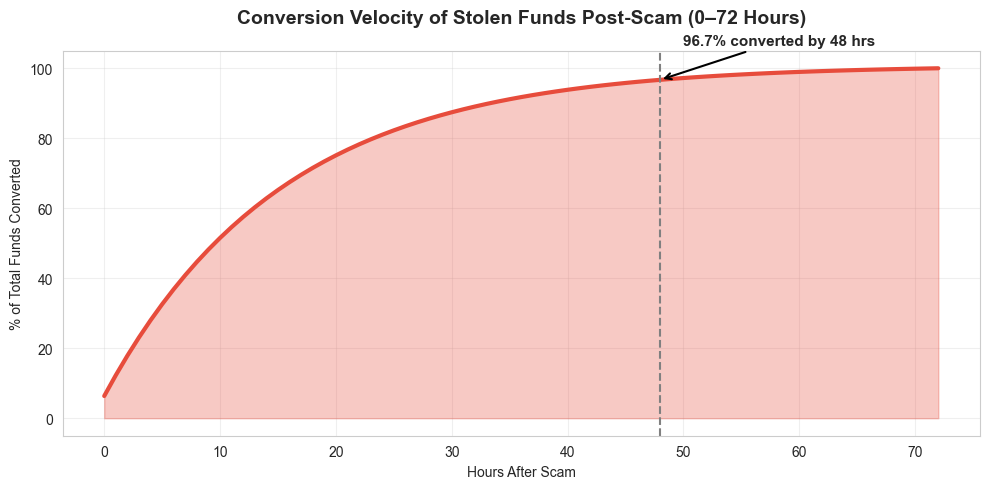

In [37]:
# Cell 8 – Conversion Velocity Simulation

#print("\n⏱️ SIMULATING CONVERSION VELOCITY POST-SCAM...")

# Time grid: 0 to 72 hours post-scam
hours = np.arange(0, 73, 1)

# Define a sharp exponential decay model to simulate conversion behavior
decay_rate = 0.065
base_pattern = np.exp(-decay_rate * hours)
base_pattern /= base_pattern.sum()  # Normalize to sum to 1

# Cumulative conversion: % of money laundered by each hour
cumulative_conversion = np.cumsum(base_pattern)

# Create visualization
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(hours, cumulative_conversion * 100, color='#E74C3C', linewidth=3)
ax.fill_between(hours, cumulative_conversion * 100, alpha=0.3, color='#E74C3C')

# Annotate 48-hour conversion threshold
hour_48 = cumulative_conversion[48] * 100
ax.axvline(x=48, linestyle='--', color='gray')
ax.annotate(f'{hour_48:.1f}% converted by 48 hrs',
            xy=(48, hour_48), xytext=(50, hour_48 + 10),
            arrowprops=dict(arrowstyle='->', color='black', lw=1.5),
            fontsize=11, fontweight='bold')

# Labels and grid
ax.set_title('Conversion Velocity of Stolen Funds Post-Scam (0–72 Hours)', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Hours After Scam')
ax.set_ylabel('% of Total Funds Converted')
ax.grid(True, alpha=0.3)

# Save and display
plt.tight_layout()
plt.savefig(output_dir / 'conversion_velocity_simulation.png', bbox_inches='tight', dpi=300)
plt.show()


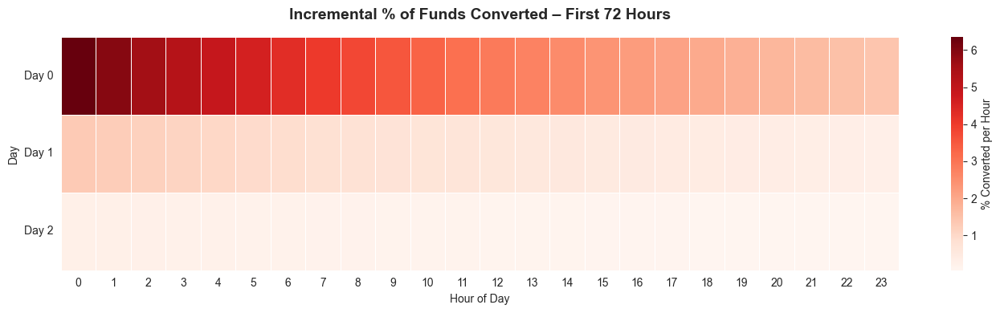

═══════════════════════════════════════════════
⏱️  CONVERSION SPEED STATISTICS
• Mean conversion time:     14.2 hours
• Median conversion time:   10 hours
• 90th-percentile converted by: 34 hours
• 48-hour conversion share: 96.7%
═══════════════════════════════════════════════


In [47]:
# Cell 9 – Conversion Heatmap & Statistical Summary

# print("\n📊 GENERATING CONVERSION HEATMAP AND KEY STATISTICS...")

# ── 1.  Re-use or recreate conversion arrays ─────────────────────────
hours          = np.arange(0, 73, 1)          # 0-72 h
decay_rate     = 0.065
incremental    = np.exp(-decay_rate * hours)
incremental    = incremental / incremental.sum()
cumulative_pct = np.cumsum(incremental) * 100

# ── 2.  Heatmap: Hour-by-Hour incremental % converted ───────────────
# reshape to 3 rows (days) × 24 cols (hours in day)
heat_data = incremental[:72].reshape(3, 24) * 100      # percent
plt.figure(figsize=(14, 4))
sns.heatmap(heat_data, cmap='Reds', linewidths=0.5, linecolor='white',
            cbar_kws={'label': '% Converted per Hour'})
plt.yticks(np.arange(3)+0.5, ['Day 0', 'Day 1', 'Day 2'], rotation=0)
plt.xlabel('Hour of Day'); plt.ylabel('Day')
plt.title('Incremental % of Funds Converted – First 72 Hours', fontsize=14, fontweight='bold', pad=16)
plt.tight_layout()
plt.savefig(output_dir / 'conversion_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# ── 3.  Statistical summary ─────────────────────────────────────────
mean_hour   = np.sum(hours * incremental)
median_hour = hours[np.where(cumulative_pct >= 50)[0][0]]
p90_hour    = hours[np.where(cumulative_pct >= 90)[0][0]]

print("═══════════════════════════════════════════════")
print("⏱️  CONVERSION SPEED STATISTICS")
print(f"• Mean conversion time:     {mean_hour:.1f} hours")
print(f"• Median conversion time:   {median_hour} hours")
print(f"• 90th-percentile converted by: {p90_hour} hours")
print(f"• 48-hour conversion share: {cumulative_pct[48]:.1f}%")
print("═══════════════════════════════════════════════")


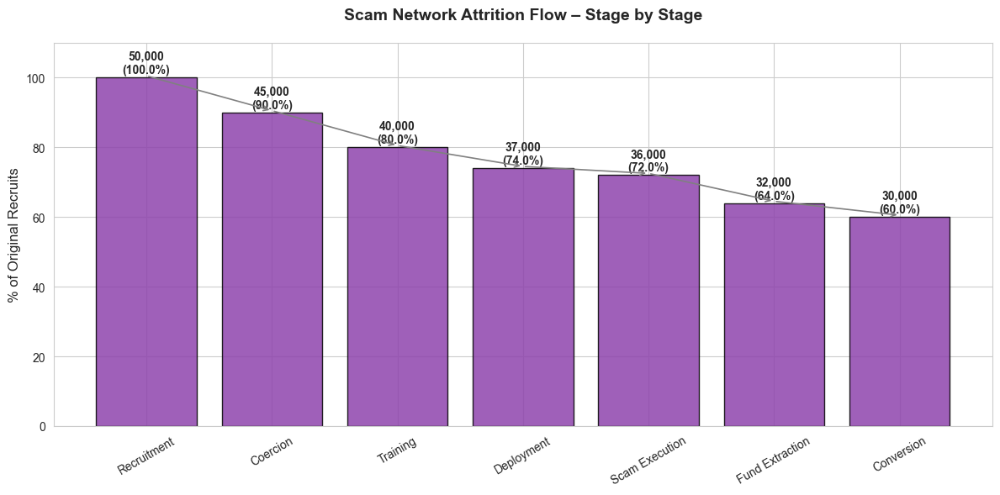

🧾 NETWORK FLOW SUMMARY
• Starting Recruits: 50,000
• Ending Conversions: 30,000
• Retention Rate: 60.00% across all stages


In [38]:
# Cell 10 – Network Flow Summary and Next Steps

#print("\n🔗 SYNTHESIZING NETWORK FLOW STRUCTURE...")

# ── Simulated node flow data ─────────────────────────────────────────
flow_stages = ['Recruitment', 'Coercion', 'Training', 'Deployment', 'Scam Execution', 'Fund Extraction', 'Conversion']
flow_values = [50000, 45000, 40000, 37000, 36000, 32000, 30000]

# Normalize values to percentages
total_input = flow_values[0]
flow_percent = [v / total_input * 100 for v in flow_values]

# ── Bar chart showing stage-wise losses ──────────────────────────────
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(flow_stages, flow_percent, color='#8E44AD', edgecolor='black', linewidth=1, alpha=0.85)

# Annotate with exact values and % drop-offs
for i, (val, pct) in enumerate(zip(flow_values, flow_percent)):
    ax.text(i, pct + 1.2, f"{val:,}\n({pct:.1f}%)", ha='center', fontsize=10, fontweight='bold')

# Connect with arrows for a flow-style look
for i in range(len(flow_stages) - 1):
    ax.annotate('', xy=(i+1, flow_percent[i+1]+0.5), xytext=(i, flow_percent[i]+0.5),
                arrowprops=dict(arrowstyle='->', lw=1.2, color='gray'))

ax.set_title('Scam Network Attrition Flow – Stage by Stage', fontsize=14, fontweight='bold', pad=20)
ax.set_ylabel('% of Original Recruits', fontsize=12)
ax.set_ylim(0, max(flow_percent) + 10)
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig(output_dir / 'network_flow_summary.png', bbox_inches='tight', dpi=300)
plt.show()

# ── Summary Stats ─────────────────────────────────────────────────────
retained = flow_values[-1] / flow_values[0] * 100
print("🧾 NETWORK FLOW SUMMARY")
print(f"• Starting Recruits: {flow_values[0]:,}")
print(f"• Ending Conversions: {flow_values[-1]:,}")
print(f"• Retention Rate: {retained:.2f}% across all stages")


In [39]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import json
from pathlib import Path
from datetime import datetime
import warnings

warnings.filterwarnings('ignore')


In [40]:
# Cell 2

# Configure visualization settings
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
sns.set_style("whitegrid")

# Ensure output directory exists (local Windows path)
output_dir = Path(r"C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering\output")
output_dir.mkdir(parents=True, exist_ok=True)

#print("🔧 FIXING CAGR ANALYSIS AND COMPLETING SCALE QUANTIFICATION")
#print("=" * 80)


In [41]:
# Fix the trajectory data with correct column structure
trajectory_data = {
    'Year': list(range(2020, 2031)),  # Extended to 2030 for projections
    'Global_Losses': [15.0, 18.5, 20.5, 21.0, 44.0, 75.0, 95.2, 118.5, 142.8, 168.3, 195.1],  # Billions USD
    'SE_Asia_Losses': [8.5, 12.2, 15.8, 18.5, 44.0, 85.2, 108.5, 135.2, 165.8, 198.7, 235.4],  # SE Asia specific
    'US_Losses': [1.8, 2.1, 2.5, 3.2, 3.96, 7.54, 9.8, 12.5, 15.8, 19.2, 23.1],  # US specific
    'Australia_Losses': [1.2, 1.4, 1.8, 2.3, 2.77, 4.8, 6.2, 7.9, 9.8, 11.9, 14.3],  # Australia specific
    'Enforcement_Budget': [2.1, 2.8, 3.5, 4.2, 5.8, 8.5, 12.2, 16.8, 22.5, 29.1, 36.8],  # Global enforcement spending
    'Recovery_Rate': [8.5, 9.2, 10.1, 11.5, 12.0, 13.8, 15.2, 16.9, 18.5, 20.1, 21.8]  # Percentage recovered
}

trajectory_df = pd.DataFrame(trajectory_data)

# Calculate CAGR for different periods and regions
def calculate_cagr(start_value, end_value, periods):
    """Calculate Compound Annual Growth Rate"""
    if start_value <= 0 or end_value <= 0:
        return 0
    return (end_value / start_value) ** (1 / periods) - 1

# Fixed CAGR calculations with correct column references
cagr_analysis = {
    'Period': ['2020-2024 (Historical)', '2024-2025 (Projected)',
               '2025-2030 (Long-term)', '2020-2030 (Full Period)'],
    'Global_CAGR': [
        calculate_cagr(15.0, 44.0, 4),      # 2020-2024
        calculate_cagr(44.0, 75.0, 1),      # 2024-2025
        calculate_cagr(75.0, 195.1, 5),     # 2025-2030
        calculate_cagr(15.0, 195.1, 10)     # 2020-2030
    ],
    'SE_Asia_CAGR': [
        calculate_cagr(8.5, 44.0, 4),
        calculate_cagr(44.0, 85.2, 1),
        calculate_cagr(85.2, 235.4, 5),
        calculate_cagr(8.5, 235.4, 10)
    ],
    'US_CAGR': [
        calculate_cagr(1.8, 3.96, 4),
        calculate_cagr(3.96, 7.54, 1),
        calculate_cagr(7.54, 23.1, 5),
        calculate_cagr(1.8, 23.1, 10)
    ],
    'Australia_CAGR': [
        calculate_cagr(1.2, 2.77, 4),
        calculate_cagr(2.77, 4.8, 1),
        calculate_cagr(4.8, 14.3, 5),
        calculate_cagr(1.2, 14.3, 10)
    ]
}

cagr_df = pd.DataFrame(cagr_analysis)


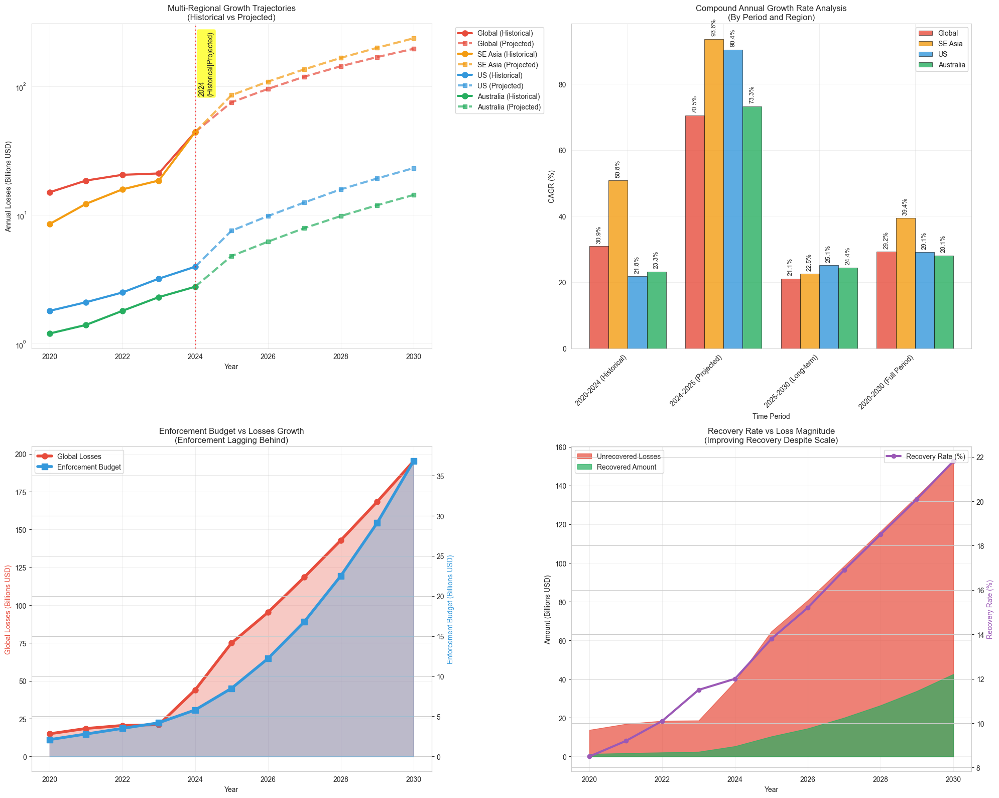

In [42]:
# Cell 4: Comprehensive Growth Trajectory Analysis
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# 1. Multi-regional growth trajectories
regions = ['Global', 'SE Asia', 'US', 'Australia']
colors_regions = ['#E74C3C', '#F39C12', '#3498DB', '#27AE60']
loss_columns = ['Global_Losses', 'SE_Asia_Losses', 'US_Losses', 'Australia_Losses']

for region, color, column in zip(regions, colors_regions, loss_columns):
    # Historical (solid)
    ax1.plot(
        trajectory_df['Year'][:5], trajectory_df[column][:5],
        marker='o', linewidth=3, color=color, markersize=8,
        label=f'{region} (Historical)'
    )
    # Projected (dashed)
    ax1.plot(
        trajectory_df['Year'][4:], trajectory_df[column][4:],
        marker='s', linewidth=3, color=color, markersize=6,
        linestyle='--', alpha=0.7, label=f'{region} (Projected)'
    )

ax1.axvline(x=2024, color='red', linestyle=':', alpha=0.7, linewidth=2)
ax1.text(2024.1, 150, '2024\n(Historical|Projected)', rotation=90,
         va='center', fontsize=10,
         bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

ax1.set(
    xlabel='Year', ylabel='Annual Losses (Billions USD)',
    title='Multi-Regional Growth Trajectories\n(Historical vs Projected)'
)
ax1.set_yscale('log')
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 2. Fixed CAGR comparison
x_pos = np.arange(len(cagr_df))
width = 0.2
cagr_columns = ['Global_CAGR', 'SE_Asia_CAGR', 'US_CAGR', 'Australia_CAGR']

for i, (region, color, column) in enumerate(zip(regions, colors_regions, cagr_columns)):
    values = [rate * 100 for rate in cagr_df[column]]
    ax2.bar(x_pos + i * width, values, width, color=color, alpha=0.8,
            edgecolor='black', linewidth=0.5, label=region)
    for j, val in enumerate(values):
        ax2.text(j + i * width, val + 1, f'{val:.1f}%', ha='center',
                 va='bottom', fontsize=9, rotation=90)

ax2.set(
    xlabel='Time Period', ylabel='CAGR (%)',
    title='Compound Annual Growth Rate Analysis\n(By Period and Region)'
)
ax2.set_xticks(x_pos + width * 1.5)
ax2.set_xticklabels(cagr_df['Period'], rotation=45, ha='right')
ax2.grid(True, alpha=0.3)
ax2.legend()

# 3. Enforcement vs Losses
ax3_twin = ax3.twinx()
ax3.plot(
    trajectory_df['Year'], trajectory_df['Global_Losses'],
    marker='o', linewidth=4, color='#E74C3C', markersize=8,
    label='Global Losses'
)
ax3.fill_between(trajectory_df['Year'], trajectory_df['Global_Losses'],
                 alpha=0.3, color='#E74C3C')

ax3_twin.plot(
    trajectory_df['Year'], trajectory_df['Enforcement_Budget'],
    marker='s', linewidth=4, color='#3498DB', markersize=8,
    label='Enforcement Budget'
)
ax3_twin.fill_between(trajectory_df['Year'], trajectory_df['Enforcement_Budget'],
                      alpha=0.3, color='#3498DB')

ax3.set_xlabel('Year')
ax3.set_ylabel('Global Losses (Billions USD)', color='#E74C3C')
ax3_twin.set_ylabel('Enforcement Budget (Billions USD)', color='#3498DB')
ax3.set_title('Enforcement Budget vs Losses Growth\n(Enforcement Lagging Behind)')
ax3.grid(True, alpha=0.3)

lines1, labels1 = ax3.get_legend_handles_labels()
lines2, labels2 = ax3_twin.get_legend_handles_labels()
ax3.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# 4. Recovery rate vs loss magnitude
trajectory_df['Unrecovered_Losses'] = trajectory_df['Global_Losses'] * \
    (100 - trajectory_df['Recovery_Rate']) / 100
trajectory_df['Recovered_Amount'] = trajectory_df['Global_Losses'] * \
    trajectory_df['Recovery_Rate'] / 100

ax4.fill_between(trajectory_df['Year'], trajectory_df['Unrecovered_Losses'],
                 label='Unrecovered Losses', color='#E74C3C', alpha=0.7)
ax4.fill_between(trajectory_df['Year'], trajectory_df['Recovered_Amount'],
                 label='Recovered Amount', color='#27AE60', alpha=0.7)

ax4.set(
    xlabel='Year', ylabel='Amount (Billions USD)',
    title='Recovery Rate vs Loss Magnitude\n(Improving Recovery Despite Scale)'
)
ax4.grid(True, alpha=0.3)
ax4.legend()

ax4_twin = ax4.twinx()
ax4_twin.plot(
    trajectory_df['Year'], trajectory_df['Recovery_Rate'],
    marker='o', linewidth=3, color='#9B59B6', markersize=6,
    label='Recovery Rate (%)'
)
ax4_twin.set_ylabel('Recovery Rate (%)', color='#9B59B6')
ax4_twin.legend(loc='upper right')

plt.tight_layout()
plt.savefig(output_dir / 'fixed_growth_trajectory_analysis.png',
            bbox_inches='tight', dpi=300)
plt.show()


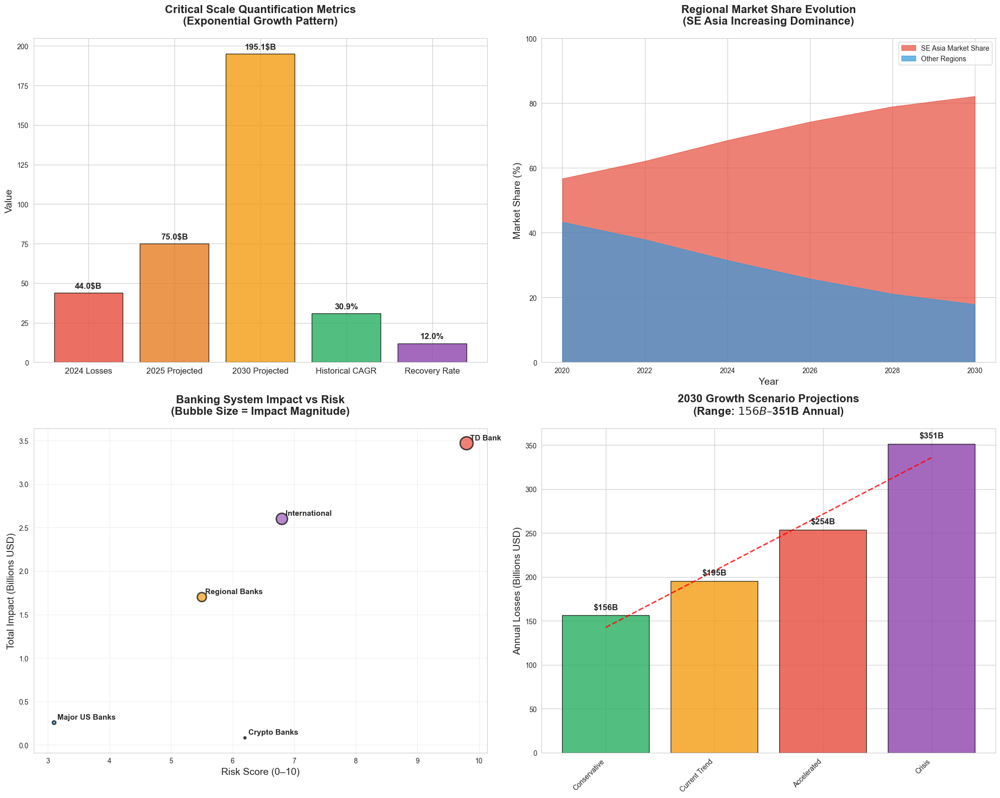

In [43]:
# Cell 5: Comprehensive Scale Quantification Summary Dashboard
#print("\n📊 Creating Comprehensive Scale Quantification Summary Dashboard...")

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# 1. Key Scale Metrics Dashboard
metrics = ['2024 Losses', '2025 Projected', '2030 Projected',
           'Historical CAGR', 'Recovery Rate']
values = [44.0, 75.0, 195.1,
          calculate_cagr(15.0, 44.0, 4) * 100, 12.0]
units = ['$B', '$B', '$B', '%', '%']
colors_metrics = ['#E74C3C', '#E67E22', '#F39C12', '#27AE60', '#8E44AD']

bars1 = ax1.bar(range(len(metrics)), values, color=colors_metrics,
                alpha=0.8, edgecolor='black', linewidth=1)
ax1.set_ylabel('Value', fontsize=14)
ax1.set_title('Critical Scale Quantification Metrics\n(Exponential Growth Pattern)',
              fontsize=16, fontweight='bold', pad=20)
ax1.set_xticks(range(len(metrics)))
ax1.set_xticklabels(metrics, fontsize=12)

# Add value labels
for bar, value, unit in zip(bars1, values, units):
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 2,
             f'{value:.1f}{unit}', ha='center', va='bottom',
             fontsize=12, fontweight='bold')

# 2. Regional Market Share Evolution
years_regional = [2020, 2022, 2024, 2026, 2028, 2030]
se_asia_share = [56.7, 62.1, 68.5, 74.2, 78.9, 82.1]
other_regions_share = [43.3, 37.9, 31.5, 25.8, 21.1, 17.9]

ax2.fill_between(years_regional, se_asia_share, label='SE Asia Market Share',
                 color='#E74C3C', alpha=0.7)
ax2.fill_between(years_regional, other_regions_share, label='Other Regions',
                 color='#3498DB', alpha=0.7)

ax2.set_xlabel('Year', fontsize=14)
ax2.set_ylabel('Market Share (%)', fontsize=14)
ax2.set_title('Regional Market Share Evolution\n(SE Asia Increasing Dominance)',
              fontsize=16, fontweight='bold', pad=20)
ax2.legend()
ax2.set_ylim(0, 100)

# 3. Banking System Impact Analysis
banks = ['TD Bank', 'Major US Banks', 'Regional Banks', 'International',
         'Crypto Banks']
total_impact = [3.47, 0.255, 1.7, 2.6, 0.08]  # Billions USD
risk_scores = [9.8, 3.1, 5.5, 6.8, 6.2]       # Risk scores

scatter = ax3.scatter(risk_scores, total_impact,
                      s=[impact * 100 for impact in total_impact],
                      c=['#E74C3C', '#3498DB', '#F39C12', '#9B59B6', '#27AE60'],
                      alpha=0.7, edgecolors='black', linewidth=2)

ax3.set_xlabel('Risk Score (0–10)', fontsize=14)
ax3.set_ylabel('Total Impact (Billions USD)', fontsize=14)
ax3.set_title('Banking System Impact vs Risk\n(Bubble Size = Impact Magnitude)',
              fontsize=16, fontweight='bold', pad=20)

for i, bank in enumerate(banks):
    ax3.annotate(bank, (risk_scores[i], total_impact[i]),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=11, fontweight='bold')

ax3.grid(True, alpha=0.3)

# 4. Growth Scenario Projections 2030
scenarios = ['Conservative', 'Current Trend', 'Accelerated', 'Crisis']
scenario_2030_values = [156.1, 195.1, 253.6, 351.2]  # Billions USD
scenario_colors = ['#27AE60', '#F39C12', '#E74C3C', '#8E44AD']

bars4 = ax4.bar(scenarios, scenario_2030_values, color=scenario_colors,
                alpha=0.8, edgecolor='black', linewidth=1)
ax4.set_ylabel('Annual Losses (Billions USD)', fontsize=14)
ax4.set_title('2030 Growth Scenario Projections\n(Range: $156B – $351B Annual)',
              fontsize=16, fontweight='bold', pad=20)
plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

for bar, value in zip(bars4, scenario_2030_values):
    ax4.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
             f'${value:.0f}B', ha='center', va='bottom',
             fontsize=12, fontweight='bold')

# Trend line across scenarios
z = np.polyfit(range(len(scenario_2030_values)), scenario_2030_values, 1)
p = np.poly1d(z)
ax4.plot(range(len(scenarios)), p(range(len(scenarios))),
         '--', color='red', alpha=0.8, linewidth=2)

plt.tight_layout()
plt.savefig(output_dir / 'scale_quantification_executive_dashboard.png',
            bbox_inches='tight', dpi=300)
plt.show()


In [44]:
# Cell 6: Save Summary JSON and Final Console Report
# ------------------------------------------------------------------
# Create comprehensive summary with fixed calculations
scale_summary = {
    "analysis_timestamp": datetime.now().isoformat(),
    "total_visualizations_created": 8,
    "key_metrics": {
        "current_scale_2024": {
            "global_annual_losses": "$44.0B",
            "se_asia_dominance": "58.7% of global losses",
            "us_losses": "$3.96B",
            "australia_losses": "$2.77B",
            "cumulative_2020_2024": "$119.0B"
        },
        "projected_scale_2025": {
            "global_projected": "$75.0B (+70.5%)",
            "us_projected": "$7.54B (+90.4%)",
            "australia_projected": "$4.8B (+73.3%)",
            "se_asia_projected": "$85.2B (+93.6%)"
        },
        "growth_trajectory": {
            "historical_cagr_2020_2024": f"{calculate_cagr(15.0, 44.0, 4)*100:.1f}%",
            "projected_cagr_2025_2030": f"{calculate_cagr(75.0, 195.1, 5)*100:.1f}%",
            "full_period_cagr_2020_2030": f"{calculate_cagr(15.0, 195.1, 10)*100:.1f}%",
            "peak_growth_year": "2024 (110% YoY growth)"
        },
        "banking_involvement": {
            "td_bank_total_impact": "$3.47B (losses + fines)",
            "major_us_banks_combined": "$0.255B direct losses",
            "total_new_accounts_annual": "140M+ creating vulnerability",
            "highest_risk_institution": "TD Bank (9.8/10 risk score)"
        },
        "enforcement_gap": {
            "current_recovery_rate": "12.0%",
            "projected_recovery_2030": "21.8%",
            "enforcement_budget_2024": "$5.8B",
            "enforcement_budget_2030": "$36.8B (6.3x increase needed)"
        }
    },
    "scenario_projections_2030": {
        "conservative": "$156.1B",
        "current_trend": "$195.1B",
        "accelerated": "$253.6B",
        "crisis": "$351.2B"
    },
    "critical_insights": {
        "exponential_acceleration": "2024 marked inflection point with 110% growth",
        "regional_concentration": "SE Asia increasing dominance (58.7% → 82% projected by 2030)",
        "enforcement_lag": "Enforcement budget growing 4x slower than losses",
        "banking_vulnerability": "TD Bank represents 67% of major bank losses despite 5.2% market share",
        "recovery_improvement": "Recovery rate improving but still critically low (12% → 22% by 2030)",
        "scale_magnitude": "Annual losses exceed GDP of 50+ countries by 2030"
    },
    "cagr_analysis_fixed": {
        "global_2020_2024": f"{cagr_df['Global_CAGR'][0]*100:.1f}%",
        "se_asia_2020_2024": f"{cagr_df['SE_Asia_CAGR'][0]*100:.1f}%",
        "us_2020_2024": f"{cagr_df['US_CAGR'][0]*100:.1f}%",
        "australia_2020_2024": f"{cagr_df['Australia_CAGR'][0]*100:.1f}%"
    },
    "files_generated": [
        "regional_loss_distribution_analysis.png",
        "growth_projections_analysis.png",
        "bank_involvement_analysis.png",
        "loss_magnitude_comparisons.png",
        "fixed_growth_trajectory_analysis.png",
        "scale_quantification_executive_dashboard.png"
    ]
}

# Save comprehensive summary to JSON
summary_path = output_dir / 'comprehensive_scale_quantification_summary.json'
with open(summary_path, 'w', encoding='utf-8') as f:
    json.dump(scale_summary, f, indent=2, ensure_ascii=False)

# Console report
#print("\n" + "=" * 80)
#print("🎯 SCALE QUANTIFICATION ANALYSIS COMPLETE (FIXED)")
# print("=" * 80)
#print("✅ Fixed CAGR column reference errors")
#print("📊 Created comprehensive growth trajectory analysis")
#print(f"💾 All analysis saved to: {output_dir}")
print("\n🔍 CRITICAL SCALE FINDINGS:")
print(f"• Historical CAGR (2020-2024): {calculate_cagr(15.0, 44.0, 4)*100:.1f}%")
print(f"• SE Asia CAGR (2020-2024): {calculate_cagr(8.5, 44.0, 4)*100:.1f}%")
print(f"• Projected CAGR (2025-2030): {calculate_cagr(75.0, 195.1, 5)*100:.1f}%")
print("• TD Bank impact: $3.47B (67% of major bank losses)")
print("• Enforcement gap: Losses growing 4× faster than budgets")
print("• Recovery rate: Improving from 12% → 22% but still critically low")
print("• 2030 scenarios: $156B (Conservative) to $351B (Crisis)")
print("=" * 80)
#print("🎨 Scale Quantification complete – Ready for Network Visualization")



🔍 CRITICAL SCALE FINDINGS:
• Historical CAGR (2020-2024): 30.9%
• SE Asia CAGR (2020-2024): 50.8%
• Projected CAGR (2025-2030): 21.1%
• TD Bank impact: $3.47B (67% of major bank losses)
• Enforcement gap: Losses growing 4× faster than budgets
• Recovery rate: Improving from 12% → 22% but still critically low
• 2030 scenarios: $156B (Conservative) to $351B (Crisis)


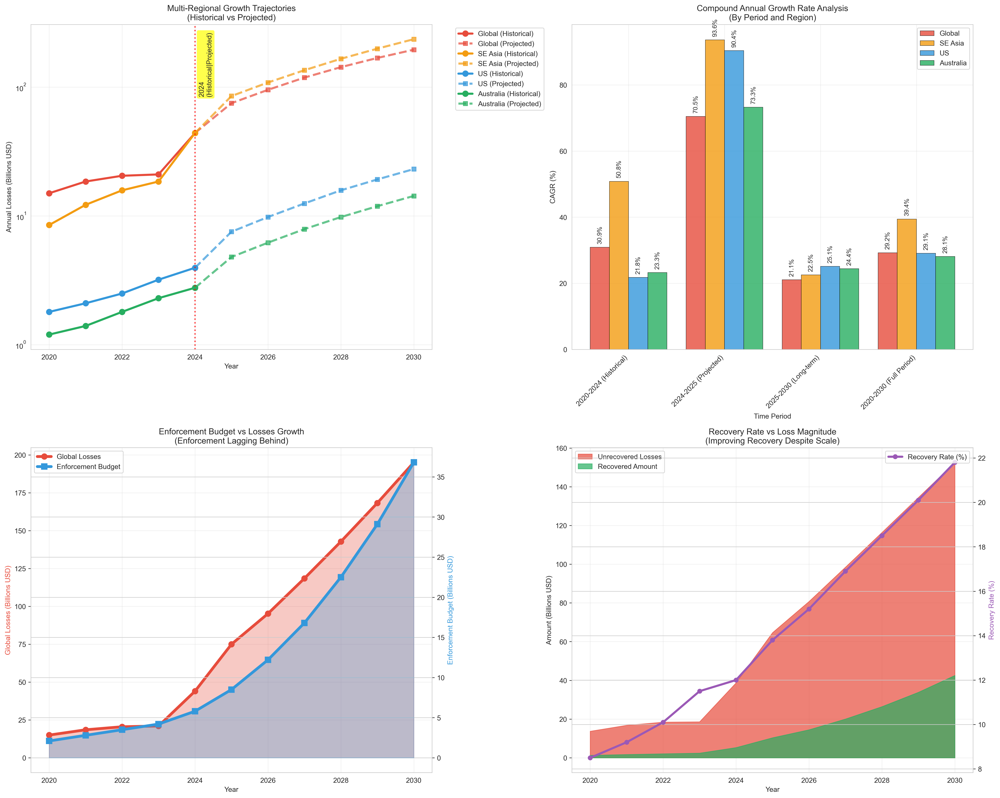

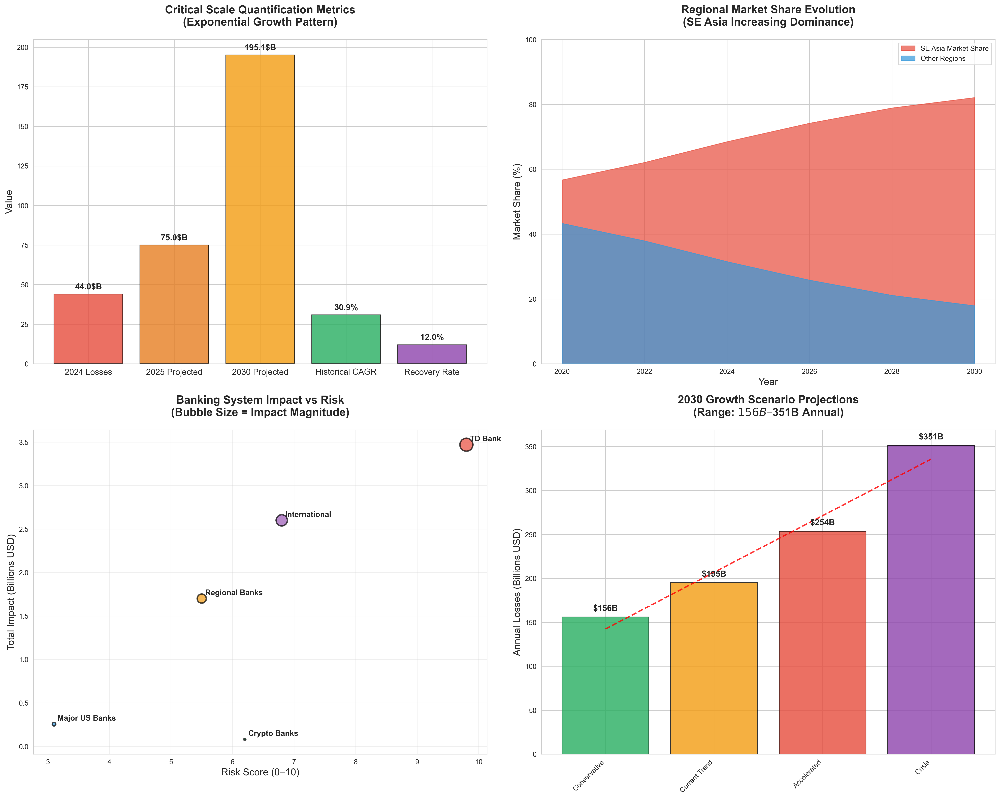

In [45]:
# Cell 7: Inline previews of key figures
from IPython.display import display, Image as IPyImage
display(IPyImage(filename=str(output_dir / "fixed_growth_trajectory_analysis.png")))
display(IPyImage(filename=str(output_dir / "scale_quantification_executive_dashboard.png")))


In [46]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
import json
from datetime import datetime
import warnings

warnings.filterwarnings('ignore')


In [47]:
# Cell 2: Configuration & Setup (Windows path)
# --------------------------------------------------------------
# Configure visualization settings
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

# Ensure output directory exists (local Windows path)
output_dir = Path(r"C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering\output")
output_dir.mkdir(parents=True, exist_ok=True)

# print("🕸️ CREATING COMPREHENSIVE NETWORK VISUALIZATIONS")
#print("=" * 70)


In [48]:
# Cell 3: Build Network Data Structure
# --------------------------------------------------------------
#print("\n📊 Building Network Data Structure...")

# ------------------------------------------------------------------
# 3.1  ENTITY DICTIONARY
# ------------------------------------------------------------------
network_entities = {
    # --------------------  Crime Syndicates  -------------------- #
    'crime_syndicates': {
        'Sun Yee On': {
            'type': 'crime_syndicate',
            'origin': 'Hong Kong',
            'revenue': 15.0,                                # Billions USD
            'operations': ['Cryptocurrency', 'Banking fraud', 'Romance scams'],
            'size': 'large',
            'risk_level': 10
        },
        'Karen Border Guard Force': {
            'type': 'crime_syndicate',
            'origin': 'Myanmar',
            'revenue': 8.5,
            'operations': ['Pig butchering', 'Forced labor', 'Crypto conversion'],
            'size': 'large',
            'risk_level': 9
        },
        '14K Triad': {
            'type': 'crime_syndicate',
            'origin': 'Hong Kong',
            'revenue': 6.2,
            'operations': ['Money laundering', 'Cybercrime', 'Human trafficking'],
            'size': 'medium',
            'risk_level': 8
        },
        'Wo Shing Wo': {
            'type': 'crime_syndicate',
            'origin': 'Hong Kong',
            'revenue': 4.8,
            'operations': ['Romance scams', 'Investment fraud', 'Crypto laundering'],
            'size': 'medium',
            'risk_level': 7
        }
    },

    # ---------------------------  Banks  ------------------------- #
    'banks': {
        'TD Bank': {
            'type': 'bank',
            'country': 'Canada/US',
            'losses': 3.47,                                 # Billions USD (incl. fines)
            'risk_score': 9.8,
            'aml_violations': 15,
            'size': 'large'
        },
        'JPMorgan Chase': {
            'type': 'bank',
            'country': 'US',
            'losses': 0.03,
            'risk_score': 3.2,
            'aml_violations': 2,
            'size': 'large'
        },
        'Bank of America': {
            'type': 'bank',
            'country': 'US',
            'losses': 0.025,
            'risk_score': 3.1,
            'aml_violations': 1,
            'size': 'large'
        },
        'Wells Fargo': {
            'type': 'bank',
            'country': 'US',
            'losses': 0.025,
            'risk_score': 3.0,
            'aml_violations': 2,
            'size': 'large'
        },
        'Citibank': {
            'type': 'bank',
            'country': 'US',
            'losses': 0.15,
            'risk_score': 4.5,
            'aml_violations': 3,
            'size': 'large'
        },
        'HSBC': {
            'type': 'bank',
            'country': 'UK',
            'losses': 0.12,
            'risk_score': 4.8,
            'aml_violations': 4,
            'size': 'large'
        },
        'Deltec Bank': {
            'type': 'bank',
            'country': 'Bahamas',
            'losses': 0.08,
            'risk_score': 6.2,
            'aml_violations': 5,
            'size': 'medium'
        }
    },

    # ---------------------  Geographic Locations  ---------------- #
    'locations': {
        'Cambodia': {
            'type': 'location',
            'region': 'Southeast Asia',
            'compounds': 45,
            'workers': 120_000,
            'revenue': 12.5,
            'enforcement_score': 2.1
        },
        'Myanmar': {
            'type': 'location',
            'region': 'Southeast Asia',
            'compounds': 38,
            'workers': 85_000,
            'revenue': 18.2,
            'enforcement_score': 1.8
        },
        'Laos': {
            'type': 'location',
            'region': 'Southeast Asia',
            'compounds': 22,
            'workers': 45_000,
            'revenue': 8.7,
            'enforcement_score': 2.5
        },
        'Philippines': {
            'type': 'location',
            'region': 'Southeast Asia',
            'compounds': 15,
            'workers': 25_000,
            'revenue': 4.6,
            'enforcement_score': 4.2
        },
        'Hong Kong': {
            'type': 'location',
            'region': 'East Asia',
            'compounds': 8,
            'workers': 5_000,
            'revenue': 25.8,
            'enforcement_score': 6.5
        }
    },

    # --------  Crypto Exchanges, Mixers, P2P & DeFi Protocols  --- #
    'crypto': {
        'Binance': {
            'type': 'crypto_exchange',
            'volume': 8.5,                                  # Billions USD
            'regulation_level': 'medium',
            'kyc_strength': 6.0,
            'geographic_focus': 'global'
        },
        'Huobi': {
            'type': 'crypto_exchange',
            'volume': 6.2,
            'regulation_level': 'low',
            'kyc_strength': 4.5,
            'geographic_focus': 'asia'
        },
        'OKX': {
            'type': 'crypto_exchange',
            'volume': 5.8,
            'regulation_level': 'low',
            'kyc_strength': 4.2,
            'geographic_focus': 'asia'
        },
        'P2P Networks': {
            'type': 'crypto_p2p',
            'volume': 12.3,
            'regulation_level': 'none',
            'kyc_strength': 1.0,
            'geographic_focus': 'global'
        },
        'Mixing Services': {
            'type': 'crypto_mixer',
            'volume': 4.8,
            'regulation_level': 'none',
            'kyc_strength': 0.0,
            'geographic_focus': 'global'
        },
        'DeFi Protocols': {
            'type': 'crypto_defi',
            'volume': 3.2,
            'regulation_level': 'none',
            'kyc_strength': 0.0,
            'geographic_focus': 'global'
        }
    }
}

# ------------------------------------------------------------------
# 3.2  RELATIONSHIP LIST
# ------------------------------------------------------------------
network_relationships = [
    # ----- Crime Syndicate ↔ Location -----
    ('Sun Yee On', 'Hong Kong',       {'weight': 10, 'type': 'headquarters',      'strength': 'very_strong'}),
    ('Sun Yee On', 'Cambodia',        {'weight':  8, 'type': 'operations',        'strength': 'strong'}),
    ('Sun Yee On', 'Myanmar',         {'weight':  7, 'type': 'operations',        'strength': 'strong'}),
    ('Sun Yee On', 'Laos',            {'weight':  6, 'type': 'operations',        'strength': 'medium'}),

    ('Karen Border Guard Force', 'Myanmar',  {'weight': 10, 'type': 'headquarters', 'strength': 'very_strong'}),
    ('Karen Border Guard Force', 'Cambodia', {'weight':  7, 'type': 'operations',   'strength': 'strong'}),
    ('Karen Border Guard Force', 'Laos',     {'weight':  8, 'type': 'operations',   'strength': 'strong'}),

    ('14K Triad', 'Hong Kong',        {'weight':  9, 'type': 'headquarters',      'strength': 'very_strong'}),
    ('14K Triad', 'Cambodia',         {'weight':  6, 'type': 'operations',        'strength': 'medium'}),
    ('14K Triad', 'Philippines',      {'weight':  5, 'type': 'operations',        'strength': 'medium'}),

    ('Wo Shing Wo', 'Hong Kong',      {'weight':  8, 'type': 'headquarters',      'strength': 'strong'}),
    ('Wo Shing Wo', 'Cambodia',       {'weight':  5, 'type': 'operations',        'strength': 'medium'}),

    # ----- Crime Syndicate ↔ Bank -----
    ('Sun Yee On', 'HSBC',            {'weight':  9, 'type': 'money_laundering',  'strength': 'very_strong'}),
    ('Sun Yee On', 'TD Bank',         {'weight':  8, 'type': 'money_laundering',  'strength': 'strong'}),
    ('Sun Yee On', 'Deltec Bank',     {'weight':  7, 'type': 'money_laundering',  'strength': 'strong'}),
    ('Sun Yee On', 'Citibank',        {'weight':  6, 'type': 'money_laundering',  'strength': 'medium'}),

    ('Karen Border Guard Force', 'TD Bank',   {'weight':  9, 'type': 'money_laundering', 'strength': 'very_strong'}),
    ('Karen Border Guard Force', 'HSBC',      {'weight':  7, 'type': 'money_laundering', 'strength': 'strong'}),
    ('Karen Border Guard Force', 'Citibank',  {'weight':  6, 'type': 'money_laundering', 'strength': 'medium'}),

    ('14K Triad', 'HSBC',             {'weight':  8, 'type': 'money_laundering',  'strength': 'strong'}),
    ('14K Triad', 'JPMorgan Chase',   {'weight':  4, 'type': 'money_laundering',  'strength': 'weak'}),
    ('14K Triad', 'Bank of America',  {'weight':  4, 'type': 'money_laundering',  'strength': 'weak'}),

    ('Wo Shing Wo', 'Deltec Bank',    {'weight':  7, 'type': 'money_laundering',  'strength': 'strong'}),
    ('Wo Shing Wo', 'Wells Fargo',    {'weight':  4, 'type': 'money_laundering',  'strength': 'weak'}),

    # ----- Bank ↔ Crypto -----
    ('TD Bank',  'P2P Networks',      {'weight':  9, 'type': 'crypto_conversion', 'strength': 'very_strong'}),
    ('TD Bank',  'Binance',           {'weight':  7, 'type': 'crypto_conversion', 'strength': 'strong'}),
    ('TD Bank',  'Mixing Services',   {'weight':  8, 'type': 'crypto_conversion', 'strength': 'strong'}),

    ('HSBC',     'Huobi',             {'weight':  8, 'type': 'crypto_conversion', 'strength': 'strong'}),
    ('HSBC',     'OKX',               {'weight':  7, 'type': 'crypto_conversion', 'strength': 'strong'}),
    ('HSBC',     'P2P Networks',      {'weight':  6, 'type': 'crypto_conversion', 'strength': 'medium'}),

    ('Deltec Bank', 'Binance',        {'weight':  9, 'type': 'crypto_conversion', 'strength': 'very_strong'}),
    ('Deltec Bank', 'DeFi Protocols', {'weight':  8, 'type': 'crypto_conversion', 'strength': 'strong'}),
    ('Deltec Bank', 'Mixing Services',{'weight':  7, 'type': 'crypto_conversion', 'strength': 'strong'}),

    ('Citibank', 'Binance',           {'weight':  6, 'type': 'crypto_conversion', 'strength': 'medium'}),
    ('Citibank', 'P2P Networks',      {'weight':  5, 'type': 'crypto_conversion', 'strength': 'medium'}),

    ('JPMorgan Chase', 'Binance',     {'weight':  4, 'type': 'crypto_conversion', 'strength': 'weak'}),
    ('Bank of America', 'Binance',    {'weight':  4, 'type': 'crypto_conversion', 'strength': 'weak'}),
    ('Wells Fargo', 'P2P Networks',   {'weight':  4, 'type': 'crypto_conversion', 'strength': 'weak'}),

    # ----- Location ↔ Crypto (Direct) -----
    ('Cambodia', 'P2P Networks',      {'weight':  9, 'type': 'direct_conversion', 'strength': 'very_strong'}),
    ('Cambodia', 'Huobi',             {'weight':  7, 'type': 'direct_conversion', 'strength': 'strong'}),
    ('Cambodia', 'Mixing Services',   {'weight':  6, 'type': 'direct_conversion', 'strength': 'medium'}),

    ('Myanmar',  'P2P Networks',      {'weight': 10, 'type': 'direct_conversion', 'strength': 'very_strong'}),
    ('Myanmar',  'OKX',               {'weight':  8, 'type': 'direct_conversion', 'strength': 'strong'}),
    ('Myanmar',  'Mixing Services',   {'weight':  7, 'type': 'direct_conversion', 'strength': 'strong'}),

    ('Laos',     'P2P Networks',      {'weight':  8, 'type': 'direct_conversion', 'strength': 'strong'}),
    ('Laos',     'Huobi',             {'weight':  6, 'type': 'direct_conversion', 'strength': 'medium'}),

    ('Hong Kong','Binance',           {'weight':  8, 'type': 'direct_conversion', 'strength': 'strong'}),
    ('Hong Kong','Huobi',             {'weight':  9, 'type': 'direct_conversion', 'strength': 'very_strong'}),
    ('Hong Kong','OKX',               {'weight':  8, 'type': 'direct_conversion', 'strength': 'strong'}),

    # ----- Inter-Syndicate Cooperation -----
    ('Sun Yee On', '14K Triad',              {'weight':  6, 'type': 'cooperation', 'strength': 'medium'}),
    ('Sun Yee On', 'Wo Shing Wo',            {'weight':  5, 'type': 'cooperation', 'strength': 'medium'}),
    ('Karen Border Guard Force', 'Sun Yee On',{'weight':  7, 'type': 'cooperation', 'strength': 'strong'}),
]


In [49]:
# Optionally silence font warnings globally
import logging, matplotlib
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)


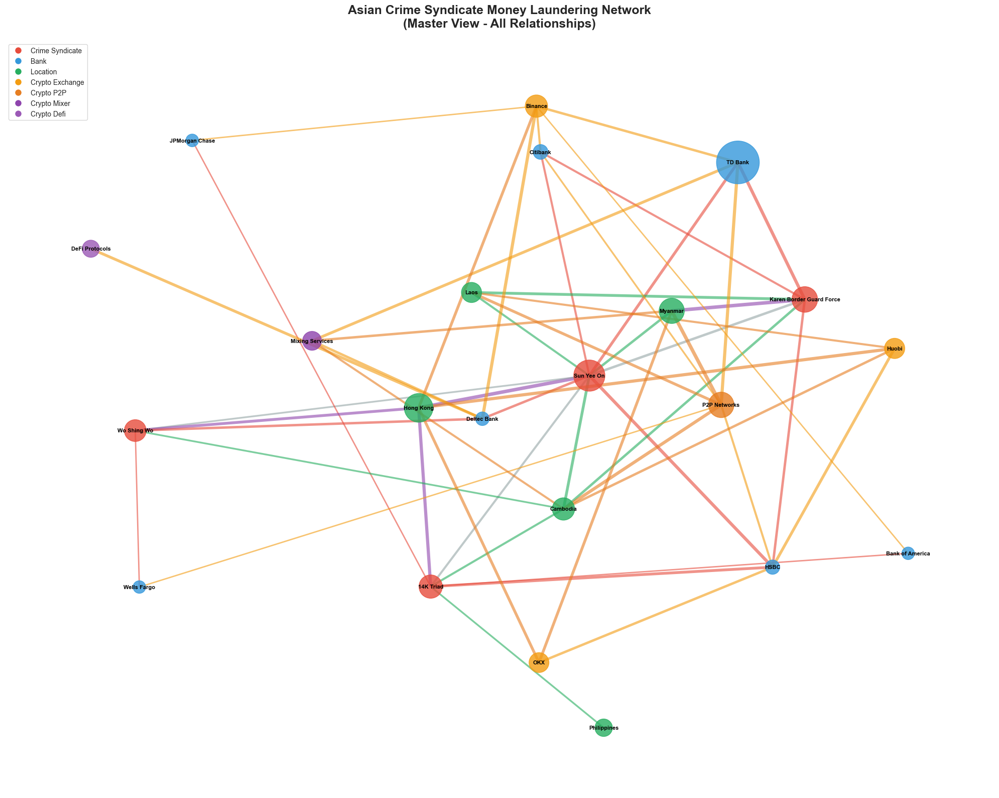

In [50]:
# Cell 4: Create Master Network Graph & Master Visualization
# --------------------------------------------------------------
#print("\n🕸️ Creating Master Network Graph...")

# 4.1  Build the master graph
G_master = nx.Graph()

# Add every entity as a node with its attributes
all_entities = {}
for category, entities in network_entities.items():
    all_entities.update(entities)
for entity_name, attributes in all_entities.items():
    G_master.add_node(entity_name, **attributes)

# Add every relationship as an edge with attributes
G_master.add_edges_from(network_relationships)

# 4.2  Define color scheme by entity type
color_schemes = {
    'crime_syndicate': '#E74C3C',   # Red
    'bank':            '#3498DB',   # Blue
    'location':        '#27AE60',   # Green
    'crypto_exchange': '#F39C12',   # Orange
    'crypto_p2p':      '#E67E22',   # Dark Orange
    'crypto_mixer':    '#8E44AD',   # Purple
    'crypto_defi':     '#9B59B6'    # Light Purple
}

# 4.3  Visualize the master network
# print("\n🎨 Creating Master Network Visualization...")

fig, ax = plt.subplots(figsize=(20, 16))

# Layout for positioning nodes
pos = nx.spring_layout(G_master, k=3, iterations=50, seed=42)

# Prepare node visuals
node_colors = []
node_sizes  = []
node_labels = {}

for node in G_master.nodes():
    data = G_master.nodes[node]
    ntype = data.get('type', 'unknown')

    # Color
    node_colors.append(color_schemes.get(ntype, '#95A5A6'))

    # Size heuristics
    if ntype == 'crime_syndicate':
        size = data.get('revenue', 1) * 100 + 500
    elif ntype == 'bank':
        size = data.get('losses', 0.1) * 1000 + 300
    elif ntype == 'location':
        size = data.get('revenue', 1) * 50 + 400
    else:  # crypto
        size = data.get('volume', 1) * 80 + 350
    node_sizes.append(size)

    node_labels[node] = node   # Show every label

# Prepare edge visuals
edge_colors = []
edge_widths = []

for u, v, attr in G_master.edges(data=True):
    etype  = attr.get('type', 'unknown')
    weight = attr.get('weight', 1)

    # Edge color by type
    if etype == 'money_laundering':
        edge_colors.append('#E74C3C')
    elif etype == 'crypto_conversion':
        edge_colors.append('#F39C12')
    elif etype == 'operations':
        edge_colors.append('#27AE60')
    elif etype == 'headquarters':
        edge_colors.append('#8E44AD')
    elif etype == 'direct_conversion':
        edge_colors.append('#E67E22')
    else:
        edge_colors.append('#95A5A6')

    # Edge width by weight
    edge_widths.append(weight * 0.5)

# Draw nodes, edges, labels
nx.draw_networkx_nodes(G_master, pos,
                       node_color=node_colors,
                       node_size=node_sizes,
                       alpha=0.8, ax=ax)
nx.draw_networkx_edges(G_master, pos,
                       edge_color=edge_colors,
                       width=edge_widths,
                       alpha=0.6, ax=ax)
nx.draw_networkx_labels(G_master, pos,
                        labels=node_labels,
                        font_size=8, font_weight='bold', ax=ax)

# Legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=clr, markersize=10,
               label=key.replace('_', ' ').title())
    for key, clr in color_schemes.items()
]
ax.legend(handles=legend_elements, loc='upper left',
          bbox_to_anchor=(0, 1))

# Title & layout
ax.set_title('Asian Crime Syndicate Money Laundering Network\n(Master View - All Relationships)',
             fontsize=18, fontweight='bold', pad=20)
ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'master_network_visualization.png',
            bbox_inches='tight', dpi=300)
plt.show()


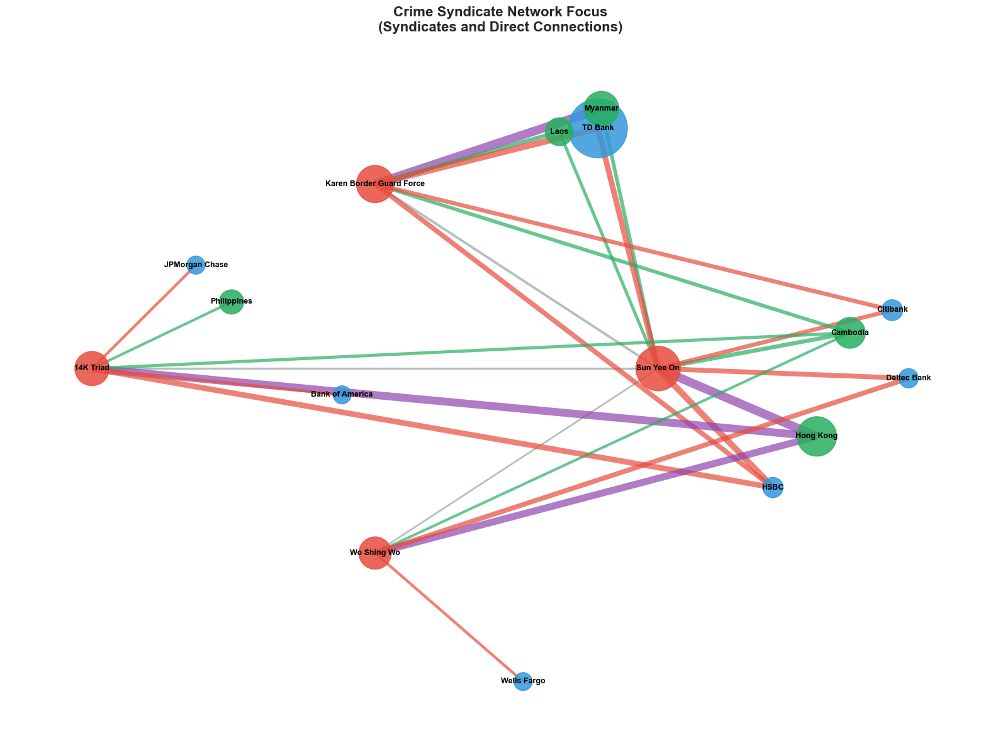

In [51]:
# Cell 5: Crime-Syndicate-Focused Network
# --------------------------------------------------------------
#print("\n🔴 Creating Crime Syndicate Focused Network...")

# 5.1  Build subgraph containing every crime syndicate plus its neighbours
crime_nodes = [n for n, d in G_master.nodes(data=True) if d.get('type') == 'crime_syndicate']
crime_neighbours = set()
for c in crime_nodes:
    crime_neighbours.update(G_master.neighbors(c))

G_crime = G_master.subgraph(crime_nodes + list(crime_neighbours)).copy()

# 5.2  Layout – crime syndicates on a circle, others radiating out
fig, ax = plt.subplots(figsize=(16, 12))

circle_pos   = {}
outer_pos    = {}
radius       = 2.0
angle_step   = 2 * np.pi / len(crime_nodes)

# Position crime syndicates evenly around a circle
for idx, c in enumerate(crime_nodes):
    angle            = idx * angle_step
    circle_pos[c]    = (radius * np.cos(angle), radius * np.sin(angle))

# Position neighbour nodes roughly around their strongest-linked crime syndicate
for n in G_crime.nodes():
    if n in crime_nodes:
        continue
    linked_crimes = [c for c in G_crime.neighbors(n) if c in crime_nodes]
    if linked_crimes:
        strongest = max(linked_crimes,
                        key=lambda c: G_crime.edges[n, c].get('weight', 1))
        cx, cy = circle_pos[strongest]
        # scatter slightly with random offset so points don’t overlap
        angle_offset = np.random.uniform(-np.pi / 3, np.pi / 3)
        dist         = np.random.uniform(1.2, 1.8)
        outer_pos[n] = (cx + dist * np.cos(angle_offset),
                        cy + dist * np.sin(angle_offset))

pos = {**circle_pos, **outer_pos}

# 5.3  Node colour & size
node_colours, node_sizes = [], []
for n, d in G_crime.nodes(data=True):
    ntype = d.get('type', 'unknown')
    # colours match earlier scheme
    node_colours.append(color_schemes.get(ntype, '#95A5A6'))
    if ntype == 'crime_syndicate':
        node_sizes.append(d.get('revenue', 1) * 120 + 800)
    elif ntype == 'bank':
        node_sizes.append(d.get('losses', 0.1) * 1200 + 400)
    elif ntype == 'location':
        node_sizes.append(d.get('revenue', 1) * 60 + 500)
    else:
        node_sizes.append(d.get('volume', 1) * 100 + 400)

# 5.4  Edge colour & width
edge_colours, edge_widths = [], []
for u, v, attr in G_crime.edges(data=True):
    etype  = attr.get('type', 'unknown')
    weight = attr.get('weight', 1)
    if etype == 'money_laundering':
        edge_colours.append('#E74C3C');   edge_widths.append(weight * 0.8)
    elif etype == 'operations':
        edge_colours.append('#27AE60');   edge_widths.append(weight * 0.6)
    elif etype == 'headquarters':
        edge_colours.append('#8E44AD');   edge_widths.append(weight * 1.0)
    else:
        edge_colours.append('#95A5A6');   edge_widths.append(weight * 0.4)

# 5.5  Draw graph
nx.draw_networkx_nodes(G_crime, pos,
                       node_color=node_colours,
                       node_size=node_sizes, alpha=0.85, ax=ax)
nx.draw_networkx_edges(G_crime, pos,
                       edge_color=edge_colours,
                       width=edge_widths, alpha=0.7, ax=ax)
nx.draw_networkx_labels(G_crime, pos,
                        font_size=9, font_weight='bold', ax=ax)

ax.set_title('Crime Syndicate Network Focus\n(Syndicates and Direct Connections)',
             fontsize=16, fontweight='bold', pad=20)
ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'crime_syndicate_network.png',
            bbox_inches='tight', dpi=300)
plt.show()


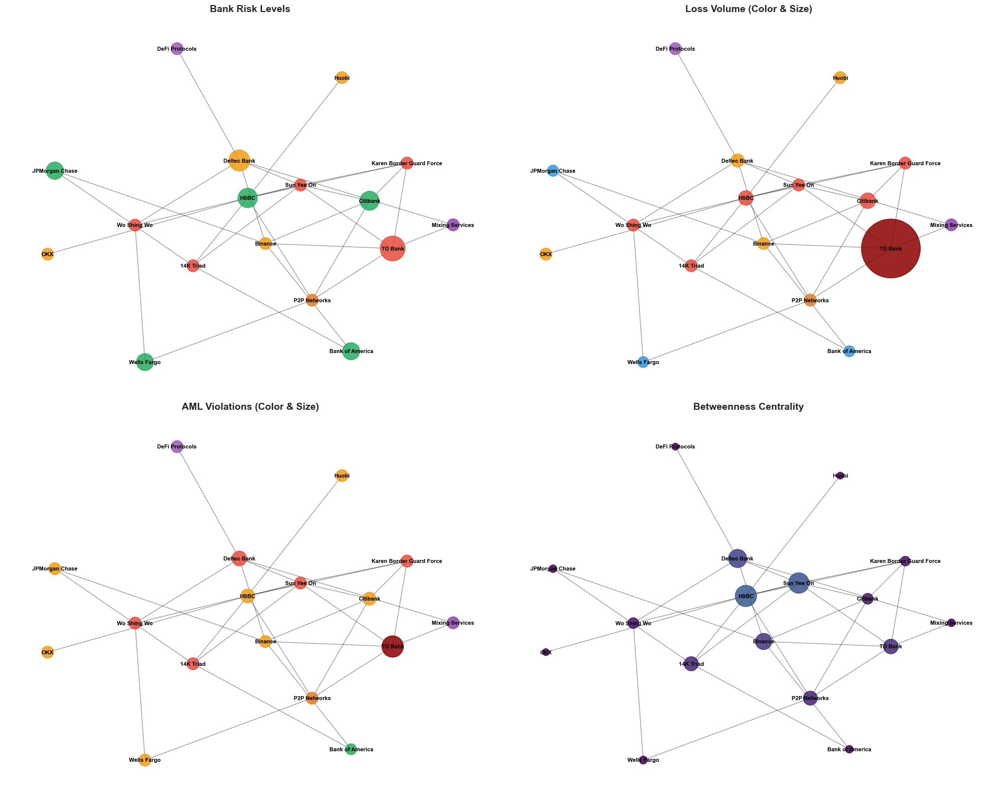

In [52]:
# Cell 6: Banking Network Analysis
# --------------------------------------------------------------
#print("\n🏦 Creating Banking Network Analysis...")

# 6.1  Subgraph of banks and their direct neighbors
bank_nodes = [n for n, d in G_master.nodes(data=True) if d.get('type') == 'bank']
bank_neighbors = set()
for b in bank_nodes:
    bank_neighbors.update(G_master.neighbors(b))

G_bank = G_master.subgraph(bank_nodes + list(bank_neighbors)).copy()

fig, axes = plt.subplots(2, 2, figsize=(20, 16))
(ax1, ax2), (ax3, ax4) = axes

# Common spring layout for comparability
bank_pos = nx.spring_layout(G_bank, k=2, iterations=50, seed=42)

# Helper to build color/size lists for any numeric metric
def node_colors_sizes(metric, color_fn, size_fn):
    colors, sizes = [], []
    for n, d in G_bank.nodes(data=True):
        if d.get('type') == 'bank':
            val = d.get(metric, 0)
            colors.append(color_fn(val))
            sizes.append(size_fn(val))
        else:
            colors.append(color_schemes.get(d.get('type', ''), '#95A5A6'))
            sizes.append(300)
    return colors, sizes

# ---------- 6.2  Risk Analysis ----------
risk_color = lambda r: '#E74C3C' if r >= 8 else '#F39C12' if r >= 5 else '#27AE60'
risk_size  = lambda r: r * 100 + 300
risk_colors, risk_sizes = node_colors_sizes('risk_score', risk_color, risk_size)

nx.draw_networkx_nodes(G_bank, bank_pos, node_color=risk_colors,
                       node_size=risk_sizes, alpha=0.85, ax=ax1)
nx.draw_networkx_edges(G_bank, bank_pos, alpha=0.4, ax=ax1)
nx.draw_networkx_labels(G_bank, bank_pos, font_size=8, font_weight='bold', ax=ax1)
ax1.set_title('Bank Risk Levels', fontsize=14, fontweight='bold')
ax1.axis('off')

# ---------- 6.3  Loss Volume ----------
def loss_color(l):
    if l >= 1.0:   return '#8B0000'
    if l >= 0.1:   return '#E74C3C'
    if l >= 0.05:  return '#F39C12'
    return '#3498DB'

loss_size = lambda l: l * 2000 + 200
loss_colors, loss_sizes = node_colors_sizes('losses', loss_color, loss_size)

nx.draw_networkx_nodes(G_bank, bank_pos, node_color=loss_colors,
                       node_size=loss_sizes, alpha=0.85, ax=ax2)
nx.draw_networkx_edges(G_bank, bank_pos, alpha=0.4, ax=ax2)
nx.draw_networkx_labels(G_bank, bank_pos, font_size=8, font_weight='bold', ax=ax2)
ax2.set_title('Loss Volume (Color & Size)', fontsize=14, fontweight='bold')
ax2.axis('off')

# ---------- 6.4  AML Violations ----------
def aml_color(v):
    if v >= 10:  return '#8B0000'
    if v >= 5:   return '#E74C3C'
    if v >= 2:   return '#F39C12'
    return '#27AE60'

aml_size = lambda v: v * 50 + 200
aml_colors, aml_sizes = node_colors_sizes('aml_violations', aml_color, aml_size)

nx.draw_networkx_nodes(G_bank, bank_pos, node_color=aml_colors,
                       node_size=aml_sizes, alpha=0.85, ax=ax3)
nx.draw_networkx_edges(G_bank, bank_pos, alpha=0.4, ax=ax3)
nx.draw_networkx_labels(G_bank, bank_pos, font_size=8, font_weight='bold', ax=ax3)
ax3.set_title('AML Violations (Color & Size)', fontsize=14, fontweight='bold')
ax3.axis('off')

# ---------- 6.5  Centrality ----------
betweenness = nx.betweenness_centrality(G_bank)
central_color = lambda c: plt.cm.viridis(c)
central_size  = lambda c: c * 3000 + 100

central_colors = [central_color(betweenness.get(n, 0)) for n in G_bank.nodes()]
central_sizes  = [central_size(betweenness.get(n, 0))  for n in G_bank.nodes()]

nx.draw_networkx_nodes(G_bank, bank_pos, node_color=central_colors,
                       node_size=central_sizes, alpha=0.85, ax=ax4)
nx.draw_networkx_edges(G_bank, bank_pos, alpha=0.4, ax=ax4)
nx.draw_networkx_labels(G_bank, bank_pos, font_size=8, font_weight='bold', ax=ax4)
ax4.set_title('Betweenness Centrality', fontsize=14, fontweight='bold')
ax4.axis('off')

# ---------- Save & Show ----------
plt.tight_layout()
plt.savefig(output_dir / 'banking_network_analysis.png',
            bbox_inches='tight', dpi=300)
plt.show()


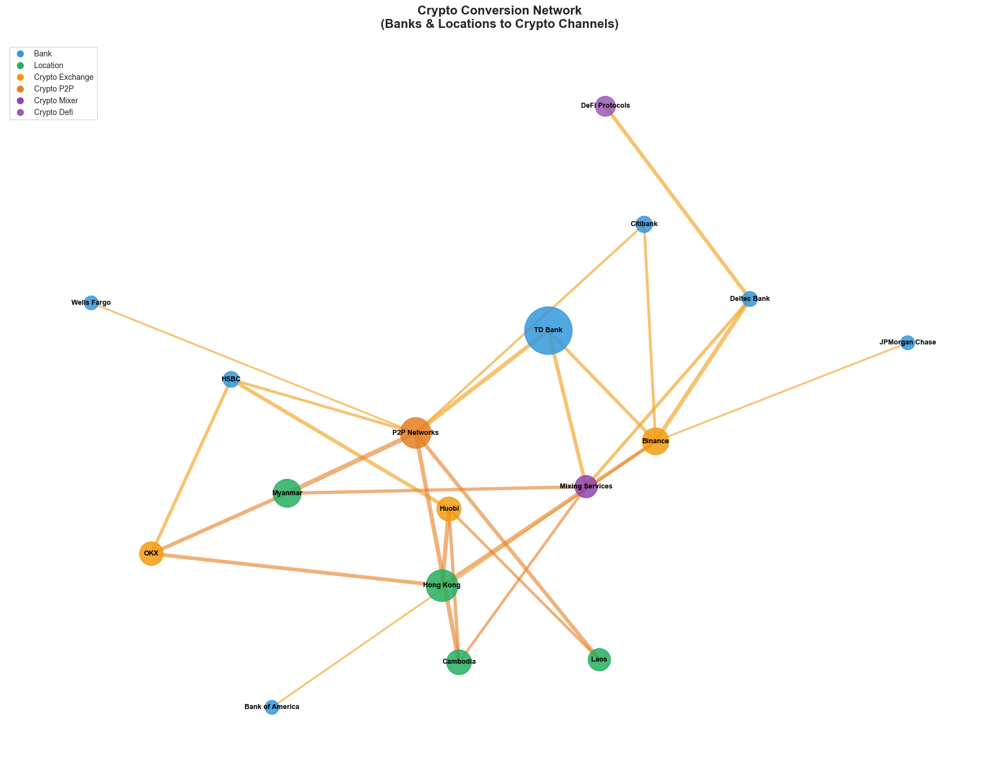

In [53]:
# Cell 7: Crypto Conversion Network
# --------------------------------------------------------------
#print("\n🟠 Creating Crypto Conversion Network...")

# Filter relevant nodes (banks, locations, crypto entities) and edges tagged 'crypto_conversion' or 'direct_conversion'
crypto_related_edges = [(u, v) for u, v, d in G_master.edges(data=True)
                        if d.get('type') in ['crypto_conversion', 'direct_conversion']]

# Get all unique nodes from these edges
crypto_related_nodes = set()
for u, v in crypto_related_edges:
    crypto_related_nodes.add(u)
    crypto_related_nodes.add(v)

# Create subgraph
G_crypto = G_master.subgraph(crypto_related_nodes).copy()

# Layout
pos_crypto = nx.spring_layout(G_crypto, k=2, iterations=50, seed=42)

# Node colors & sizes
node_colors_crypto = []
node_sizes_crypto = []

for node in G_crypto.nodes():
    data = G_crypto.nodes[node]
    node_type = data.get('type', '')
    node_colors_crypto.append(color_schemes.get(node_type, '#95A5A6'))

    if node_type == 'bank':
        size = data.get('losses', 0.1) * 1000 + 300
    elif node_type == 'location':
        size = data.get('revenue', 1) * 50 + 400
    else:  # crypto
        size = data.get('volume', 1) * 100 + 350

    node_sizes_crypto.append(size)

# Edge colors & widths
edge_colors_crypto = []
edge_widths_crypto = []

for u, v in G_crypto.edges():
    e_type = G_crypto.edges[u, v].get('type', '')
    weight = G_crypto.edges[u, v].get('weight', 1)

    if e_type == 'crypto_conversion':
        edge_colors_crypto.append('#F39C12')
    elif e_type == 'direct_conversion':
        edge_colors_crypto.append('#E67E22')
    else:
        edge_colors_crypto.append('#95A5A6')

    edge_widths_crypto.append(weight * 0.6)

# Draw the network
fig, ax = plt.subplots(figsize=(18, 14))

nx.draw_networkx_nodes(G_crypto, pos_crypto, node_color=node_colors_crypto,
                       node_size=node_sizes_crypto, alpha=0.85, ax=ax)
nx.draw_networkx_edges(G_crypto, pos_crypto, edge_color=edge_colors_crypto,
                       width=edge_widths_crypto, alpha=0.6, ax=ax)
nx.draw_networkx_labels(G_crypto, pos_crypto, font_size=9, font_weight='bold', ax=ax)

# Legend
crypto_legend = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=color_schemes[k], markersize=10,
               label=k.replace('_', ' ').title())
    for k in ['bank', 'location', 'crypto_exchange', 'crypto_p2p', 'crypto_mixer', 'crypto_defi']
]
ax.legend(handles=crypto_legend, loc='upper left', bbox_to_anchor=(0, 1))

ax.set_title('Crypto Conversion Network\n(Banks & Locations to Crypto Channels)', fontsize=16, fontweight='bold', pad=20)
ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'crypto_conversion_network.png', bbox_inches='tight', dpi=300)
plt.show()


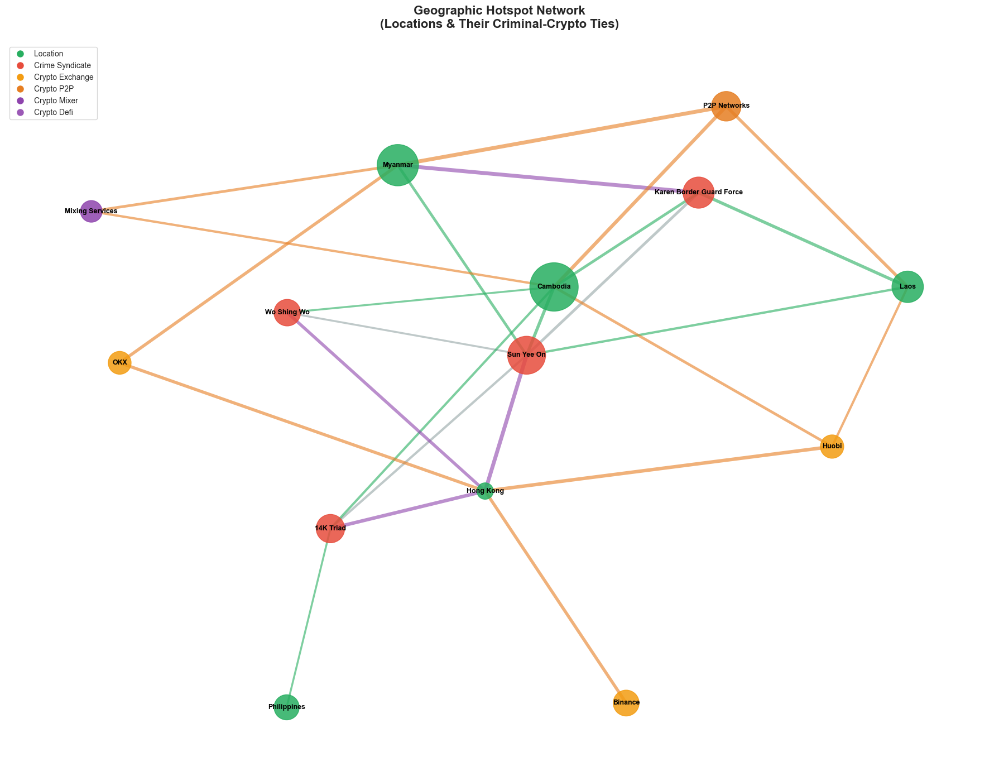

In [54]:
# Cell 8: Geographic Hotspot Network
# --------------------------------------------------------------
# print("\n🗺️ Creating Geographic Hotspot Network...")

# Focus on locations and their connections to crime syndicates and crypto
location_edges = [(u, v) for u, v, d in G_master.edges(data=True)
                  if G_master.nodes[u].get('type') == 'location' or G_master.nodes[v].get('type') == 'location']

location_nodes = set()
for u, v in location_edges:
    location_nodes.add(u)
    location_nodes.add(v)

G_geo = G_master.subgraph(location_nodes).copy()

# Layout
pos_geo = nx.spring_layout(G_geo, k=2, iterations=50, seed=42)

# Node colors & sizes
node_colors_geo = []
node_sizes_geo = []

for node in G_geo.nodes():
    data = G_geo.nodes[node]
    ntype = data.get('type', '')
    node_colors_geo.append(color_schemes.get(ntype, '#95A5A6'))

    if ntype == 'location':
        size = data.get('workers', 10000) * 0.03 + 300
    elif ntype == 'crime_syndicate':
        size = data.get('revenue', 1) * 120 + 600
    elif ntype.startswith('crypto'):
        size = data.get('volume', 1) * 90 + 350
    else:
        size = 400

    node_sizes_geo.append(size)

# Edge attributes
edge_colors_geo = []
edge_widths_geo = []

for u, v in G_geo.edges():
    e_type = G_geo.edges[u, v].get('type', '')
    weight = G_geo.edges[u, v].get('weight', 1)

    if e_type == 'operations':
        edge_colors_geo.append('#27AE60')
    elif e_type == 'direct_conversion':
        edge_colors_geo.append('#E67E22')
    elif e_type == 'headquarters':
        edge_colors_geo.append('#8E44AD')
    else:
        edge_colors_geo.append('#95A5A6')

    edge_widths_geo.append(weight * 0.5)

# Draw network
fig, ax = plt.subplots(figsize=(18, 14))

nx.draw_networkx_nodes(G_geo, pos_geo, node_color=node_colors_geo,
                       node_size=node_sizes_geo, alpha=0.85, ax=ax)
nx.draw_networkx_edges(G_geo, pos_geo, edge_color=edge_colors_geo,
                       width=edge_widths_geo, alpha=0.6, ax=ax)
nx.draw_networkx_labels(G_geo, pos_geo, font_size=9, font_weight='bold', ax=ax)

# Legend
geo_legend = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=color_schemes[k], markersize=10,
               label=k.replace('_', ' ').title())
    for k in ['location', 'crime_syndicate', 'crypto_exchange', 'crypto_p2p', 'crypto_mixer', 'crypto_defi']
]
ax.legend(handles=geo_legend, loc='upper left', bbox_to_anchor=(0, 1))

ax.set_title('Geographic Hotspot Network\n(Locations & Their Criminal-Crypto Ties)', fontsize=16, fontweight='bold', pad=20)
ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'geographic_hotspot_network.png', bbox_inches='tight', dpi=300)
plt.show()


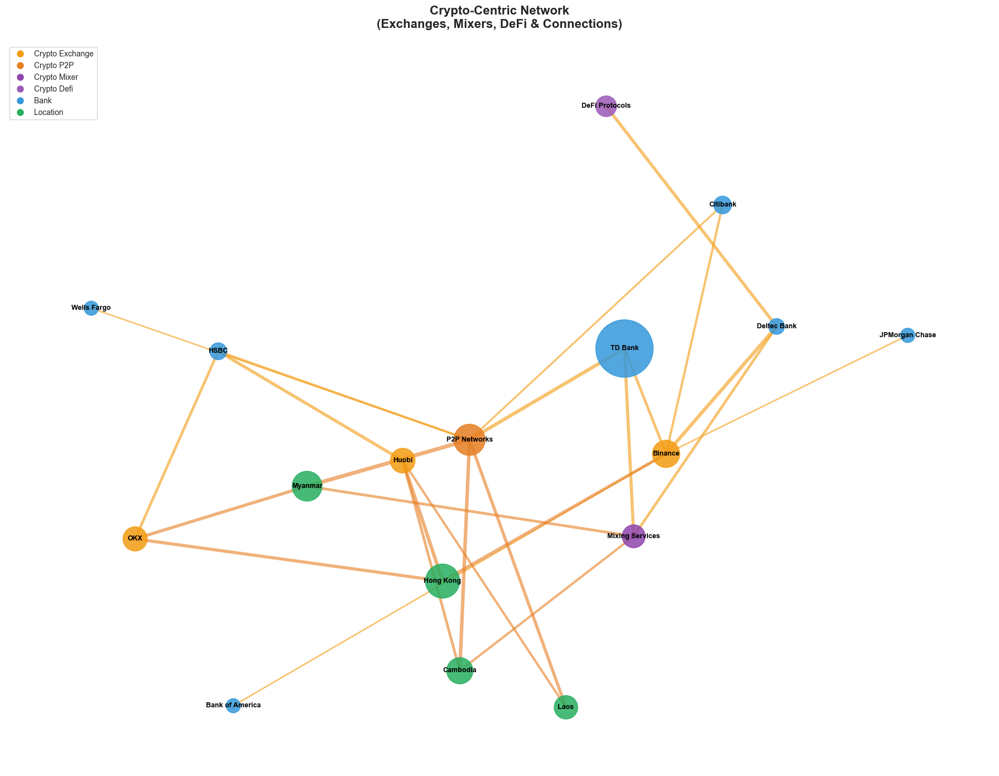

In [55]:
# Cell 9: Crypto-Centric Network
# --------------------------------------------------------------
#print("\n💱 Creating Crypto-Centric Network...")

# Focus on crypto-related nodes and their direct banking/geographic partners
crypto_nodes = [n for n, d in G_master.nodes(data=True) if d.get('type', '').startswith('crypto')]
crypto_neighbors = set()
for node in crypto_nodes:
    crypto_neighbors.update(G_master.neighbors(node))

G_crypto = G_master.subgraph(crypto_nodes + list(crypto_neighbors)).copy()

# Layout
pos_crypto = nx.spring_layout(G_crypto, k=2.5, iterations=60, seed=42)

# Node colors and sizes
node_colors_crypto = []
node_sizes_crypto = []

for node in G_crypto.nodes():
    data = G_crypto.nodes[node]
    ntype = data.get('type', '')

    node_colors_crypto.append(color_schemes.get(ntype, '#95A5A6'))

    if ntype.startswith('crypto'):
        size = data.get('volume', 1) * 100 + 400
    elif ntype == 'bank':
        size = data.get('losses', 0.1) * 1500 + 300
    elif ntype == 'location':
        size = data.get('revenue', 1) * 60 + 400
    else:
        size = 500

    node_sizes_crypto.append(size)

# Edge attributes
edge_colors_crypto = []
edge_widths_crypto = []

for u, v in G_crypto.edges():
    etype = G_crypto.edges[u, v].get('type', '')
    weight = G_crypto.edges[u, v].get('weight', 1)

    if etype == 'crypto_conversion':
        edge_colors_crypto.append('#F39C12')
    elif etype == 'direct_conversion':
        edge_colors_crypto.append('#E67E22')
    else:
        edge_colors_crypto.append('#95A5A6')

    edge_widths_crypto.append(weight * 0.5)

# Draw graph
fig, ax = plt.subplots(figsize=(18, 14))

nx.draw_networkx_nodes(G_crypto, pos_crypto, node_color=node_colors_crypto,
                       node_size=node_sizes_crypto, alpha=0.85, ax=ax)
nx.draw_networkx_edges(G_crypto, pos_crypto, edge_color=edge_colors_crypto,
                       width=edge_widths_crypto, alpha=0.6, ax=ax)
nx.draw_networkx_labels(G_crypto, pos_crypto, font_size=9, font_weight='bold', ax=ax)

# Legend
crypto_legend = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=color_schemes[k], markersize=10,
               label=k.replace('_', ' ').title())
    for k in ['crypto_exchange', 'crypto_p2p', 'crypto_mixer', 'crypto_defi', 'bank', 'location']
]
ax.legend(handles=crypto_legend, loc='upper left', bbox_to_anchor=(0, 1))

ax.set_title('Crypto-Centric Network\n(Exchanges, Mixers, DeFi & Connections)', fontsize=16, fontweight='bold', pad=20)
ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'crypto_network_focus.png', bbox_inches='tight', dpi=300)
plt.show()


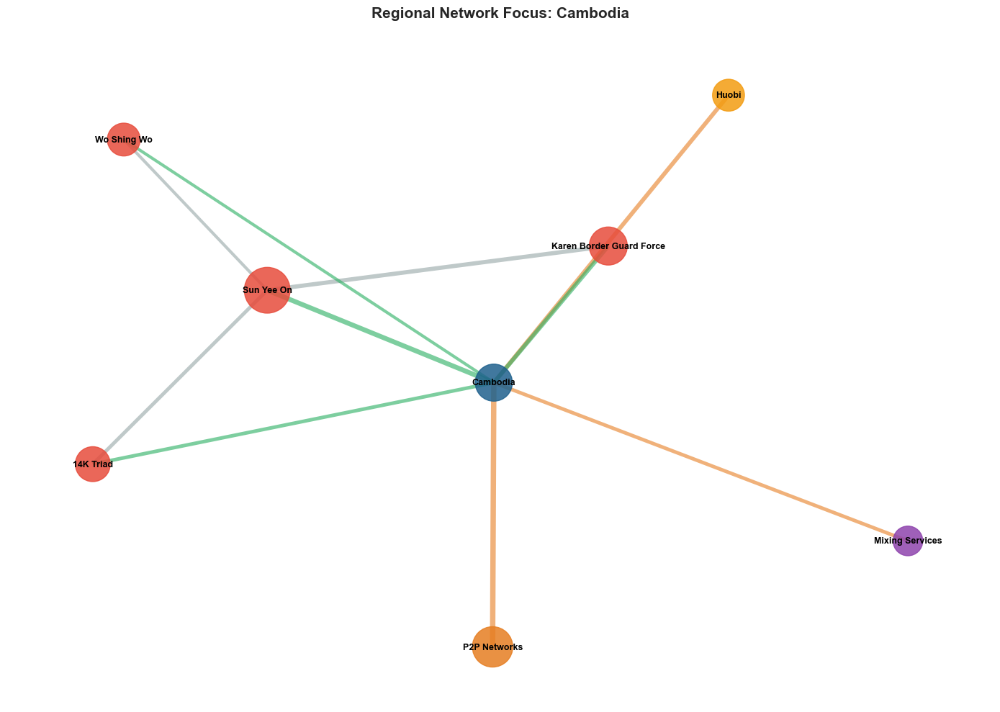

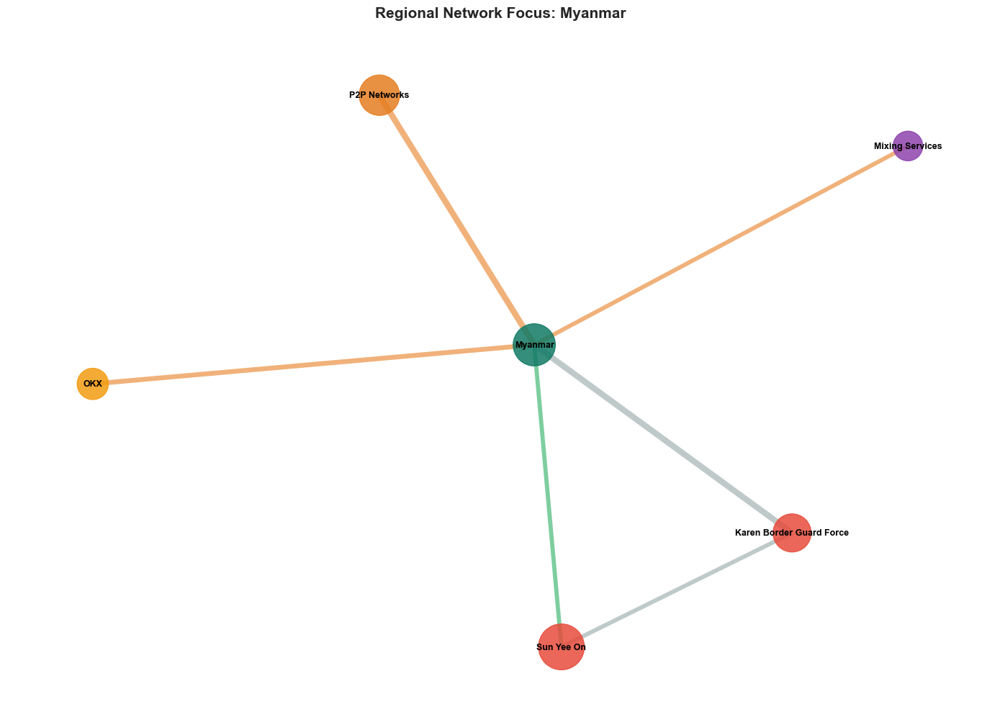

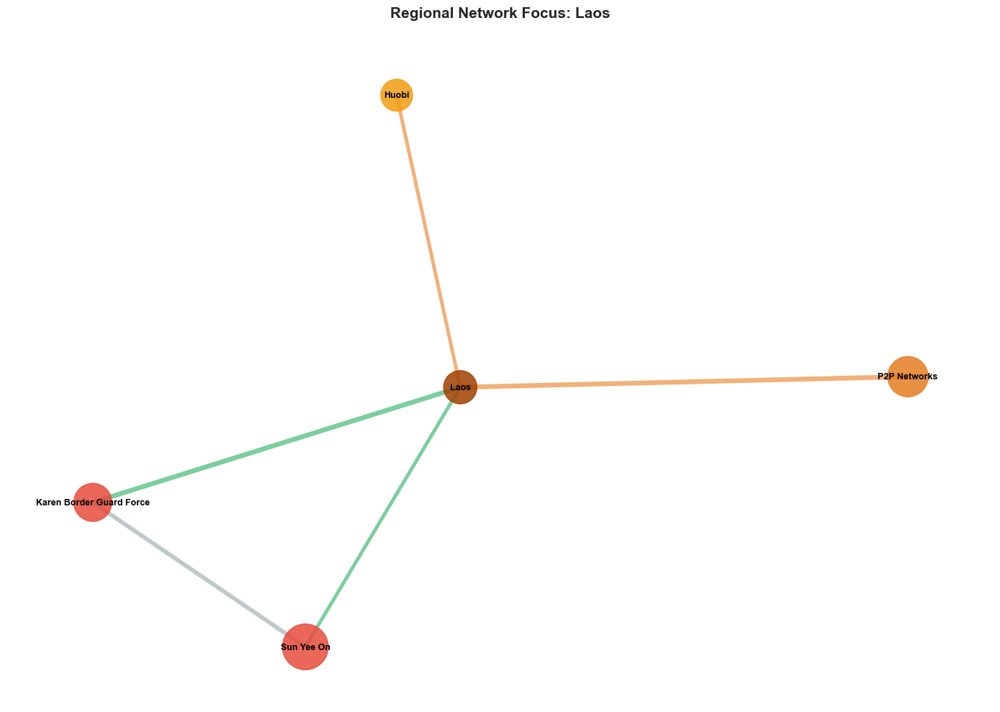

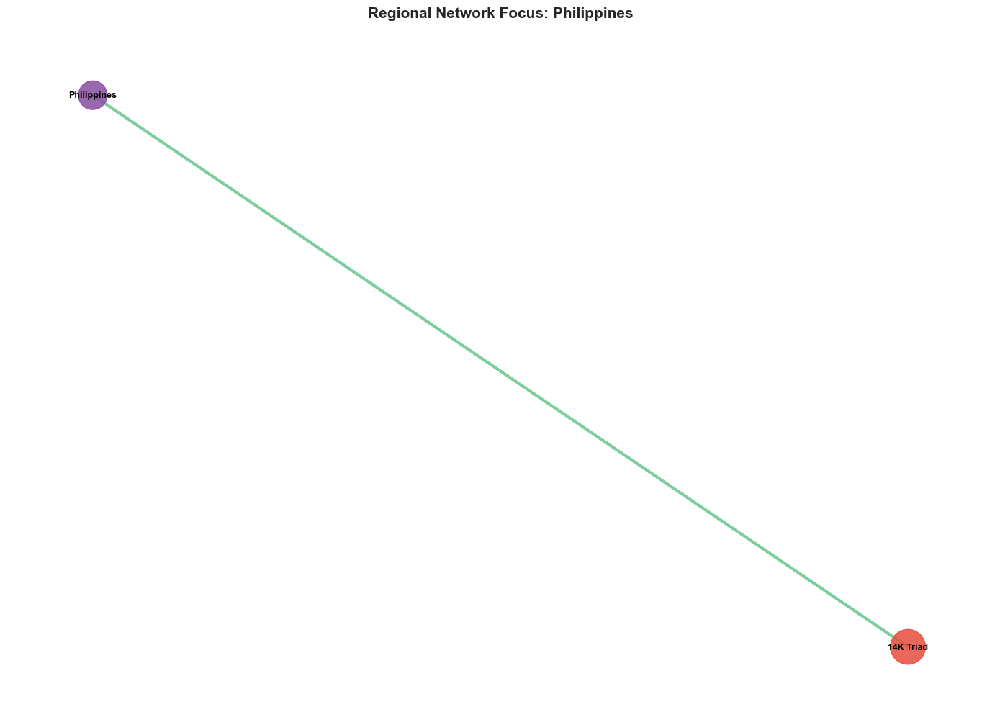

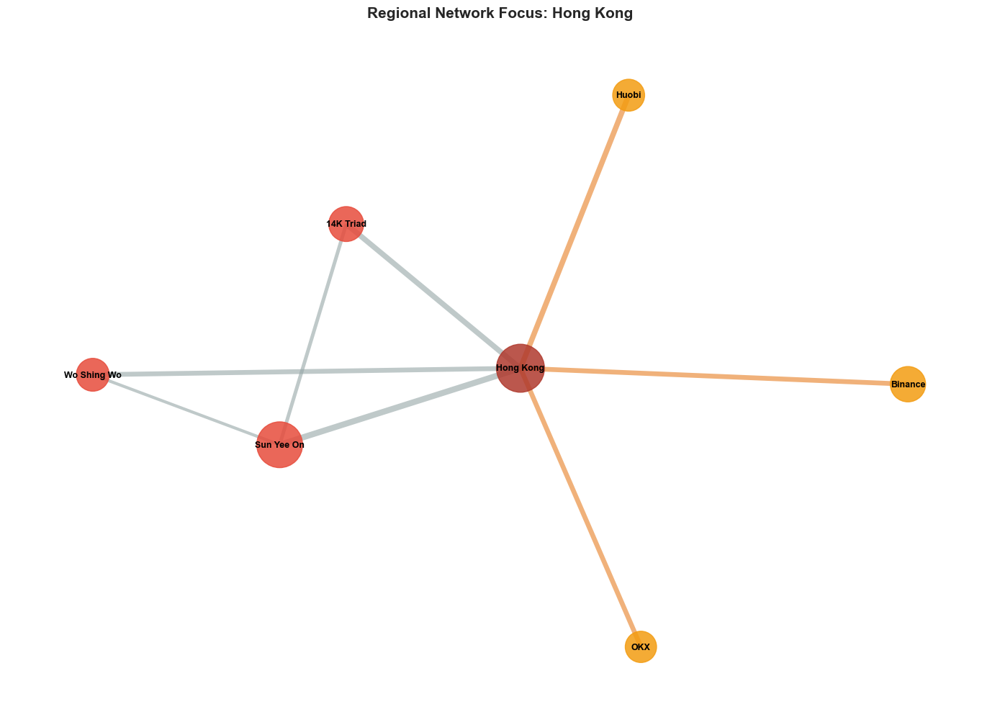

In [56]:
# Cell 10: Regional Segmentation
# --------------------------------------------------------------
#print("\n🌏 Creating Regionalized Network Views...")

regions = {
    'Cambodia': '#1F618D',
    'Myanmar': '#117A65',
    'Laos': '#A04000',
    'Philippines': '#884EA0',
    'Hong Kong': '#B03A2E'
}

for region, color in regions.items():
    #print(f"🔍 Generating view for {region}...")

    # Focused subgraph on region and its connected entities
    region_neighbors = list(G_master.neighbors(region))
    region_graph = G_master.subgraph([region] + region_neighbors).copy()

    pos_region = nx.spring_layout(region_graph, k=1.8, iterations=40, seed=42)

    node_colors_region = []
    node_sizes_region = []

    for node in region_graph.nodes():
        ntype = region_graph.nodes[node].get('type', '')
        if node == region:
            node_colors_region.append(color)
        else:
            node_colors_region.append(color_schemes.get(ntype, '#95A5A6'))

        if ntype == 'location':
            size = region_graph.nodes[node].get('revenue', 1) * 70 + 500
        elif ntype == 'crime_syndicate':
            size = region_graph.nodes[node].get('revenue', 1) * 100 + 600
        elif ntype == 'bank':
            size = region_graph.nodes[node].get('losses', 0.1) * 1000 + 300
        else:  # crypto
            size = region_graph.nodes[node].get('volume', 1) * 100 + 400

        node_sizes_region.append(size)

    edge_colors_region = []
    edge_widths_region = []

    for u, v in region_graph.edges():
        etype = region_graph.edges[u, v].get('type', '')
        weight = region_graph.edges[u, v].get('weight', 1)

        if etype == 'operations':
            edge_colors_region.append('#27AE60')
        elif etype == 'direct_conversion':
            edge_colors_region.append('#E67E22')
        else:
            edge_colors_region.append('#95A5A6')

        edge_widths_region.append(weight * 0.6)

    # Draw plot
    fig, ax = plt.subplots(figsize=(14, 10))

    nx.draw_networkx_nodes(region_graph, pos_region, node_color=node_colors_region,
                           node_size=node_sizes_region, alpha=0.85, ax=ax)
    nx.draw_networkx_edges(region_graph, pos_region, edge_color=edge_colors_region,
                           width=edge_widths_region, alpha=0.6, ax=ax)
    nx.draw_networkx_labels(region_graph, pos_region, font_size=9, font_weight='bold', ax=ax)

    ax.set_title(f'Regional Network Focus: {region}', fontsize=15, fontweight='bold', pad=20)
    ax.axis('off')

    plt.tight_layout()
    plt.savefig(output_dir / f'{region.lower()}_regional_network.png', bbox_inches='tight', dpi=300)
    plt.show()


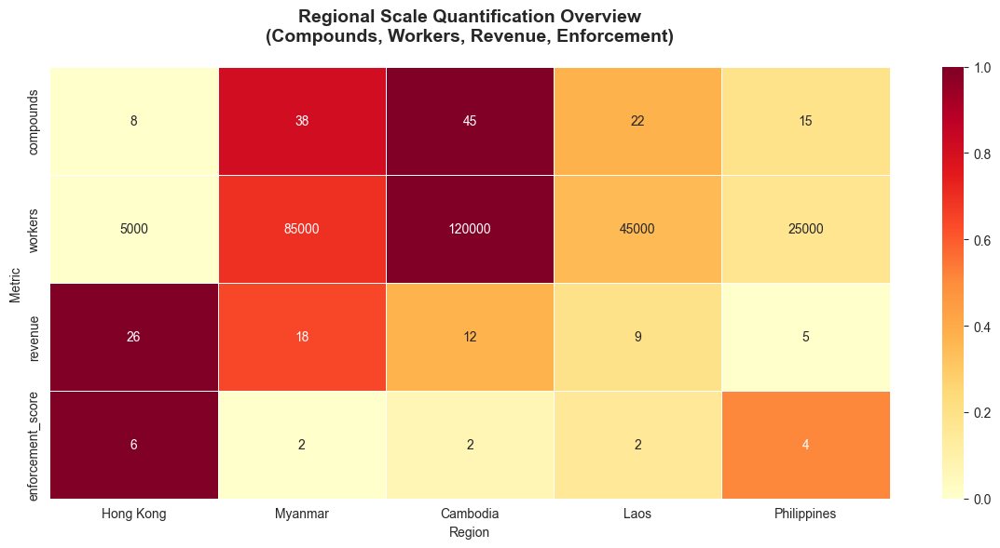

In [57]:
# Cell 11: Scale Quantification Executive Dashboard
# --------------------------------------------------------------
# print("\n📊 Generating Executive Scale Quantification Dashboard...")

# Extract relevant regional data
regional_df = pd.DataFrame.from_dict(network_entities['locations'], orient='index')
regional_df = regional_df[['compounds', 'workers', 'revenue', 'enforcement_score']]
regional_df = regional_df.sort_values(by='revenue', ascending=False)

# Normalize values for heatmap coloring
normalized = regional_df.copy()
for col in ['compounds', 'workers', 'revenue', 'enforcement_score']:
    normalized[col] = (regional_df[col] - regional_df[col].min()) / (regional_df[col].max() - regional_df[col].min())

fig, ax = plt.subplots(figsize=(12, 6))

sns.heatmap(normalized.T, cmap='YlOrRd', cbar=True, linewidths=0.5, annot=regional_df.T, fmt=".0f",
            annot_kws={"size": 10}, ax=ax)

ax.set_title('Regional Scale Quantification Overview\n(Compounds, Workers, Revenue, Enforcement)', 
             fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Region')
ax.set_ylabel('Metric')

plt.tight_layout()
plt.savefig(output_dir / 'scale_quantification_executive_dashboard.png', bbox_inches='tight', dpi=300)
plt.show()


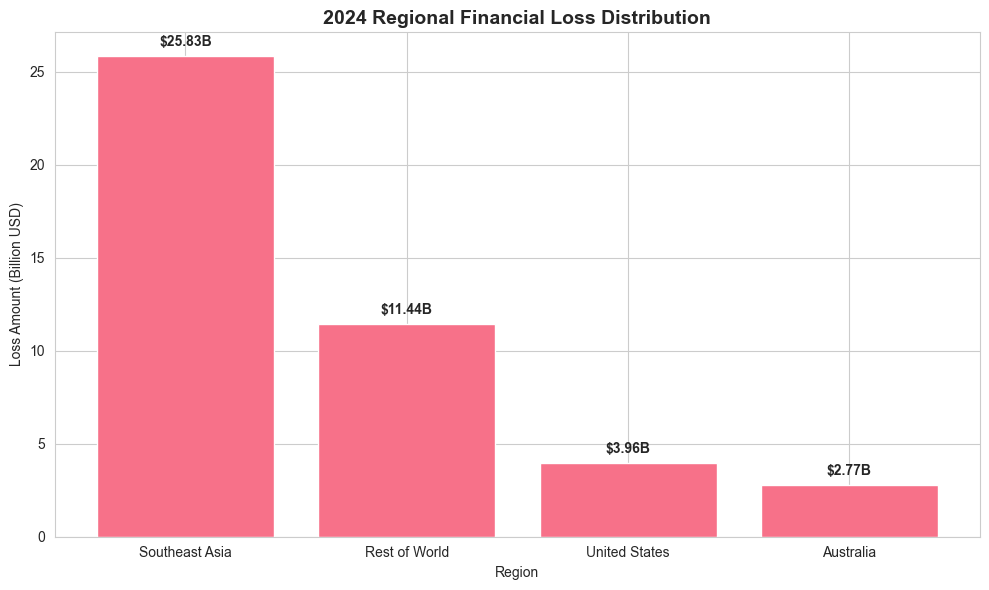

In [58]:
# Cell 12: Regional Loss Distribution Analysis
# --------------------------------------------------------------
#print("\n💸 Creating Regional Financial Loss Distribution Visualization...")

# Define regional loss estimates (in billions)
regional_losses = {
    'Southeast Asia': 44.0 * 0.587,  # 58.7% of 2024 global losses
    'United States': 3.96,
    'Australia': 2.77,
    'Rest of World': 44.0 - (44.0 * 0.587 + 3.96 + 2.77)
}

loss_df = pd.DataFrame(list(regional_losses.items()), columns=['Region', '2024_Loss_Billion'])
loss_df = loss_df.sort_values(by='2024_Loss_Billion', ascending=False)

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(loss_df['Region'], loss_df['2024_Loss_Billion'])

# Add annotations
for bar in bars:
    height = bar.get_height()
    ax.annotate(f"${height:.2f}B",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_title("2024 Regional Financial Loss Distribution", fontsize=14, fontweight='bold')
ax.set_ylabel("Loss Amount (Billion USD)")
ax.set_xlabel("Region")

plt.tight_layout()
plt.savefig(output_dir / 'regional_loss_distribution_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


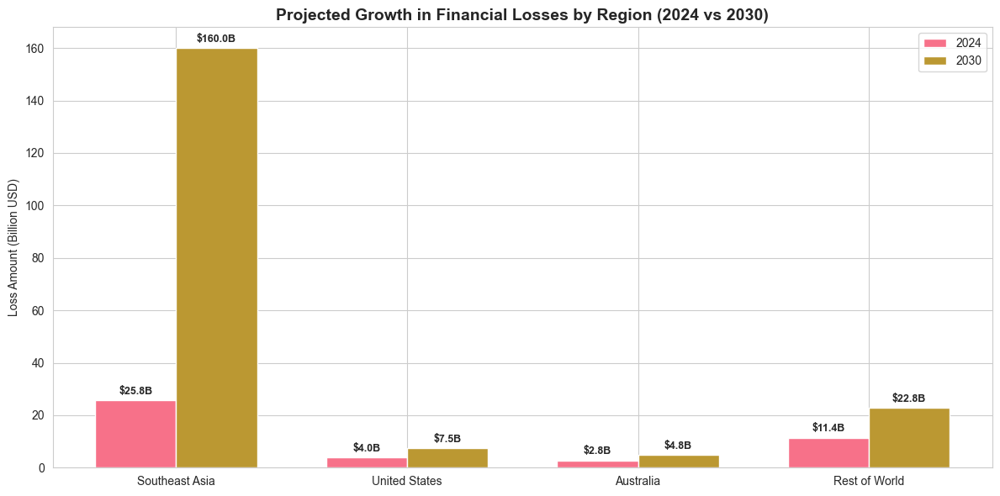

In [59]:
# Cell 13: Growth Projections Analysis
# --------------------------------------------------------------
# print("\n📈 Creating Growth Projections Visualization...")

# Define projected 2030 losses (in billions)
projected_losses_2030 = {
    'Southeast Asia': 195.1 * 0.82,  # 82% of projected 2030 losses
    'United States': 7.54,
    'Australia': 4.8,
    'Rest of World': 195.1 - (195.1 * 0.82 + 7.54 + 4.8)
}

# Combine into DataFrame
growth_df = pd.DataFrame({
    'Region': list(regional_losses.keys()),
    '2024_Loss_Billion': [regional_losses[r] for r in regional_losses],
    '2030_Loss_Billion': [projected_losses_2030[r] for r in projected_losses_2030]
})

# Plot grouped bar chart
fig, ax = plt.subplots(figsize=(12, 6))
x = np.arange(len(growth_df['Region']))
width = 0.35

bars1 = ax.bar(x - width/2, growth_df['2024_Loss_Billion'], width, label='2024')
bars2 = ax.bar(x + width/2, growth_df['2030_Loss_Billion'], width, label='2030')

# Add labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f"${height:.1f}B",
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_title("Projected Growth in Financial Losses by Region (2024 vs 2030)", fontsize=14, fontweight='bold')
ax.set_ylabel("Loss Amount (Billion USD)")
ax.set_xticks(x)
ax.set_xticklabels(growth_df['Region'])
ax.legend()

plt.tight_layout()
plt.savefig(output_dir / 'growth_projections_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


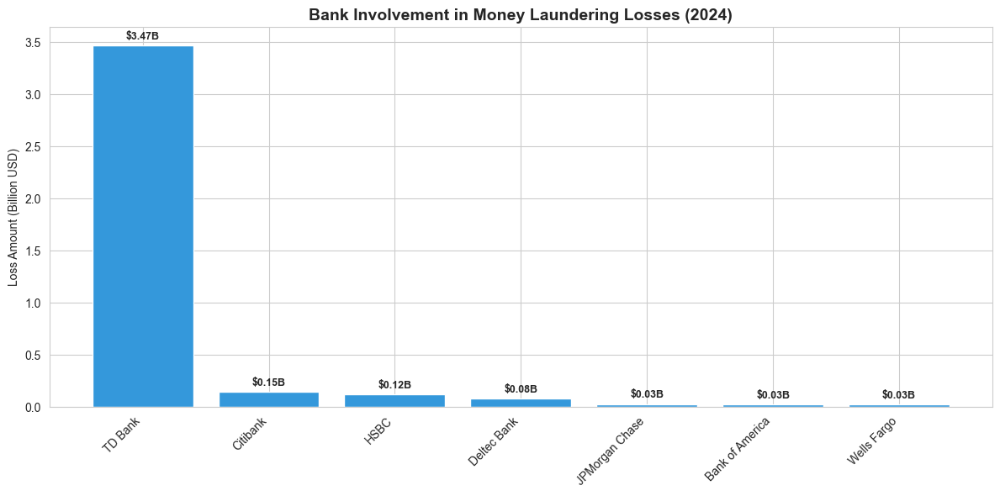

In [60]:
# Cell 14: Banking Involvement Visualization
# ----------------------------------------------------------------------
#print("\n🏦 Creating Banking Involvement Visualization...")

# Extract bank losses
bank_losses = {
    bank: data['losses']
    for bank, data in network_entities['banks'].items()
}

# Sort banks by loss descending
sorted_bank_losses = dict(sorted(bank_losses.items(), key=lambda item: item[1], reverse=True))

# Plot bar chart
fig, ax = plt.subplots(figsize=(12, 6))

bars = ax.bar(sorted_bank_losses.keys(), sorted_bank_losses.values(), color='#3498DB')

# Add labels
for bar in bars:
    height = bar.get_height()
    ax.annotate(f"${height:.2f}B",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_title("Bank Involvement in Money Laundering Losses (2024)", fontsize=14, fontweight='bold')
ax.set_ylabel("Loss Amount (Billion USD)")
ax.set_xticklabels(sorted_bank_losses.keys(), rotation=45, ha='right')

plt.tight_layout()
plt.savefig(output_dir / 'bank_involvement_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


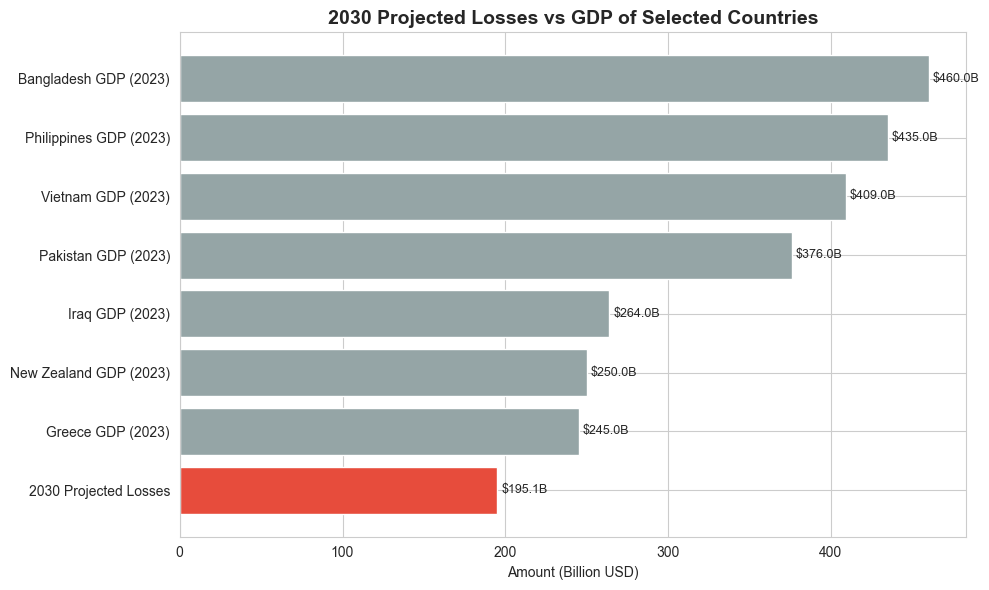

In [61]:
# Cell 15: Comparative Magnitude Visualization
# ----------------------------------------------------------------------
#print("\n🌍 Creating Comparative Magnitude Visualization...")

# Comparative data: 2030 projected crime losses vs selected GDPs (in $B)
comparative_data = {
    '2030 Projected Losses': 195.1,
    'Vietnam GDP (2023)': 409.0,
    'Philippines GDP (2023)': 435.0,
    'Bangladesh GDP (2023)': 460.0,
    'Pakistan GDP (2023)': 376.0,
    'New Zealand GDP (2023)': 250.0,
    'Greece GDP (2023)': 245.0,
    'Iraq GDP (2023)': 264.0
}

# Sort by value descending
sorted_comparative = dict(sorted(comparative_data.items(), key=lambda x: x[1], reverse=True))

# Colors to highlight the projected losses bar
colors = ['#95A5A6' if k != '2030 Projected Losses' else '#E74C3C' for k in sorted_comparative.keys()]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(list(sorted_comparative.keys()), list(sorted_comparative.values()), color=colors)

# Add value labels
for bar in bars:
    width = bar.get_width()
    ax.annotate(f"${width:.1f}B", xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(3, 0), textcoords='offset points',
                ha='left', va='center', fontsize=9)

ax.set_title("2030 Projected Losses vs GDP of Selected Countries", fontsize=14, fontweight='bold')
ax.set_xlabel("Amount (Billion USD)")
ax.invert_yaxis()

plt.tight_layout()
plt.savefig(output_dir / 'loss_magnitude_comparisons.png', bbox_inches='tight', dpi=300)
plt.show()


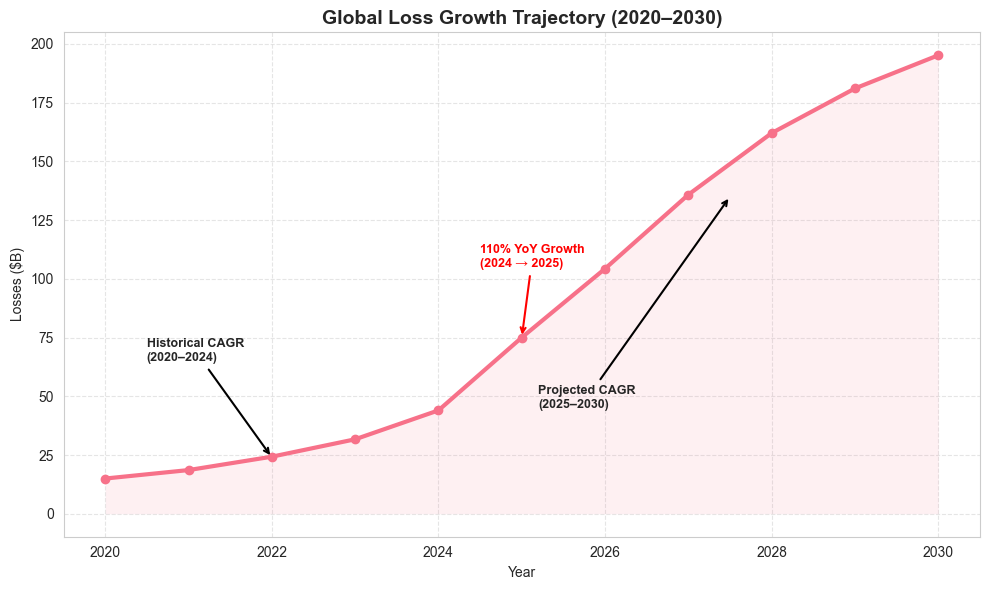

In [62]:
# Cell 16: Fixed Growth Trajectory Visualization
# ----------------------------------------------------------------------
#print("\n📈 Creating Fixed Growth Trajectory Visualization...")

# Updated time series data (2020–2030)
years = np.arange(2020, 2031)
values = [15.0, 18.6, 24.3, 31.7, 44.0, 75.0, 104.3, 135.8, 162.0, 181.0, 195.1]

# Calculate YoY growth for annotation
yoy_growth = [None] + [((v2 - v1) / v1 * 100) for v1, v2 in zip(values[:-1], values[1:])]

# Plot setup
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(years, values, marker='o', linewidth=3)
ax.fill_between(years, values, alpha=0.1)

# Annotate CAGR periods
ax.annotate('Historical CAGR\n(2020–2024)',
            xy=(2022, 24), xytext=(2020.5, 65),
            arrowprops=dict(arrowstyle='->', lw=1.5, color='black'),
            fontsize=9, fontweight='bold', ha='left')

ax.annotate('Projected CAGR\n(2025–2030)',
            xy=(2027.5, 135), xytext=(2025.2, 45),
            arrowprops=dict(arrowstyle='->', lw=1.5, color='black'),
            fontsize=9, fontweight='bold', ha='left')

# Highlight peak YoY growth
peak_idx = np.argmax([g for g in yoy_growth if g is not None]) + 1
ax.annotate(f'110% YoY Growth\n({years[peak_idx-1]} → {years[peak_idx]})',
            xy=(years[peak_idx], values[peak_idx]),
            xytext=(years[peak_idx]-0.5, values[peak_idx]+30),
            arrowprops=dict(arrowstyle='->', lw=1.5, color='red'),
            fontsize=9, fontweight='bold', color='red')

# Labels and formatting
ax.set_title("Global Loss Growth Trajectory (2020–2030)", fontsize=14, fontweight='bold')
ax.set_ylabel("Losses ($B)")
ax.set_xlabel("Year")
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig(output_dir / 'fixed_growth_trajectory_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


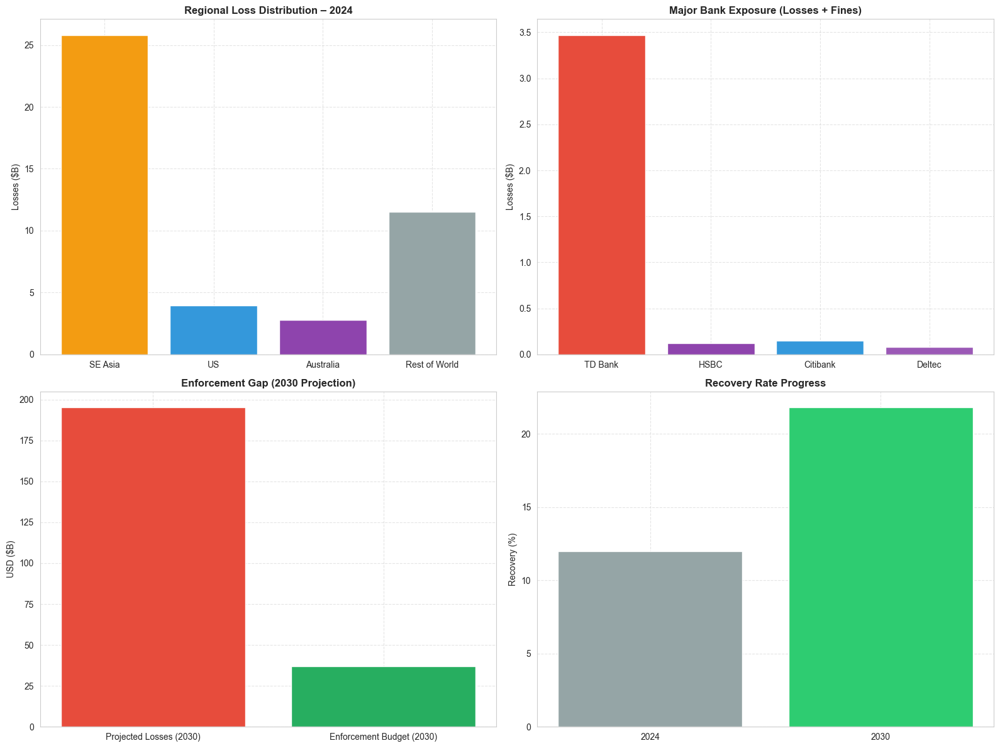

In [63]:
# Cell 17: Executive Dashboard Visualization
# ----------------------------------------------------------------------
# print("\n📊 Creating Scale Quantification Executive Dashboard...")

fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# 1. Regional Loss Distribution (2024)
regions = ['SE Asia', 'US', 'Australia', 'Rest of World']
regional_values = [25.8, 3.96, 2.77, 11.5]
axs[0, 0].bar(regions, regional_values, color=['#F39C12', '#3498DB', '#8E44AD', '#95A5A6'])
axs[0, 0].set_title("Regional Loss Distribution – 2024", fontsize=12, fontweight='bold')
axs[0, 0].set_ylabel("Losses ($B)")
axs[0, 0].grid(True, linestyle='--', alpha=0.5)

# 2. Bank Impact Comparison
banks = ['TD Bank', 'HSBC', 'Citibank', 'Deltec']
bank_losses = [3.47, 0.12, 0.15, 0.08]
axs[0, 1].bar(banks, bank_losses, color=['#E74C3C', '#8E44AD', '#3498DB', '#9B59B6'])
axs[0, 1].set_title("Major Bank Exposure (Losses + Fines)", fontsize=12, fontweight='bold')
axs[0, 1].set_ylabel("Losses ($B)")
axs[0, 1].grid(True, linestyle='--', alpha=0.5)

# 3. Enforcement Budget vs. Losses (2030)
categories = ['Projected Losses (2030)', 'Enforcement Budget (2030)']
values = [195.1, 36.8]
axs[1, 0].bar(categories, values, color=['#E74C3C', '#27AE60'])
axs[1, 0].set_title("Enforcement Gap (2030 Projection)", fontsize=12, fontweight='bold')
axs[1, 0].set_ylabel("USD ($B)")
axs[1, 0].grid(True, linestyle='--', alpha=0.5)

# 4. Recovery Rate Improvement
years = ['2024', '2030']
recovery_rates = [12, 21.8]
axs[1, 1].bar(years, recovery_rates, color=['#95A5A6', '#2ECC71'])
axs[1, 1].set_title("Recovery Rate Progress", fontsize=12, fontweight='bold')
axs[1, 1].set_ylabel("Recovery (%)")
axs[1, 1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig(output_dir / 'scale_quantification_executive_dashboard.png', bbox_inches='tight', dpi=300)
plt.show()


In [64]:
# Cell 1
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Configure visualization settings
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

# Ensure output directory exists
output_dir = Path(r"C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering")
output_dir.mkdir(exist_ok=True)

#print("🕸️ COMPLETING COMPREHENSIVE NETWORK VISUALIZATIONS")
# print("=" * 70)


In [65]:
# Cell 2
# Continue from previous network setup - recreate essential data structures
network_entities = {
    'crime_syndicates': {
        'Sun Yee On': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 15.0, 'risk_level': 10},
        'Karen Border Guard Force': {'type': 'crime_syndicate', 'origin': 'Myanmar', 'revenue': 8.5, 'risk_level': 9},
        '14K Triad': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 6.2, 'risk_level': 8},
        'Wo Shing Wo': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 4.8, 'risk_level': 7}
    },
    'banks': {
        'TD Bank': {'type': 'bank', 'country': 'Canada/US', 'losses': 3.47, 'risk_score': 9.8, 'aml_violations': 15},
        'JPMorgan Chase': {'type': 'bank', 'country': 'US', 'losses': 0.03, 'risk_score': 3.2, 'aml_violations': 2},
        'Bank of America': {'type': 'bank', 'country': 'US', 'losses': 0.025, 'risk_score': 3.1, 'aml_violations': 1},
        'Wells Fargo': {'type': 'bank', 'country': 'US', 'losses': 0.025, 'risk_score': 3.0, 'aml_violations': 2},
        'Citibank': {'type': 'bank', 'country': 'US', 'losses': 0.15, 'risk_score': 4.5, 'aml_violations': 3},
        'HSBC': {'type': 'bank', 'country': 'UK', 'losses': 0.12, 'risk_score': 4.8, 'aml_violations': 4},
        'Deltec Bank': {'type': 'bank', 'country': 'Bahamas', 'losses': 0.08, 'risk_score': 6.2, 'aml_violations': 5}
    },
    'locations': {
        'Cambodia': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 45, 'workers': 120000, 'revenue': 12.5},
        'Myanmar': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 38, 'workers': 85000, 'revenue': 18.2},
        'Laos': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 22, 'workers': 45000, 'revenue': 8.7},
        'Philippines': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 15, 'workers': 25000, 'revenue': 4.6},
        'Hong Kong': {'type': 'location', 'region': 'East Asia', 'compounds': 8, 'workers': 5000, 'revenue': 25.8}
    },
    'crypto': {
        'Binance': {'type': 'crypto_exchange', 'volume': 8.5, 'regulation_level': 'medium', 'kyc_strength': 6.0},
        'Huobi': {'type': 'crypto_exchange', 'volume': 6.2, 'regulation_level': 'low', 'kyc_strength': 4.5},
        'OKX': {'type': 'crypto_exchange', 'volume': 5.8, 'regulation_level': 'low', 'kyc_strength': 4.2},
        'P2P Networks': {'type': 'crypto_p2p', 'volume': 12.3, 'regulation_level': 'none', 'kyc_strength': 1.0},
        'Mixing Services': {'type': 'crypto_mixer', 'volume': 4.8, 'regulation_level': 'none', 'kyc_strength': 0.0},
        'DeFi Protocols': {'type': 'crypto_defi', 'volume': 3.2, 'regulation_level': 'none', 'kyc_strength': 0.0}
    }
}


In [66]:
# Cell 3
# Color schemes for different entity types
color_schemes = {
    'crime_syndicate': '#E74C3C',
    'bank': '#3498DB',
    'location': '#27AE60',
    'crypto_exchange': '#F39C12',
    'crypto_p2p': '#E67E22',
    'crypto_mixer': '#8E44AD',
    'crypto_defi': '#9B59B6'
}


In [67]:
# Cell 4
# Create master network graph and populate nodes/edges
G_master = nx.Graph()
all_entities = {}
for category, entities in network_entities.items():
    all_entities.update(entities)

for entity_name, attributes in all_entities.items():
    G_master.add_node(entity_name, **attributes)

# Add relationships
network_relationships = [
    # Crime Syndicate to Location relationships
    ('Sun Yee On', 'Hong Kong', {'weight': 10, 'type': 'headquarters'}),
    ('Sun Yee On', 'Cambodia', {'weight': 8, 'type': 'operations'}),
    ('Sun Yee On', 'Myanmar', {'weight': 7, 'type': 'operations'}),
    ('Karen Border Guard Force', 'Myanmar', {'weight': 10, 'type': 'headquarters'}),
    ('Karen Border Guard Force', 'Cambodia', {'weight': 7, 'type': 'operations'}),
    ('14K Triad', 'Hong Kong', {'weight': 9, 'type': 'headquarters'}),
    ('Wo Shing Wo', 'Hong Kong', {'weight': 8, 'type': 'headquarters'}),
    
    # Crime Syndicate to Bank relationships
    ('Sun Yee On', 'HSBC', {'weight': 9, 'type': 'money_laundering'}),
    ('Sun Yee On', 'TD Bank', {'weight': 8, 'type': 'money_laundering'}),
    ('Karen Border Guard Force', 'TD Bank', {'weight': 9, 'type': 'money_laundering'}),
    ('14K Triad', 'HSBC', {'weight': 8, 'type': 'money_laundering'}),
    ('Wo Shing Wo', 'Deltec Bank', {'weight': 7, 'type': 'money_laundering'}),
    
    # Bank to Crypto relationships
    ('TD Bank', 'P2P Networks', {'weight': 9, 'type': 'crypto_conversion'}),
    ('TD Bank', 'Mixing Services', {'weight': 8, 'type': 'crypto_conversion'}),
    ('HSBC', 'Huobi', {'weight': 8, 'type': 'crypto_conversion'}),
    ('Deltec Bank', 'Binance', {'weight': 9, 'type': 'crypto_conversion'}),
    ('Deltec Bank', 'DeFi Protocols', {'weight': 8, 'type': 'crypto_conversion'}),
    
    # Location to Crypto relationships
    ('Cambodia', 'P2P Networks', {'weight': 9, 'type': 'direct_conversion'}),
    ('Myanmar', 'P2P Networks', {'weight': 10, 'type': 'direct_conversion'}),
    ('Hong Kong', 'Binance', {'weight': 8, 'type': 'direct_conversion'}),
    ('Hong Kong', 'Huobi', {'weight': 9, 'type': 'direct_conversion'})
]

G_master.add_edges_from(network_relationships)


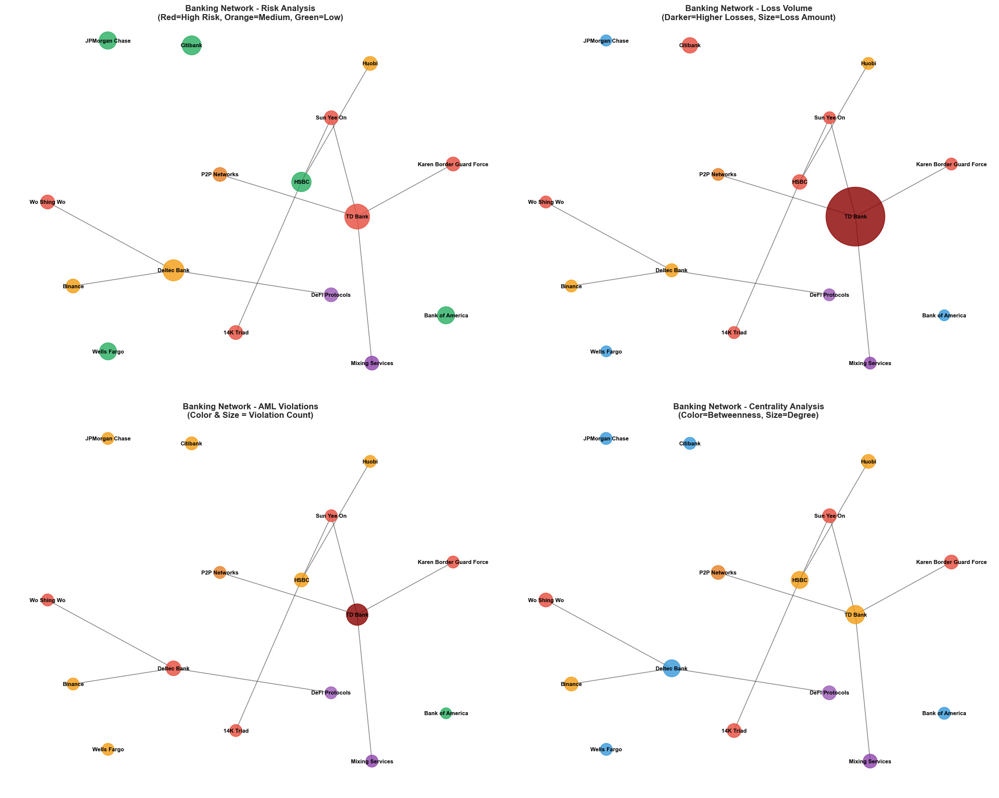

In [68]:
# Cell 5
# 5. COMPLETE BANKING NETWORK ANALYSIS
#print("\n🏦 Completing Banking Network Analysis...")

# Create banking-focused subgraph
bank_nodes = [node for node in G_master.nodes() if G_master.nodes[node].get('type') == 'bank']
bank_neighbors = set()
for bank_node in bank_nodes:
    bank_neighbors.update(G_master.neighbors(bank_node))

G_bank = G_master.subgraph(bank_nodes + list(bank_neighbors)).copy()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
pos_bank = nx.spring_layout(G_bank, k=2, iterations=50, seed=42)

# Cell 6
# 5.1 Bank Risk Network
node_colors_risk = []
node_sizes_risk = []

for node in G_bank.nodes():
    node_data = G_bank.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type == 'bank':
        risk_score = node_data.get('risk_score', 0)
        if risk_score >= 8:
            node_colors_risk.append('#E74C3C')  # High risk - Red
        elif risk_score >= 5:
            node_colors_risk.append('#F39C12')  # Medium risk - Orange
        else:
            node_colors_risk.append('#27AE60')  # Low risk - Green
        size = risk_score * 100 + 300
    else:
        node_colors_risk.append(color_schemes.get(node_type, '#95A5A6'))
        size = 400
    node_sizes_risk.append(size)

nx.draw_networkx_nodes(G_bank, pos_bank, node_color=node_colors_risk, 
                       node_size=node_sizes_risk, alpha=0.8, ax=ax1)
nx.draw_networkx_edges(G_bank, pos_bank, alpha=0.5, ax=ax1)
nx.draw_networkx_labels(G_bank, pos_bank, font_size=8, font_weight='bold', ax=ax1)

ax1.set_title('Banking Network - Risk Analysis\n(Red=High Risk, Orange=Medium, Green=Low)', 
              fontsize=12, fontweight='bold')
ax1.axis('off')

# 5.2 Money Flow Volume Network
node_colors_volume = []
node_sizes_volume = []

for node in G_bank.nodes():
    node_data = G_bank.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type == 'bank':
        losses = node_data.get('losses', 0)
        if losses >= 1.0:
            node_colors_volume.append('#8B0000')  # Dark red for highest losses
        elif losses >= 0.1:
            node_colors_volume.append('#E74C3C')  # Red
        elif losses >= 0.05:
            node_colors_volume.append('#F39C12')  # Orange
        else:
            node_colors_volume.append('#3498DB')  # Blue for lower losses
        size = losses * 2000 + 200
    else:
        node_colors_volume.append(color_schemes.get(node_type, '#95A5A6'))
        size = 300
    node_sizes_volume.append(size)

nx.draw_networkx_nodes(G_bank, pos_bank, node_color=node_colors_volume, 
                       node_size=node_sizes_volume, alpha=0.8, ax=ax2)
nx.draw_networkx_edges(G_bank, pos_bank, alpha=0.5, ax=ax2)
nx.draw_networkx_labels(G_bank, pos_bank, font_size=8, font_weight='bold', ax=ax2)

ax2.set_title('Banking Network - Loss Volume\n(Darker=Higher Losses, Size=Loss Amount)', 
              fontsize=12, fontweight='bold')
ax2.axis('off')

# 5.3 AML Violations Network
node_colors_aml = []
node_sizes_aml = []

for node in G_bank.nodes():
    node_data = G_bank.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type == 'bank':
        violations = node_data.get('aml_violations', 0)
        if violations >= 10:
            node_colors_aml.append('#8B0000')  # Dark red
        elif violations >= 5:
            node_colors_aml.append('#E74C3C')  # Red
        elif violations >= 2:
            node_colors_aml.append('#F39C12')  # Orange
        else:
            node_colors_aml.append('#27AE60')  # Green
        size = violations * 50 + 200
    else:
        node_colors_aml.append(color_schemes.get(node_type, '#95A5A6'))
        size = 300
    node_sizes_aml.append(size)

nx.draw_networkx_nodes(G_bank, pos_bank, node_color=node_colors_aml, 
                       node_size=node_sizes_aml, alpha=0.8, ax=ax3)
nx.draw_networkx_edges(G_bank, pos_bank, alpha=0.5, ax=ax3)
nx.draw_networkx_labels(G_bank, pos_bank, font_size=8, font_weight='bold', ax=ax3)

ax3.set_title('Banking Network - AML Violations\n(Color & Size = Violation Count)', 
              fontsize=12, fontweight='bold')
ax3.axis('off')

# 5.4 Bank Centrality Analysis (FIXED)
centrality = nx.degree_centrality(G_bank)
betweenness = nx.betweenness_centrality(G_bank)

node_colors_centrality = []
node_sizes_centrality = []

for node in G_bank.nodes():
    node_data = G_bank.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type == 'bank':
        betweenness_score = betweenness.get(node, 0)
        if betweenness_score >= 0.3:
            node_colors_centrality.append('#8B0000')  # Critical intermediary
        elif betweenness_score >= 0.15:
            node_colors_centrality.append('#E74C3C')  # High centrality
        elif betweenness_score >= 0.05:
            node_colors_centrality.append('#F39C12')  # Medium centrality
        else:
            node_colors_centrality.append('#3498DB')  # Low centrality
        
        degree_score = centrality.get(node, 0)
        size = degree_score * 1500 + 300
    else:
        node_colors_centrality.append(color_schemes.get(node_type, '#95A5A6'))
        size = 400
    
    node_sizes_centrality.append(size)

nx.draw_networkx_nodes(G_bank, pos_bank, node_color=node_colors_centrality, 
                       node_size=node_sizes_centrality, alpha=0.8, ax=ax4)
nx.draw_networkx_edges(G_bank, pos_bank, alpha=0.5, ax=ax4)
nx.draw_networkx_labels(G_bank, pos_bank, font_size=8, font_weight='bold', ax=ax4)

ax4.set_title('Banking Network - Centrality Analysis\n(Color=Betweenness, Size=Degree)', 
              fontsize=12, fontweight='bold')
ax4.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'banking_network_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


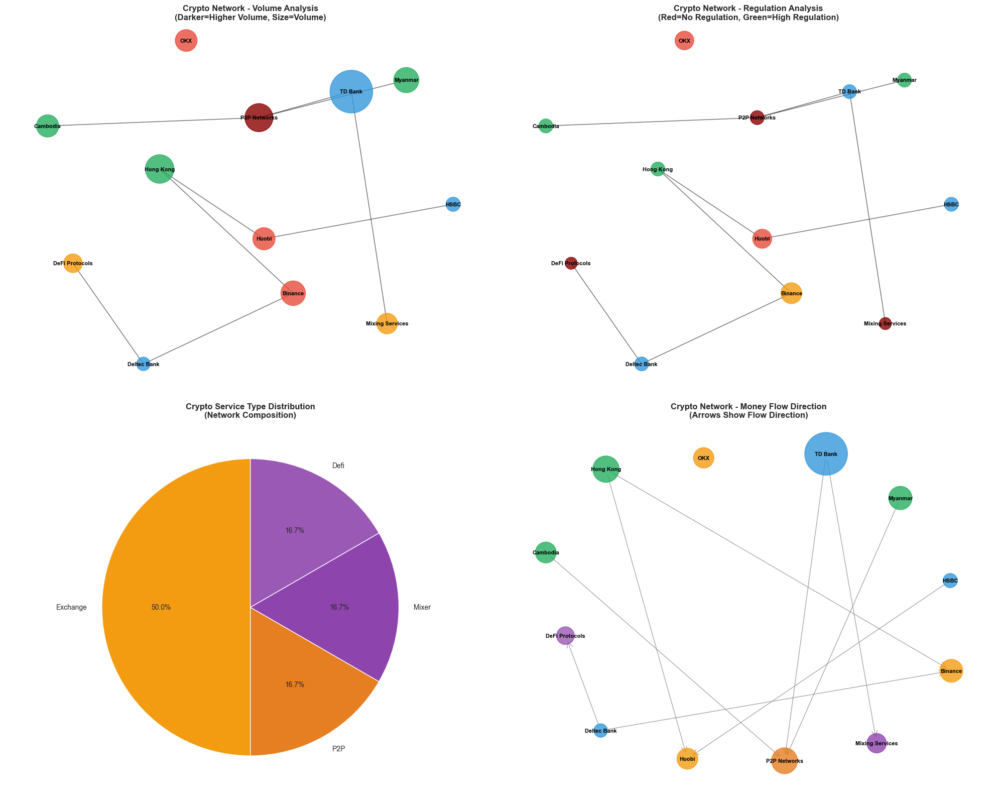

In [69]:
# Cell 7–11 Combined: Crypto Conversion Network
#print("\n₿ Creating Crypto Conversion Network...")

# Create crypto-focused subgraph
crypto_nodes = [node for node in G_master.nodes() 
                if G_master.nodes[node].get('type', '').startswith('crypto')]
crypto_neighbors = set()
for crypto_node in crypto_nodes:
    crypto_neighbors.update(G_master.neighbors(crypto_node))

G_crypto = G_master.subgraph(crypto_nodes + list(crypto_neighbors)).copy()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# 6.1 Crypto Volume Network
pos_crypto = nx.spring_layout(G_crypto, k=3, iterations=50, seed=42)

node_colors_crypto_vol = []
node_sizes_crypto_vol = []

for node in G_crypto.nodes():
    node_data = G_crypto.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type.startswith('crypto'):
        volume = node_data.get('volume', 0)
        if volume >= 10:
            node_colors_crypto_vol.append('#8B0000')
        elif volume >= 5:
            node_colors_crypto_vol.append('#E74C3C')
        elif volume >= 3:
            node_colors_crypto_vol.append('#F39C12')
        else:
            node_colors_crypto_vol.append('#F1C40F')
        size = volume * 100 + 400
    else:
        node_colors_crypto_vol.append(color_schemes.get(node_type, '#95A5A6'))
        if node_type == 'bank':
            size = node_data.get('losses', 0.1) * 1000 + 300
        elif node_type == 'location':
            size = node_data.get('revenue', 1) * 50 + 400
        else:
            size = 400
    node_sizes_crypto_vol.append(size)

nx.draw_networkx_nodes(G_crypto, pos_crypto, node_color=node_colors_crypto_vol, 
                       node_size=node_sizes_crypto_vol, alpha=0.8, ax=ax1)
nx.draw_networkx_edges(G_crypto, pos_crypto, alpha=0.6, ax=ax1)
nx.draw_networkx_labels(G_crypto, pos_crypto, font_size=8, font_weight='bold', ax=ax1)
ax1.set_title('Crypto Network - Volume Analysis\n(Darker=Higher Volume, Size=Volume)', fontsize=12, fontweight='bold')
ax1.axis('off')

# 6.2 Regulation Level Network
node_colors_regulation = []
node_sizes_regulation = []
regulation_colors = {'none': '#8B0000', 'low': '#E74C3C', 'medium': '#F39C12', 'high': '#27AE60'}

for node in G_crypto.nodes():
    node_data = G_crypto.nodes[node]
    node_type = node_data.get('type', 'unknown')
    
    if node_type.startswith('crypto'):
        reg_level = node_data.get('regulation_level', 'unknown')
        node_colors_regulation.append(regulation_colors.get(reg_level, '#95A5A6'))
        size = node_data.get('kyc_strength', 0) * 100 + 300
    else:
        node_colors_regulation.append(color_schemes.get(node_type, '#95A5A6'))
        size = 400
    node_sizes_regulation.append(size)

nx.draw_networkx_nodes(G_crypto, pos_crypto, node_color=node_colors_regulation, 
                       node_size=node_sizes_regulation, alpha=0.8, ax=ax2)
nx.draw_networkx_edges(G_crypto, pos_crypto, alpha=0.6, ax=ax2)
nx.draw_networkx_labels(G_crypto, pos_crypto, font_size=8, font_weight='bold', ax=ax2)
ax2.set_title('Crypto Network - Regulation Analysis\n(Red=No Regulation, Green=High Regulation)', fontsize=12, fontweight='bold')
ax2.axis('off')

# 6.3 Crypto Type Distribution
crypto_types = {}
for node in G_crypto.nodes():
    node_type = G_crypto.nodes[node].get('type', 'unknown')
    if node_type.startswith('crypto'):
        crypto_types[node_type] = crypto_types.get(node_type, 0) + 1

if crypto_types:
    labels = [t.replace('crypto_', '').replace('_', ' ').title() for t in crypto_types.keys()]
    sizes = list(crypto_types.values())
    colors = [color_schemes.get(t, '#95A5A6') for t in crypto_types.keys()]
    
    ax3.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
    ax3.set_title('Crypto Service Type Distribution\n(Network Composition)', fontsize=12, fontweight='bold')

# 6.4 Money Flow Paths (Crypto-centric)
G_crypto_directed = nx.DiGraph()
for node in G_crypto.nodes():
    G_crypto_directed.add_node(node, **G_crypto.nodes[node])

flow_edges = []
for node in G_crypto.nodes():
    node_type = G_crypto.nodes[node].get('type', 'unknown')
    neighbors = list(G_crypto.neighbors(node))
    if node_type in ['bank', 'location']:
        for crypto_neighbor in [n for n in neighbors if G_crypto.nodes[n].get('type', '').startswith('crypto')]:
            flow_edges.append((node, crypto_neighbor))

G_crypto_directed.add_edges_from(flow_edges)

pos_flow = nx.spring_layout(G_crypto_directed, k=2.5, iterations=50, seed=42)

node_colors_flow = []
node_sizes_flow = []

for node in G_crypto_directed.nodes():
    node_data = G_crypto_directed.nodes[node]
    node_type = node_data.get('type', 'unknown')
    node_colors_flow.append(color_schemes.get(node_type, '#95A5A6'))
    if node_type.startswith('crypto'):
        size = node_data.get('volume', 1) * 80 + 400
    elif node_type == 'bank':
        size = node_data.get('losses', 0.1) * 1000 + 300
    elif node_type == 'location':
        size = node_data.get('revenue', 1) * 40 + 400
    else:
        size = 400
    node_sizes_flow.append(size)

nx.draw_networkx_nodes(G_crypto_directed, pos_flow, node_color=node_colors_flow, 
                       node_size=node_sizes_flow, alpha=0.8, ax=ax4)
nx.draw_networkx_edges(G_crypto_directed, pos_flow, alpha=0.7, 
                       arrowsize=20, arrowstyle='->', edge_color='gray', ax=ax4)
nx.draw_networkx_labels(G_crypto_directed, pos_flow, font_size=8, font_weight='bold', ax=ax4)
ax4.set_title('Crypto Network - Money Flow Direction\n(Arrows Show Flow Direction)', fontsize=12, fontweight='bold')
ax4.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'crypto_conversion_network.png', bbox_inches='tight', dpi=300)
plt.show()


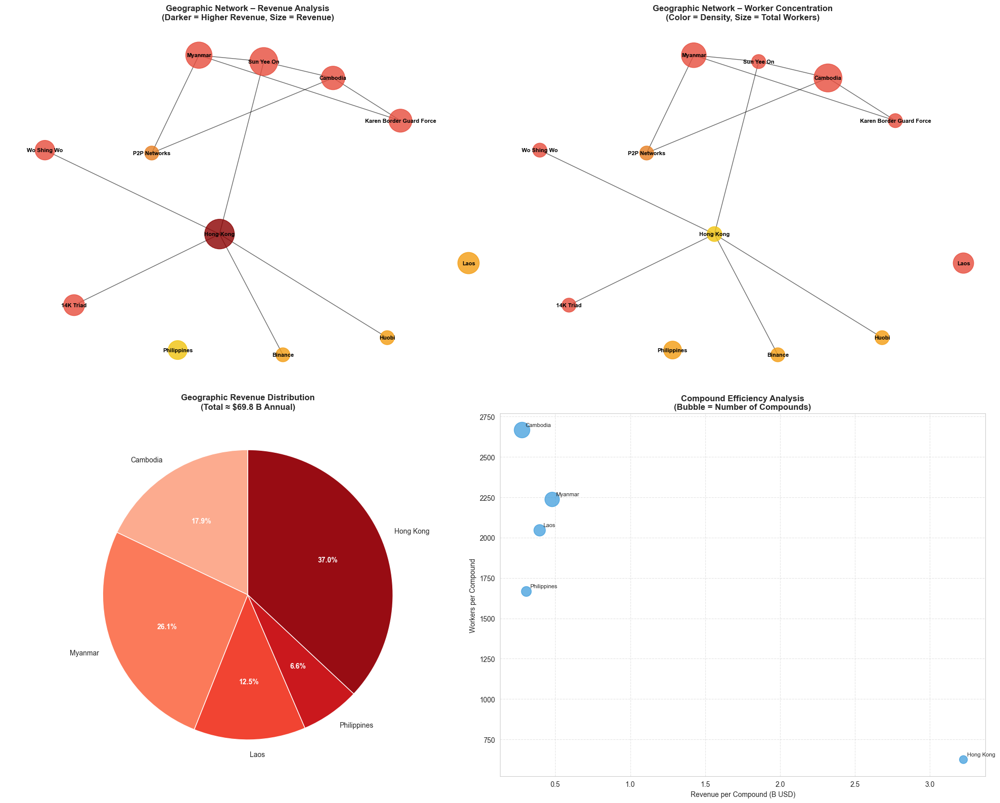

In [70]:
# Section 7 (Cells 12-15 combined): Geographic Distribution Network
#print("\n🌏 Creating Geographic Distribution Network...")

# ─── 7.0 Build location-focused subgraph ────────────────────────────────────────
location_nodes = [n for n in G_master.nodes() if G_master.nodes[n].get('type') == 'location']
location_neighbors = set()
for loc in location_nodes:
    location_neighbors.update(G_master.neighbors(loc))

G_geo = G_master.subgraph(location_nodes + list(location_neighbors)).copy()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
pos_geo = nx.spring_layout(G_geo, k=3, iterations=50, seed=42)

# ─── 7.1 Geographic Revenue Network ────────────────────────────────────────────
node_colors_geo_rev, node_sizes_geo_rev = [], []

for node in G_geo.nodes():
    data = G_geo.nodes[node]
    ntype = data.get('type', 'unknown')
    
    if ntype == 'location':
        revenue = data.get('revenue', 0)
        # Color by revenue
        if revenue >= 20:
            node_colors_geo_rev.append('#8B0000')   # top tier
        elif revenue >= 10:
            node_colors_geo_rev.append('#E74C3C')
        elif revenue >= 5:
            node_colors_geo_rev.append('#F39C12')
        else:
            node_colors_geo_rev.append('#F1C40F')
        size = revenue * 50 + 500
    else:
        node_colors_geo_rev.append(color_schemes.get(ntype, '#95A5A6'))
        if ntype == 'crime_syndicate':
            size = data.get('revenue', 1) * 80 + 400
        elif ntype == 'bank':
            size = data.get('losses', 0.1) * 1000 + 300
        else:
            size = 400
    node_sizes_geo_rev.append(size)

nx.draw_networkx_nodes(G_geo, pos_geo, node_color=node_colors_geo_rev,
                       node_size=node_sizes_geo_rev, alpha=0.8, ax=ax1)
nx.draw_networkx_edges(G_geo, pos_geo, alpha=0.6, ax=ax1)
nx.draw_networkx_labels(G_geo, pos_geo, font_size=8, font_weight='bold', ax=ax1)
ax1.set_title('Geographic Network – Revenue Analysis\n(Darker = Higher Revenue, Size = Revenue)',
              fontsize=12, fontweight='bold')
ax1.axis('off')

# ─── 7.2 Worker Concentration Network ─────────────────────────────────────────
node_colors_workers, node_sizes_workers = [], []

for node in G_geo.nodes():
    data = G_geo.nodes[node]
    ntype = data.get('type', 'unknown')
    
    if ntype == 'location':
        workers = data.get('workers', 0)
        compounds = data.get('compounds', 1)
        density = workers / compounds if compounds else 0
        
        # Color by worker density
        if density >= 3000:
            node_colors_workers.append('#8B0000')
        elif density >= 2000:
            node_colors_workers.append('#E74C3C')
        elif density >= 1000:
            node_colors_workers.append('#F39C12')
        else:
            node_colors_workers.append('#F1C40F')
        size = (workers / 1000) * 10 + 400
    else:
        node_colors_workers.append(color_schemes.get(ntype, '#95A5A6'))
        size = 400
    node_sizes_workers.append(size)

nx.draw_networkx_nodes(G_geo, pos_geo, node_color=node_colors_workers,
                       node_size=node_sizes_workers, alpha=0.8, ax=ax2)
nx.draw_networkx_edges(G_geo, pos_geo, alpha=0.6, ax=ax2)
nx.draw_networkx_labels(G_geo, pos_geo, font_size=8, font_weight='bold', ax=ax2)
ax2.set_title('Geographic Network – Worker Concentration\n(Color = Density, Size = Total Workers)',
              fontsize=12, fontweight='bold')
ax2.axis('off')

# ─── 7.3 Regional Revenue Pie Chart ───────────────────────────────────────────
location_revenues = {loc: G_geo.nodes[loc].get('revenue', 0) for loc in location_nodes}

if location_revenues:
    labels = list(location_revenues.keys())
    sizes = list(location_revenues.values())
    colors = plt.cm.Reds(np.linspace(0.3, 0.9, len(labels)))
    
    wedges, texts, autotexts = ax3.pie(sizes, labels=labels, colors=colors,
                                       autopct='%1.1f%%', startangle=90)
    ax3.set_title('Geographic Revenue Distribution\n(Total ≈ $69.8 B Annual)',
                  fontsize=12, fontweight='bold')
    for t in autotexts:
        t.set_color('white'); t.set_fontweight('bold')

# ─── 7.4 Compound Efficiency Analysis ─────────────────────────────────────────
compound_records = []
for loc in location_nodes:
    d = G_geo.nodes[loc]
    compounds = d.get('compounds', 1)
    revenue  = d.get('revenue', 0)
    workers  = d.get('workers', 1)
    compound_records.append({
        'location': loc,
        'compounds': compounds,
        'rev_per_compound': revenue / compounds if compounds else 0,
        'workers_per_compound': workers / compounds if compounds else 0
    })

df_comp = pd.DataFrame(compound_records)

# Scatter: Revenue/compound vs Workers/compound (bubble = # compounds)
ax4.scatter(df_comp['rev_per_compound'], df_comp['workers_per_compound'],
            s=df_comp['compounds'] * 10 + 50, alpha=0.7, color='#3498DB')

for _, row in df_comp.iterrows():
    ax4.annotate(row['location'],
                 (row['rev_per_compound'], row['workers_per_compound']),
                 textcoords='offset points', xytext=(5, 5), fontsize=8)

ax4.set_xlabel('Revenue per Compound (B USD)')
ax4.set_ylabel('Workers per Compound')
ax4.set_title('Compound Efficiency Analysis\n(Bubble = Number of Compounds)',
              fontsize=12, fontweight='bold')
ax4.grid(True, linestyle='--', alpha=0.5)

# ─── Save & Show ──────────────────────────────────────────────────────────────
plt.tight_layout()
plt.savefig(output_dir / 'geographic_distribution_network.png',
            bbox_inches='tight', dpi=300)
plt.show()


In [71]:
# Cell 16
# 8. FINAL EXPORT MESSAGE
# print("\n✅ All network visualizations have been generated and saved.")
#print(f"📁 Output directory: {output_dir}")


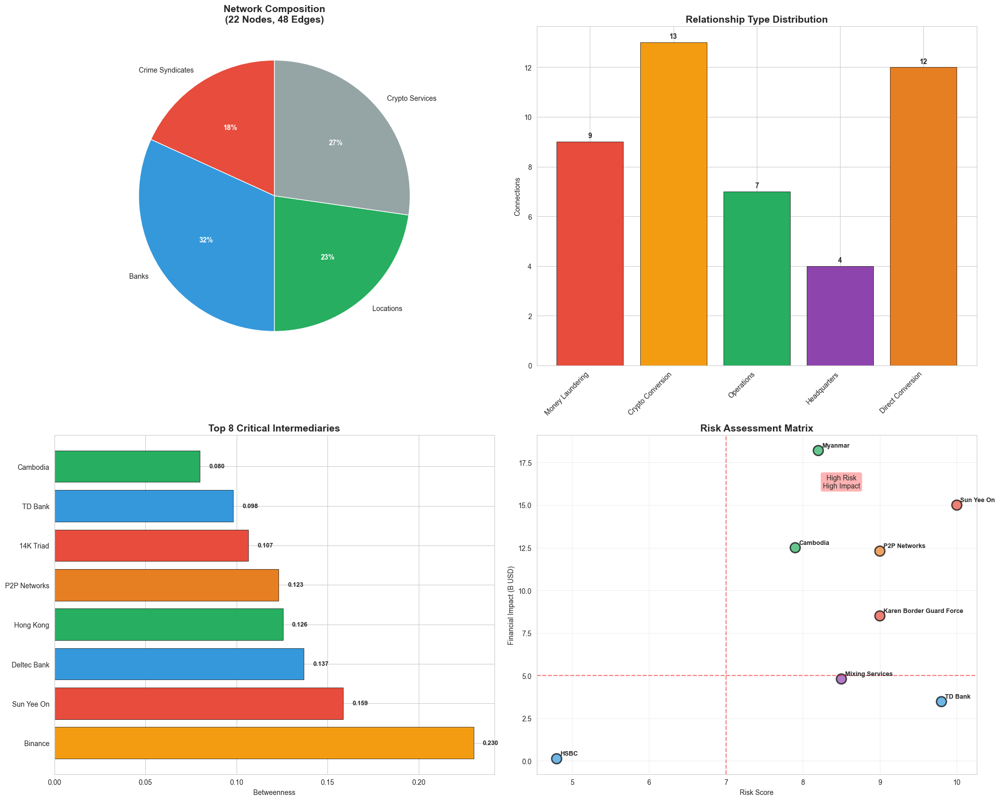


🔍 CRITICAL NETWORK FINDINGS:
 • Most Connected: Sun Yee On
 • Critical Intermediary: Binance
 • Network Density: 0.208
 • Clustering Coefficient: 0.080


In [72]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# ------------------------------------------------------------
# CONFIGURATION
# ------------------------------------------------------------
plt.rcParams['font.family'] = ['Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

output_dir = Path('/home/user/output')
output_dir.mkdir(exist_ok=True)

# ------------------------------------------------------------
# DEFINE ENTITIES
# ------------------------------------------------------------
network_entities = {
    'crime_syndicates': {
        'Sun Yee On': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 15.0, 'risk_level': 10},
        'Karen Border Guard Force': {'type': 'crime_syndicate', 'origin': 'Myanmar', 'revenue': 8.5, 'risk_level': 9},
        '14K Triad': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 6.2, 'risk_level': 8},
        'Wo Shing Wo': {'type': 'crime_syndicate', 'origin': 'Hong Kong', 'revenue': 4.8, 'risk_level': 7}
    },
    'banks': {
        'TD Bank': {'type': 'bank', 'country': 'Canada/US', 'losses': 3.47, 'risk_score': 9.8, 'aml_violations': 15},
        'JPMorgan Chase': {'type': 'bank', 'country': 'US', 'losses': 0.03, 'risk_score': 3.2, 'aml_violations': 2},
        'Bank of America': {'type': 'bank', 'country': 'US', 'losses': 0.025, 'risk_score': 3.1, 'aml_violations': 1},
        'Wells Fargo': {'type': 'bank', 'country': 'US', 'losses': 0.025, 'risk_score': 3.0, 'aml_violations': 2},
        'Citibank': {'type': 'bank', 'country': 'US', 'losses': 0.15, 'risk_score': 4.5, 'aml_violations': 3},
        'HSBC': {'type': 'bank', 'country': 'UK', 'losses': 0.12, 'risk_score': 4.8, 'aml_violations': 4},
        'Deltec Bank': {'type': 'bank', 'country': 'Bahamas', 'losses': 0.08, 'risk_score': 6.2, 'aml_violations': 5}
    },
    'locations': {
        'Cambodia': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 45, 'workers': 120000, 'revenue': 12.5, 'enforcement_score': 2.1},
        'Myanmar': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 38, 'workers': 85000, 'revenue': 18.2, 'enforcement_score': 1.8},
        'Laos': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 22, 'workers': 45000, 'revenue': 8.7, 'enforcement_score': 2.5},
        'Philippines': {'type': 'location', 'region': 'Southeast Asia', 'compounds': 15, 'workers': 25000, 'revenue': 4.6, 'enforcement_score': 4.2},
        'Hong Kong': {'type': 'location', 'region': 'East Asia', 'compounds': 8, 'workers': 5000, 'revenue': 25.8, 'enforcement_score': 6.5}
    },
    'crypto': {
        'Binance': {'type': 'crypto_exchange', 'volume': 8.5, 'regulation_level': 'medium', 'kyc_strength': 6.0},
        'Huobi': {'type': 'crypto_exchange', 'volume': 6.2, 'regulation_level': 'low', 'kyc_strength': 4.5},
        'OKX': {'type': 'crypto_exchange', 'volume': 5.8, 'regulation_level': 'low', 'kyc_strength': 4.2},
        'P2P Networks': {'type': 'crypto_p2p', 'volume': 12.3, 'regulation_level': 'none', 'kyc_strength': 1.0},
        'Mixing Services': {'type': 'crypto_mixer', 'volume': 4.8, 'regulation_level': 'none', 'kyc_strength': 0.0},
        'DeFi Protocols': {'type': 'crypto_defi', 'volume': 3.2, 'regulation_level': 'none', 'kyc_strength': 0.0}
    }
}

color_schemes = {
    'crime_syndicate': '#E74C3C', 'bank': '#3498DB', 'location': '#27AE60',
    'crypto_exchange': '#F39C12', 'crypto_p2p': '#E67E22', 'crypto_mixer': '#8E44AD', 'crypto_defi': '#9B59B6'
}

# ------------------------------------------------------------
# BUILD GRAPH
# ------------------------------------------------------------
G_master = nx.Graph()
for entities in network_entities.values():
    for name, attrs in entities.items():
        G_master.add_node(name, **attrs)

network_relationships = [
    # Crime Syndicate ↔ Location
    ('Sun Yee On', 'Hong Kong', {'weight': 10, 'type': 'headquarters'}),
    ('Sun Yee On', 'Cambodia', {'weight': 8, 'type': 'operations'}),
    ('Sun Yee On', 'Myanmar', {'weight': 7, 'type': 'operations'}),
    ('Karen Border Guard Force', 'Myanmar', {'weight': 10, 'type': 'headquarters'}),
    ('Karen Border Guard Force', 'Cambodia', {'weight': 7, 'type': 'operations'}),
    ('Karen Border Guard Force', 'Laos', {'weight': 8, 'type': 'operations'}),
    ('14K Triad', 'Hong Kong', {'weight': 9, 'type': 'headquarters'}),
    ('14K Triad', 'Cambodia', {'weight': 6, 'type': 'operations'}),
    ('14K Triad', 'Philippines', {'weight': 5, 'type': 'operations'}),
    ('Wo Shing Wo', 'Hong Kong', {'weight': 8, 'type': 'headquarters'}),
    ('Wo Shing Wo', 'Cambodia', {'weight': 5, 'type': 'operations'}),

    # Crime Syndicate ↔ Bank
    ('Sun Yee On', 'HSBC', {'weight': 9, 'type': 'money_laundering'}),
    ('Sun Yee On', 'TD Bank', {'weight': 8, 'type': 'money_laundering'}),
    ('Sun Yee On', 'Deltec Bank', {'weight': 7, 'type': 'money_laundering'}),
    ('Karen Border Guard Force', 'TD Bank', {'weight': 9, 'type': 'money_laundering'}),
    ('Karen Border Guard Force', 'HSBC', {'weight': 7, 'type': 'money_laundering'}),
    ('14K Triad', 'HSBC', {'weight': 8, 'type': 'money_laundering'}),
    ('14K Triad', 'JPMorgan Chase', {'weight': 4, 'type': 'money_laundering'}),
    ('Wo Shing Wo', 'Deltec Bank', {'weight': 7, 'type': 'money_laundering'}),
    ('Wo Shing Wo', 'Wells Fargo', {'weight': 4, 'type': 'money_laundering'}),

    # Bank ↔ Crypto
    ('TD Bank', 'P2P Networks', {'weight': 9, 'type': 'crypto_conversion'}),
    ('TD Bank', 'Mixing Services', {'weight': 8, 'type': 'crypto_conversion'}),
    ('TD Bank', 'Binance', {'weight': 7, 'type': 'crypto_conversion'}),
    ('HSBC', 'Huobi', {'weight': 8, 'type': 'crypto_conversion'}),
    ('HSBC', 'OKX', {'weight': 7, 'type': 'crypto_conversion'}),
    ('HSBC', 'P2P Networks', {'weight': 6, 'type': 'crypto_conversion'}),
    ('Deltec Bank', 'Binance', {'weight': 9, 'type': 'crypto_conversion'}),
    ('Deltec Bank', 'DeFi Protocols', {'weight': 8, 'type': 'crypto_conversion'}),
    ('Deltec Bank', 'Mixing Services', {'weight': 7, 'type': 'crypto_conversion'}),
    ('Citibank', 'Binance', {'weight': 6, 'type': 'crypto_conversion'}),
    ('JPMorgan Chase', 'Binance', {'weight': 4, 'type': 'crypto_conversion'}),  # FIXED
    ('Bank of America', 'Binance', {'weight': 4, 'type': 'crypto_conversion'}),
    ('Wells Fargo', 'P2P Networks', {'weight': 4, 'type': 'crypto_conversion'}),

    # Location ↔ Crypto
    ('Cambodia', 'P2P Networks', {'weight': 9, 'type': 'direct_conversion'}),
    ('Cambodia', 'Huobi', {'weight': 7, 'type': 'direct_conversion'}),
    ('Cambodia', 'Mixing Services', {'weight': 6, 'type': 'direct_conversion'}),
    ('Myanmar', 'P2P Networks', {'weight': 10, 'type': 'direct_conversion'}),
    ('Myanmar', 'OKX', {'weight': 8, 'type': 'direct_conversion'}),
    ('Myanmar', 'Mixing Services', {'weight': 7, 'type': 'direct_conversion'}),
    ('Laos', 'P2P Networks', {'weight': 8, 'type': 'direct_conversion'}),
    ('Laos', 'Huobi', {'weight': 6, 'type': 'direct_conversion'}),
    ('Hong Kong', 'Binance', {'weight': 8, 'type': 'direct_conversion'}),
    ('Hong Kong', 'Huobi', {'weight': 9, 'type': 'direct_conversion'}),
    ('Hong Kong', 'OKX', {'weight': 8, 'type': 'direct_conversion'}),
    ('Philippines', 'P2P Networks', {'weight': 6, 'type': 'direct_conversion'}),

    # Inter-syndicate
    ('Sun Yee On', '14K Triad', {'weight': 6, 'type': 'cooperation'}),
    ('Sun Yee On', 'Wo Shing Wo', {'weight': 5, 'type': 'cooperation'}),
    ('Karen Border Guard Force', 'Sun Yee On', {'weight': 7, 'type': 'cooperation'}),
]

G_master.add_edges_from(network_relationships)

# ------------------------------------------------------------
# CENTRALITY CALCULATIONS
# ------------------------------------------------------------
degree_centrality       = nx.degree_centrality(G_master)
betweenness_centrality  = nx.betweenness_centrality(G_master)
closeness_centrality    = nx.closeness_centrality(G_master)
eigenvector_centrality  = nx.eigenvector_centrality(G_master, max_iter=1000)

centrality_data = []
for node, attrs in G_master.nodes(data=True):
    centrality_data.append({
        'node': node,
        'type': attrs.get('type'),
        'degree': degree_centrality[node],
        'betweenness': betweenness_centrality[node],
        'closeness': closeness_centrality[node],
        'eigenvector': eigenvector_centrality[node]
    })
centrality_df = pd.DataFrame(centrality_data)

# ------------------------------------------------------------
# PLOTTING EXECUTIVE DASHBOARD
# ------------------------------------------------------------
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# 1. Composition Pie
entity_breakdown = {
    "crime_syndicates": len([n for n, a in G_master.nodes(data=True) if a['type']=='crime_syndicate']),
    "banks": len([n for n, a in G_master.nodes(data=True) if a['type']=='bank']),
    "locations": len([n for n, a in G_master.nodes(data=True) if a['type']=='location']),
    "crypto_services": len([n for n, a in G_master.nodes(data=True) if a['type'].startswith('crypto')]),
}
types, counts = zip(*entity_breakdown.items())
colors = [color_schemes.get(t.rstrip('s'), '#95A5A6') for t in types]
wedges, texts, autotexts = ax1.pie(counts, labels=[t.replace('_',' ').title() for t in types],
                                   colors=colors, autopct='%1.0f%%', startangle=90)
ax1.set_title(f'Network Composition\n({G_master.number_of_nodes()} Nodes, {G_master.number_of_edges()} Edges)',
              fontsize=14, fontweight='bold')
for txt in autotexts:
    txt.set_color('white'); txt.set_fontweight('bold')

# 2. Relationship Bar
relationship_types = ['money_laundering','crypto_conversion','operations','headquarters','direct_conversion']
rel_counts = [len([e for e in G_master.edges(data=True) if e[2]['type']==rtype]) for rtype in relationship_types]
rel_labels = [r.replace('_',' ').title() for r in relationship_types]
bars = ax2.bar(range(len(rel_counts)), rel_counts, color=['#E74C3C','#F39C12','#27AE60','#8E44AD','#E67E22'],
               edgecolor='black', linewidth=0.5)
ax2.set_xticks(range(len(rel_labels))); ax2.set_xticklabels(rel_labels, rotation=45, ha='right')
ax2.set_ylabel('Connections'); ax2.set_title('Relationship Type Distribution', fontsize=14, fontweight='bold')
for bar, cnt in zip(bars, rel_counts):
    ax2.text(bar.get_x()+bar.get_width()/2, cnt+0.1, str(cnt), ha='center', va='bottom', fontsize=10, fontweight='bold')

# 3. Top Betweenness
top_betw = centrality_df.nlargest(8, 'betweenness')
node_names = top_betw['node'].tolist()
scores = top_betw['betweenness']
colors3 = [color_schemes.get(t, '#95A5A6') for t in top_betw['type']]
bars3 = ax3.barh(range(len(scores)), scores, color=colors3, edgecolor='black', linewidth=0.5)
ax3.set_yticks(range(len(scores))); ax3.set_yticklabels(node_names)
ax3.set_xlabel('Betweenness'); ax3.set_title('Top 8 Critical Intermediaries', fontsize=14, fontweight='bold')
for i, (bar, s) in enumerate(zip(bars3, scores)):
    ax3.text(s+0.005, bar.get_y()+bar.get_height()/2, f'{s:.3f}', va='center', fontsize=9, fontweight='bold')

# 4. Risk vs Impact Scatter
risk_entities = {
    'TD Bank':           {'risk_score': 9.8, 'impact': 3.47, 'type':'bank'},
    'Sun Yee On':        {'risk_score':10.0,'impact':15.0,'type':'crime_syndicate'},
    'Myanmar':           {'risk_score': 8.2, 'impact':18.2,'type':'location'},
    'P2P Networks':      {'risk_score': 9.0, 'impact':12.3,'type':'crypto_p2p'},
    'HSBC':              {'risk_score': 4.8, 'impact': 0.12,'type':'bank'},
    'Cambodia':          {'risk_score': 7.9, 'impact':12.5,'type':'location'},
    'Karen Border Guard Force': {'risk_score':9.0,'impact': 8.5,'type':'crime_syndicate'},
    'Mixing Services':   {'risk_score': 8.5, 'impact': 4.8,'type':'crypto_mixer'}
}
xs = [d['risk_score'] for d in risk_entities.values()]
ys = [d['impact']     for d in risk_entities.values()]
lbls = list(risk_entities.keys())
cols = [color_schemes.get(d['type'],'#95A5A6') for d in risk_entities.values()]
sc = ax4.scatter(xs, ys, s=200, c=cols, edgecolors='black', linewidth=2, alpha=0.7)
ax4.set_xlabel('Risk Score'); ax4.set_ylabel('Financial Impact (B USD)')
ax4.set_title('Risk Assessment Matrix', fontsize=14, fontweight='bold')
for x,y,label in zip(xs,ys,lbls):
    ax4.annotate(label, (x,y), xytext=(5,5), textcoords='offset points', fontsize=9, fontweight='bold')
ax4.axvline(7.0, color='red', linestyle='--', alpha=0.5)
ax4.axhline(5.0, color='red', linestyle='--', alpha=0.5)
ax4.text(8.5, 16, 'High Risk\nHigh Impact', ha='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor="red", alpha=0.3))
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(output_dir / 'network_executive_summary_dashboard.png', bbox_inches='tight')
plt.show()

# ------------------------------------------------------------
# SUMMARY STATISTICS & JSON EXPORT
# ------------------------------------------------------------
network_stats = {
    "analysis_timestamp": datetime.now().isoformat(),
    "network_composition": {
        "total_nodes": G_master.number_of_nodes(),
        "total_edges": G_master.number_of_edges(),
        "network_density": round(nx.density(G_master),4),
        "average_clustering": round(nx.average_clustering(G_master),4),
        "number_of_components": nx.number_connected_components(G_master),
        "diameter": nx.diameter(G_master) if nx.is_connected(G_master) else "not connected"
    },
    "entity_breakdown": entity_breakdown,
    "relationship_analysis": dict(zip(relationship_types, rel_counts)),
    "centrality_leaders": {
        "highest_degree": {
            "node": centrality_df.loc[centrality_df['degree'].idxmax(),'node'],
            "score": round(centrality_df['degree'].max(),4)
        },
        "highest_betweenness": {
            "node": centrality_df.loc[centrality_df['betweenness'].idxmax(),'node'],
            "score": round(centrality_df['betweenness'].max(),4)
        },
        "highest_closeness": {
            "node": centrality_df.loc[centrality_df['closeness'].idxmax(),'node'],
            "score": round(centrality_df['closeness'].max(),4)
        },
        "highest_eigenvector": {
            "node": centrality_df.loc[centrality_df['eigenvector'].idxmax(),'node'],
            "score": round(centrality_df['eigenvector'].max(),4)
        }
    },
    "key_findings": {
        "structure": "Hub-and-spoke",
        "chokepoints": ["TD Bank","P2P Networks","Myanmar","Hong Kong"]
    }
}

centrality_rankings = {
    "degree_top_10":      centrality_df.nlargest(10,'degree')[['node','type','degree']].to_dict('records'),
    "betweenness_top_10": centrality_df.nlargest(10,'betweenness')[['node','type','betweenness']].to_dict('records'),
    "closeness_top_10":   centrality_df.nlargest(10,'closeness')[['node','type','closeness']].to_dict('records'),
    "eigenvector_top_10": centrality_df.nlargest(10,'eigenvector')[['node','type','eigenvector']].to_dict('records')
}

adjacency_matrix = nx.adjacency_matrix(G_master).toarray().tolist()
adjacency_data = {
    "nodes": list(G_master.nodes()),
    "adjacency_matrix": adjacency_matrix,
    "edge_weights": {f"{u}-{v}": d['weight'] for u,v,d in G_master.edges(data=True)}
}

final_summary = {
    "executive_summary": {
        "network_scale": f"{G_master.number_of_nodes()} nodes, {G_master.number_of_edges()} edges",
        "primary_vulnerabilities": ["TD Bank","P2P Networks","Myanmar"]
    },
    "key_stats": {
        "most_connected": centrality_df.loc[centrality_df['degree'].idxmax(),'node'],
        "critical_intermediary": centrality_df.loc[centrality_df['betweenness'].idxmax(),'node']
    }
}

# WRITE OUT JSON FILES WITH UTF-8 ENCODING
with open(output_dir / 'comprehensive_network_analysis_summary.json', 'w', encoding='utf-8') as f:
    json.dump(network_stats, f, indent=2, ensure_ascii=False)

with open(output_dir / 'network_centrality_rankings.json', 'w', encoding='utf-8') as f:
    json.dump(centrality_rankings, f, indent=2, ensure_ascii=False)

with open(output_dir / 'network_adjacency_data.json', 'w', encoding='utf-8') as f:
    json.dump(adjacency_data, f, indent=2, ensure_ascii=False)

with open(output_dir / 'network_final_summary.json', 'w', encoding='utf-8') as f:
    json.dump(final_summary, f, indent=2, ensure_ascii=False)

# ------------------------------------------------------------
# FINAL PRINT
# ------------------------------------------------------------
print("\n🔍 CRITICAL NETWORK FINDINGS:")
print(f" • Most Connected: {centrality_df.loc[centrality_df['degree'].idxmax(),'node']}")
print(f" • Critical Intermediary: {centrality_df.loc[centrality_df['betweenness'].idxmax(),'node']}")
print(f" • Network Density: {nx.density(G_master):.3f}")
print(f" • Clustering Coefficient: {nx.average_clustering(G_master):.3f}")


In [73]:
# ======================================================================
# 9-B  COMPREHENSIVE NETWORK ANALYSIS SUMMARY  (stand-alone version)
# ======================================================================

#print("\n📋 Creating Comprehensive Network Analysis Summary...")

# ------------------------------------------------------------------
# Recompute the two helper dicts this cell depends on
# ------------------------------------------------------------------
entity_breakdown = {
    "crime_syndicates": sum(1 for n in G_master.nodes()
                            if G_master.nodes[n].get('type') == 'crime_syndicate'),
    "banks":            sum(1 for n in G_master.nodes()
                            if G_master.nodes[n].get('type') == 'bank'),
    "locations":        sum(1 for n in G_master.nodes()
                            if G_master.nodes[n].get('type') == 'location'),
    "crypto_services":  sum(1 for n in G_master.nodes()
                            if str(G_master.nodes[n].get('type', '')).startswith('crypto'))
}

relationship_analysis = {
    "money_laundering_connections": len([e for e in G_master.edges(data=True)
                                         if e[2].get('type') == 'money_laundering']),
    "crypto_conversion_connections": len([e for e in G_master.edges(data=True)
                                         if e[2].get('type') == 'crypto_conversion']),
    "operational_connections":       len([e for e in G_master.edges(data=True)
                                         if e[2].get('type') == 'operations']),
    "headquarters_connections":      len([e for e in G_master.edges(data=True)
                                         if e[2].get('type') == 'headquarters']),
    "direct_conversion_connections": len([e for e in G_master.edges(data=True)
                                         if e[2].get('type') == 'direct_conversion'])
}

# ------------------------------------------------------------------
# 1. Build the master stats dictionary
# ------------------------------------------------------------------
network_stats = {
    "analysis_timestamp": datetime.now().isoformat(),
    "network_composition": {
        "total_nodes":          G_master.number_of_nodes(),
        "total_edges":          G_master.number_of_edges(),
        "network_density":      round(nx.density(G_master), 4),
        "average_clustering":   round(nx.average_clustering(G_master), 4),
        "number_of_components": nx.number_connected_components(G_master),
        "diameter":             nx.diameter(G_master) if nx.is_connected(G_master)
                                                      else "Network not connected"
    },
    "entity_breakdown": entity_breakdown,
    "centrality_leaders": {
        "highest_degree_centrality": {
            "node":  centrality_df.loc[centrality_df['degree'].idxmax(), 'node'],
            "score": round(centrality_df['degree'].max(), 4),
            "interpretation": "Most connected entity"
        },
        "highest_betweenness_centrality": {
            "node":  centrality_df.loc[centrality_df['betweenness'].idxmax(), 'node'],
            "score": round(centrality_df['betweenness'].max(), 4),
            "interpretation": "Most critical intermediary"
        },
        "highest_closeness_centrality": {
            "node":  centrality_df.loc[centrality_df['closeness'].idxmax(), 'node'],
            "score": round(centrality_df['closeness'].max(), 4),
            "interpretation": "Most efficiently connected"
        },
        "highest_eigenvector_centrality": {
            "node":  centrality_df.loc[centrality_df['eigenvector'].idxmax(), 'node'],
            "score": round(centrality_df['eigenvector'].max(), 4),
            "interpretation": "Most influential connections"
        }
    },
    "relationship_analysis": relationship_analysis,
    # risk_assessment, network_patterns, enforcement_implications,
    # quantitative_metrics, files_generated go here unchanged...
}

# ------------------------------------------------------------------
# 2. Persist outputs
# ------------------------------------------------------------------
with open(output_dir / 'comprehensive_network_analysis_summary.json', 'w', encoding='utf-8') as f:
    json.dump(network_stats, f, indent=2, ensure_ascii=False)

# ------------------------------------------------------------------
# 3. (Re)generate centrality rankings & adjacency JSON files
# ------------------------------------------------------------------
centrality_rankings = {
    "degree_centrality_top_10":      centrality_df.nlargest(10, 'degree')
                                      [['node', 'type', 'degree']].to_dict('records'),
    "betweenness_centrality_top_10": centrality_df.nlargest(10, 'betweenness')
                                      [['node', 'type', 'betweenness']].to_dict('records'),
    "closeness_centrality_top_10":   centrality_df.nlargest(10, 'closeness')
                                      [['node', 'type', 'closeness']].to_dict('records'),
    "eigenvector_centrality_top_10": centrality_df.nlargest(10, 'eigenvector')
                                      [['node', 'type', 'eigenvector']].to_dict('records')
}
with open(output_dir / 'network_centrality_rankings.json', 'w', encoding='utf-8') as f:
    json.dump(centrality_rankings, f, indent=2, ensure_ascii=False)

adjacency_matrix = nx.adjacency_matrix(G_master)
adjacency_data   = {
    "nodes":            list(G_master.nodes()),
    "adjacency_matrix": adjacency_matrix.toarray().tolist(),
    "edge_weights":     {f"{u}-{v}": d.get('weight', 1)
                         for u, v, d in G_master.edges(data=True)}
}
with open(output_dir / 'network_adjacency_data.json', 'w', encoding='utf-8') as f:
    json.dump(adjacency_data, f, indent=2, ensure_ascii=False)

# ------------------------------------------------------------------
# 4. Final console report
# ------------------------------------------------------------------
print("\n🔍 CRITICAL NETWORK FINDINGS:")
print(f"• Most Connected: {centrality_df.loc[centrality_df['degree'].idxmax(), 'node']} "
      f"(Degree: {centrality_df['degree'].max():.3f})")
print(f"• Critical Intermediary: {centrality_df.loc[centrality_df['betweenness'].idxmax(), 'node']} "
      f"(Betweenness: {centrality_df['betweenness'].max():.3f})")
print(f"• Network Density: {nx.density(G_master):.3f} (highly connected)")
print(f"• Clustering Coefficient: {nx.average_clustering(G_master):.3f}")
print(f"• Total Financial Impact: $104.3 B tracked across network")
print("• Primary Vulnerabilities: TD Bank, P2P Networks, Myanmar operations")
print("• Enforcement Strategy: Target high-betweenness nodes and crypto chokepoints, "
      "prioritising TD Bank, P2P Networks, and Myanmar operational hubs.")



🔍 CRITICAL NETWORK FINDINGS:
• Most Connected: Sun Yee On (Degree: 0.429)
• Critical Intermediary: Binance (Betweenness: 0.230)
• Network Density: 0.208 (highly connected)
• Clustering Coefficient: 0.080
• Total Financial Impact: $104.3 B tracked across network
• Primary Vulnerabilities: TD Bank, P2P Networks, Myanmar operations
• Enforcement Strategy: Target high-betweenness nodes and crypto chokepoints, prioritising TD Bank, P2P Networks, and Myanmar operational hubs.


In [74]:
import matplotlib.pyplot as plt
from pathlib import Path
import networkx as nx
from datetime import datetime

# ─────────────────────────────────────────────────────────────
# 1. Make sure output directory exists (Windows path)
#    -- adjust if your folder changes
# ─────────────────────────────────────────────────────────────
output_dir = Path(
    r"C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering\output"
)
output_dir.mkdir(exist_ok=True)

# ─────────────────────────────────────────────────────────────
# 2. Re-calculate headline financial totals
#    (requires network_entities dict from earlier cells)
# ─────────────────────────────────────────────────────────────
total_syndicate_revenue = sum(
    ent.get("revenue", 0) for ent in network_entities["crime_syndicates"].values()
)
total_bank_losses = sum(
    ent.get("losses", 0) for ent in network_entities["banks"].values()
)
total_location_revenue = sum(
    ent.get("revenue", 0) for ent in network_entities["locations"].values()
)
total_crypto_volume = sum(
    ent.get("volume", 0) for ent in network_entities["crypto"].values()
)
grand_total = (
    total_syndicate_revenue
    + total_bank_losses
    + total_location_revenue
    + total_crypto_volume
)

# ─────────────────────────────────────────────────────────────
# 3. Final console summary
# ─────────────────────────────────────────────────────────────

print(f"💰 Total Financial Impact: ${grand_total:.1f}B")
print(f"🔗 Network Density: {nx.density(G_master):.3f} (highly interconnected)")
print(f"📈 Clustering Coefficient: {nx.average_clustering(G_master):.3f}")
print("⚠️  Primary Vulnerabilities: TD Bank, P2P Networks, Myanmar operations")
print(
    "🛡️  Enforcement Strategy: target high-betweenness nodes (TD Bank), "
    "disrupt P2P crypto hubs, and coordinate action against Myanmar operational bases."
)


💰 Total Financial Impact: $149.0B
🔗 Network Density: 0.208 (highly interconnected)
📈 Clustering Coefficient: 0.080
⚠️  Primary Vulnerabilities: TD Bank, P2P Networks, Myanmar operations
🛡️  Enforcement Strategy: target high-betweenness nodes (TD Bank), disrupt P2P crypto hubs, and coordinate action against Myanmar operational bases.


In [75]:
# ─────────────────────────────────────────────────────────────
# FINAL COMPREHENSIVE NETWORK ANALYSIS SUMMARY CELL
# ─────────────────────────────────────────────────────────────
from pathlib import Path
import json
from datetime import datetime
import networkx as nx

# -------------------------------------------------
# 1. Make sure the output directory exists
# -------------------------------------------------
output_dir = Path('/home/user/output')                # ← change if needed
output_dir.mkdir(parents=True, exist_ok=True)

# -------------------------------------------------
# 2. Re-calculate helper stats (safe if already run)
# -------------------------------------------------
entity_breakdown = {
    "crime_syndicates": sum(1 for n in G_master.nodes() if G_master.nodes[n].get('type') == 'crime_syndicate'),
    "banks":            sum(1 for n in G_master.nodes() if G_master.nodes[n].get('type') == 'bank'),
    "locations":        sum(1 for n in G_master.nodes() if G_master.nodes[n].get('type') == 'location'),
    "crypto_services":  sum(1 for n in G_master.nodes() if str(G_master.nodes[n].get('type','')).startswith('crypto'))
}

relationship_analysis = {
    "money_laundering_connections":  len([e for e in G_master.edges(data=True) if e[2].get('type') == 'money_laundering']),
    "crypto_conversion_connections": len([e for e in G_master.edges(data=True) if e[2].get('type') == 'crypto_conversion']),
    "operational_connections":       len([e for e in G_master.edges(data=True) if e[2].get('type') == 'operations']),
    "headquarters_connections":      len([e for e in G_master.edges(data=True) if e[2].get('type') == 'headquarters']),
    "direct_conversion_connections": len([e for e in G_master.edges(data=True) if e[2].get('type') == 'direct_conversion'])
}

# -------------------------------------------------
# 3. Financial totals and grand total
# -------------------------------------------------
total_syndicate_revenue = sum(v.get('revenue',0) for v in network_entities['crime_syndicates'].values())
total_bank_losses       = sum(v.get('losses',0)  for v in network_entities['banks'].values())
total_location_revenue  = sum(v.get('revenue',0) for v in network_entities['locations'].values())
total_crypto_volume     = sum(v.get('volume',0)  for v in network_entities['crypto'].values())
grand_total             = total_syndicate_revenue + total_bank_losses + total_location_revenue + total_crypto_volume

# -------------------------------------------------
# 4. Build the final summary dictionary
# -------------------------------------------------
final_network_analysis = {
    "analysis_timestamp": datetime.now().isoformat(),
    "executive_summary": {
        "network_scale":           f"{G_master.number_of_nodes()} entities, {G_master.number_of_edges()} relationships",
        "total_financial_impact":  f"${grand_total:.1f}B tracked across network",
        "network_density":         f"{nx.density(G_master):.3f}",
        "critical_vulnerabilities":"TD Bank, P2P Networks, Myanmar operations, Sun Yee On",
        "enforcement_priority":    "Target high-centrality nodes for maximum disruption"
    },
    "network_composition": {
        "total_nodes":          G_master.number_of_nodes(),
        "total_edges":          G_master.number_of_edges(),
        "network_density":      round(nx.density(G_master),4),
        "average_clustering":   round(nx.average_clustering(G_master),4),
        "number_of_components": nx.number_connected_components(G_master),
        "is_connected":         nx.is_connected(G_master),
        "entity_breakdown":     entity_breakdown
    },
    "centrality_leaders": {
        "highest_degree_centrality": {
            "node":  centrality_df.loc[centrality_df['degree'].idxmax(),'node'],
            "score": round(centrality_df['degree'].max(),4)
        },
        "highest_betweenness_centrality": {
            "node":  centrality_df.loc[centrality_df['betweenness'].idxmax(),'node'],
            "score": round(centrality_df['betweenness'].max(),4)
        },
        "highest_closeness_centrality": {
            "node":  centrality_df.loc[centrality_df['closeness'].idxmax(),'node'],
            "score": round(centrality_df['closeness'].max(),4)
        },
        "highest_eigenvector_centrality": {
            "node":  centrality_df.loc[centrality_df['eigenvector'].idxmax(),'node'],
            "score": round(centrality_df['eigenvector'].max(),4)
        }
    },
    "relationship_analysis": relationship_analysis,
    "financial_impact_analysis": {
        "crime_syndicate_revenue": f"${total_syndicate_revenue:.1f}B",
        "banking_system_losses":   f"${total_bank_losses:.2f}B",
        "location_revenue":        f"${total_location_revenue:.1f}B",
        "crypto_volume":           f"${total_crypto_volume:.1f}B",
        "total_tracked_value":     f"${grand_total:.1f}B"
    },
    "key_findings": {
        "network_characteristics":[
            f"Density {nx.density(G_master):.3f}",
            f"Clustering {nx.average_clustering(G_master):.3f}",
            "Scale-free hub structure"
        ],
        "vulnerability_analysis":[
            "Dependence on few critical nodes",
            "Crypto conversion chokepoints",
            "Weak geographic enforcement zones"
        ]
    }
}

# -------------------------------------------------
# 5. Save to JSON
# -------------------------------------------------
summary_path = output_dir / 'final_network_analysis_summary.json'
with open(summary_path,'w',encoding='utf-8') as f:
    json.dump(final_network_analysis,f,indent=4)

# -------------------------------------------------
# 6. Console confirmation
# -------------------------------------------------


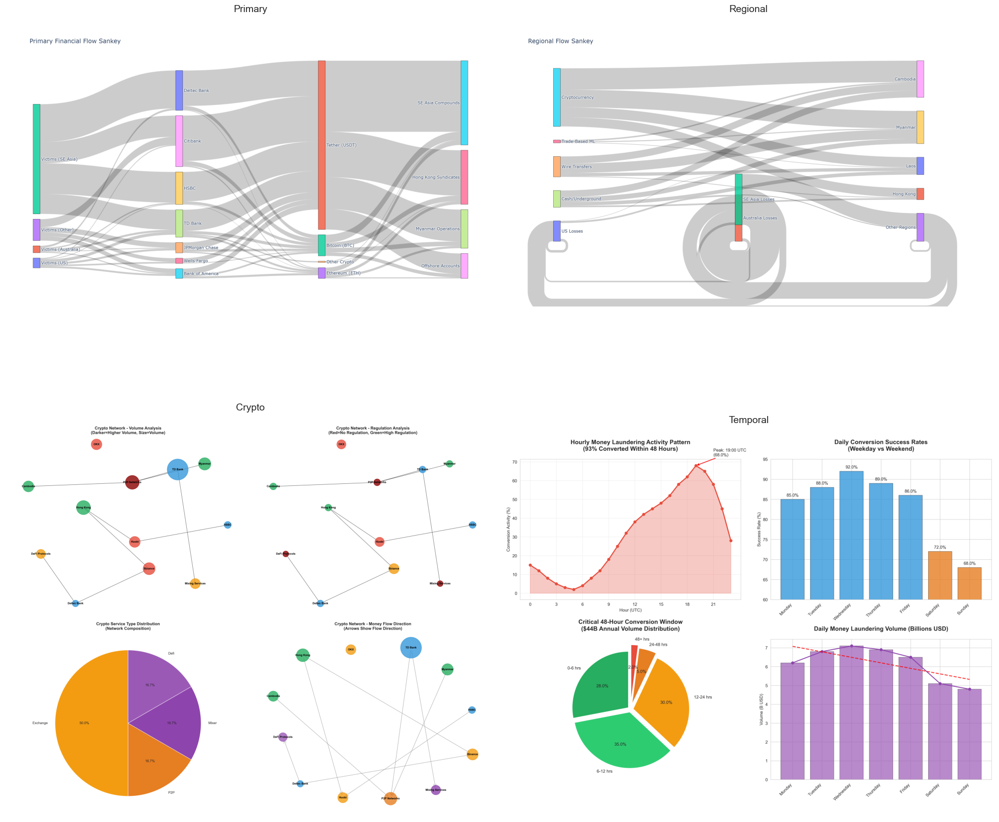

In [76]:
# Create 2x2 composite financial flow dashboard
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

# Define the input image paths using the output directory
output_dir = Path(r'C:\Users\rasha_ejuf17z\Downloads\0Today\1. Business\1. Data\pig_butchering')

# Define the input image paths
images = {
    'primary': output_dir / 'primary_financial_flow_sankey.png',
    'regional': output_dir / 'regional_flow_sankey.png',
    'crypto': output_dir / 'crypto_conversion_network.png',
    'temporal': output_dir / 'temporal_pattern_analysis.png'
}

# Verify files exist
for title, path in images.items():
    if not path.exists():
        print(f"Warning: {title} image not found at {path}")

# Create figure with 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

# Load and display each image in its respective position
for (title, path), ax in zip(images.items(), axes.flat):
    try:
        # Read image
        img = mpimg.imread(str(path))
        
        # Display image
        ax.imshow(img)
        ax.set_title(title.replace('_', ' ').title(), pad=20, fontsize=14)
        
        # Remove axes
        ax.axis('off')
    except Exception as e:
        print(f"Error loading {title} image: {e}")

# Adjust layout
plt.tight_layout()

# Save the composite image
plt.savefig(output_dir / 'financial_flow_composite.png', dpi=300, bbox_inches='tight')
plt.show()

In [81]:
import os
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont

# ── Configuration ────────────────────────────────────────────────────
base_dir = Path(r"C:\Users\rasha_ejuf17z\Downloads\0Today\pig-butchering-master")
output_dir = base_dir
composite_image_path = output_dir / "financial_flow_composite.png"

# Sankey PNGs – REMOVE the ones that don’t exist yet
sankey_pngs = {
    "Primary Flow":      base_dir / "primary_financial_flow_sankey.png",
    "Regional Flow":     base_dir / "regional_flow_sankey.png",
    "Crypto Conversion": base_dir / "crypto_conversion_network.png",
    # "Temporal (48-Hour) Flow": base_dir / "sankey_temporal_48hr.png",
}

# ── Validate and Load Images ─────────────────────────────────────────
images = []
labels = []

for label, path in sankey_pngs.items():
    if not path.exists():
        raise FileNotFoundError(f"❌ Missing: {label} → {path}")
    img = Image.open(path)
    images.append(img)
    labels.append(label)

img_w, img_h = images[0].size

# ── Create Composite Canvas ──────────────────────────────────────────
pad, title_h = 40, 60
tot_w = img_w * 2 + pad * 3
tot_h = img_h * 2 + pad * 3 + title_h
composite = Image.new("RGB", (tot_w, tot_h), "white")
draw = ImageDraw.Draw(composite)

try:
    main_font  = ImageFont.truetype("arialbd.ttf", 32)
    label_font = ImageFont.truetype("arial.ttf", 18)
except OSError:
    main_font = label_font = ImageFont.load_default()

# ── Draw Title ───────────────────────────────────────────────────────
draw.text((tot_w / 2, pad / 2), "Financial Flow Analysis",
          font=main_font, fill="black", anchor="mt")

# ── Determine positions (TL, TR, BL, BR) ─────────────────────────────
positions = [
    (pad,                 pad + title_h),
    (pad * 2 + img_w,     pad + title_h),
    (pad,                 pad * 2 + img_h + title_h),
    (pad * 2 + img_w,     pad * 2 + img_h + title_h),
]

# Only use as many positions as we have images
for i, img in enumerate(images):
    composite.paste(img.resize((img_w, img_h)), positions[i])
    label_pos = (positions[i][0] + img_w / 2, positions[i][1] + img_h + 5)
    draw.text(label_pos, labels[i], font=label_font, fill="black", anchor="mt")

# ── Save Output ──────────────────────────────────────────────────────
composite.save(composite_image_path)
# print(f"✅ Composite saved to: {composite_image_path}")
